In [ ]:
from __future__ import annotations

%load_ext autoreload
%autoreload 2
import logging
import os
import pathlib
import pickle
import string

import invert4geom
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import PIL
import pygmt
import seaborn as sns
import verde as vd
import xarray as xr
from polartoolkit import maps, profiles
from polartoolkit import utils as polar_utils

import RIS_gravity_inversion.plotting as RIS_plotting
import RIS_gravity_inversion.synthetic as RIS_synth

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"

logging.getLogger().setLevel(logging.INFO)

from invert4geom import plotting, utils

In [3]:
# set grid parameters
spacing = 5e3
inversion_region = (-40e3, 260e3, -1800e3, -1400e3)
plot_region = vd.pad_region(inversion_region, -spacing)

true_density_contrast = 1476

bathymetry, _, _ = RIS_synth.load_synthetic_model(
    spacing=spacing,
    buffer=spacing * 6,
    zref=0,
    bathymetry_density_contrast=true_density_contrast,
    plot_topography=False,
    plot_gravity=False,
)

buffer_region = polar_utils.get_grid_info(bathymetry)[1]

# clip to inversion region
bathymetry = bathymetry.sel(
    easting=slice(plot_region[0], plot_region[1]),
    northing=slice(plot_region[2], plot_region[3]),
)

INFO:root:using preprocessed 5km grid since spacing is > 5km
INFO:root:returning grid with new region and/or registration, same spacing


  0%|          | 0/4941 [00:00<?, ?it/s]

In [738]:
(
    (inversion_region[1] - inversion_region[0]) / 1e3,
    (inversion_region[3] - inversion_region[2]) / 1e3,
)

(300.0, 400.0)

In [739]:
2000 / 300

6.666666666666667

# Load results of notebooks 01-07

In [4]:
damping_results = []
damping_studies = []
density_results = []
density_studies = []
best_results = []
uncertainty_results = []
constraint_points_dfs = []
sensitivity_results = []
final_bathymetries = []
final_uncertainties = []
final_stochastic_means = []
inversion_titles = [
    # "Best case scenario",
    "Best case scenario",  # "Unknown density",
    "Errors in constraints",
    "Errors in gravity",
    "Airborne survey",
    "Regional gravity field",
    "Realistic scenario",
]

for i in range(2, 8):
    damping_results_fname = f"../../results/Ross_Sea_0{i}_damping_cv_results.pickle"
    damping_study_fname = (
        f"../../results/Ross_Sea_0{i}_damping_cv_damping_cv_study.pickle"
    )

    density_results_fname = f"../../results/Ross_Sea_0{i}_density_cv_results.pickle"
    density_study_fname = (
        f"../../results/Ross_Sea_0{i}_density_cv_zref_density_cv_study.pickle"
    )

    with pathlib.Path(damping_results_fname).open("rb") as f:
        damp_results = pickle.load(f)
    with pathlib.Path(damping_study_fname).open("rb") as f:
        damp_study = pickle.load(f)

    if i == 1:
        dens_results = None
        dens_study = None
    elif i >= 6:
        density_results_fname = f"../../results/Ross_Sea_0{i}_density_cv_results.pickle"
        density_study_fname = f"../../results/Ross_Sea_0{i}_density_cv_study.pickle"
        with pathlib.Path(density_results_fname).open("rb") as f:
            dens_results = pickle.load(f)
        with pathlib.Path(density_study_fname).open("rb") as f:
            dens_study = pickle.load(f)
    else:
        with pathlib.Path(density_results_fname).open("rb") as f:
            dens_results = pickle.load(f)
        with pathlib.Path(density_study_fname).open("rb") as f:
            dens_study = pickle.load(f)

    if i == 1:
        topo_results, grav_results, parameters, elapsed_time = damp_results
        best_results.append(damp_results)
    else:
        topo_results, grav_results, parameters, elapsed_time = dens_results
        best_results.append(dens_results)

    final_bathymetry = topo_results.set_index(["northing", "easting"]).to_xarray().topo

    # clip to inversion region
    final_bathymetry = final_bathymetry.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )

    uncertainty_ds = xr.load_dataset(f"../../results/Ross_Sea_0{i}_uncertainty.nc")

    final_bathymetries.append(final_bathymetry)
    damping_results.append(damp_results)
    damping_studies.append(damp_study)
    density_results.append(dens_results)
    density_studies.append(dens_study)
    uncertainty_results.append(uncertainty_ds)

    if i == 1:
        constraint_points_dfs.append(None)
        sensitivity_results.append(None)
        final_uncert = uncertainty_ds.z_stdev
        final_stochastic_mean = uncertainty_ds.z_mean
    else:
        constraint_points_dfs.append(
            pd.read_csv(f"../../results/Ross_Sea_0{i}_constraint_points.csv")
        )
        sensitivity_results.append(
            xr.load_dataset(f"../../results/Ross_Sea_0{i}_sensitivity.nc")
        )
        final_uncert = uncertainty_ds.weighted_stdev
        final_stochastic_mean = uncertainty_ds.weighted_mean

    final_uncert = final_uncert.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )
    final_stochastic_mean = final_stochastic_mean.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )
    final_stochastic_means.append(final_stochastic_mean)
    final_uncertainties.append(final_uncert)

# Plotting function

In [5]:
profile_start = [plot_region[0], plot_region[3]]
profile_end = [plot_region[1], plot_region[2]]

In [6]:
def regional_comparison(df):
    # grid the results
    grav_grid = df.set_index(["northing", "easting"]).to_xarray()

    # calculate the true residual misfit
    grav_grid["true_res"] = grav_grid.bathymetry_grav - grav_grid.starting_gravity
    grav_grid["true_reg"] = grav_grid.gravity_anomaly - grav_grid.bathymetry_grav

    # compare with true regional
    _ = polar_utils.grd_compare(
        grav_grid.true_reg,
        grav_grid.starting_reg,
        plot=True,
        grid1_name="True regional misfit",
        grid2_name="Regional misfit",
        hist=True,
        cbar_yoffset=1,
        inset=False,
        verbose="q",
        title="difference",
        grounding_line=False,
        points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
        points_style="x.3c",
    )
    # compare with true residual
    _ = polar_utils.grd_compare(
        grav_grid.true_res,
        grav_grid.staring_res,
        plot=True,
        grid1_name="True residual misfit",
        grid2_name="Residual misfit",
        cmap="balance+h0",
        hist=True,
        cbar_yoffset=1,
        inset=False,
        verbose="q",
        title="difference",
        grounding_line=False,
        points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
        points_style="x.3c",
    )

In [7]:
def inverted_bathymetry_plot(
    final_bathymetry,
    constraint_points=None,
):
    lims = polar_utils.get_min_max(bathymetry)

    fig = maps.plot_grd(
        bathymetry,
        fig_height=10,
        cmap="rain",
        reverse_cpt=True,
        cpt_lims=lims,
        title="True bathymetry",
        cbar_label="elevation (m)",
        cbar_font="18p,Helvetica,black",
        frame=["nSWe", "xaf10000", "yaf10000"],
        hist=True,
        hist_bin_num=50,
        cbar_yoffset=1.5,
        points=constraint_points,
        points_style="x.3c",
    )

    dif = bathymetry - final_bathymetry
    dif_lims = polar_utils.get_min_max(dif, robust=True)
    fig = maps.plot_grd(
        dif,
        fig_height=10,
        cmap="balance+h0",
        cpt_lims=(-vd.maxabs(dif_lims), vd.maxabs(dif_lims)),
        title=f"RMSE: {round(utils.rmse(dif),1)} m",
        cbar_label="difference (m)",
        cbar_font="18p,Helvetica,black",
        frame=["nswe", "xaf10000", "yaf10000"],
        hist=True,
        hist_bin_num=50,
        cbar_yoffset=1.5,
        grd2_cpt=True,
        fig=fig,
        origin_shift="xshift",
        xshift_amount=1.01,
        scalebar=True,
        scale_position="jBL+o0c/-.6c",
        points=constraint_points,
        points_style="x.3c",
    )
    # add transect line
    # plot profiles location, and endpoints on map
    fig.plot(
        vd.line_coordinates(profile_start, profile_end, size=100),
        pen="2p,black",
    )
    fig.text(
        x=profile_start[0],
        y=profile_start[1],
        text="A",
        fill="white",
        font="12p,Helvetica,black",
        justify="CM",
        clearance="+tO",
        no_clip=True,
    )
    fig.text(
        x=profile_end[0],
        y=profile_end[1],
        text="A' ",
        fill="white",
        font="12p,Helvetica,black",
        justify="CM",
        clearance="+tO",
        no_clip=True,
    )

    # plot the starting bathymetry
    fig = maps.plot_grd(
        final_bathymetry,
        fig_height=10,
        cmap="rain",
        reverse_cpt=True,
        cpt_lims=lims,
        title="Inverted bathymetry",
        cbar_label="elevation (m)",
        cbar_font="18p,Helvetica,black",
        frame=["nSwe", "xaf10000", "yaf10000"],
        hist=True,
        hist_bin_num=50,
        cbar_yoffset=1.5,
        fig=fig,
        origin_shift="xshift",
        xshift_amount=1.01,
        points=constraint_points,
        points_style="x.3c",
    )
    fig.show()

In [8]:
def inverted_bathymetry_profile(
    inversion_results,
    constraint_points=None,
):
    topo_results = inversion_results[0]
    grav_results = inversion_results[1]

    prism_ds = topo_results.set_index(["northing", "easting"]).to_xarray()
    grav_ds = grav_results.set_index(["northing", "easting"]).to_xarray()

    initial_topo = prism_ds.starting_topo.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )
    final_topo = prism_ds.topo.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )

    cols = [s for s in grav_results.columns.to_list() if "_initial_misfit" in s]
    initial_residual = grav_ds.starting_gravity.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )

    cols = [s for s in grav_results.columns.to_list() if "_forward_grav" in s]
    final_forward = grav_ds[cols[-1]].sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )

    observed = grav_ds.gravity_anomaly.sel(
        easting=slice(plot_region[0], plot_region[1]),
        northing=slice(plot_region[2], plot_region[3]),
    )

    # topography data dictionary
    topo_names = [
        "Starting bed",
        "Inverted bed",
        "True bed",
    ]
    topo_grids = [
        initial_topo,
        final_topo,
        bathymetry,
    ]
    layers_dict = profiles.make_data_dict(
        names=topo_names,
        grids=topo_grids,
        colors=[  # picked from https://github.com/OrdnanceSurvey/GeoDataViz-Toolkit/blob/master/Colours/GDV%20colour%20palettes%200.7.pdf
            "255/31/91",  # red, ff1f5b
            "black",
            "0/154/222",  # blue, 009ade
        ],
    )

    # gravity data dictionary
    data_names = [
        "Initial forward gravity",
        "Final forward gravity",
        "Observed gravity",
    ]
    data_grids = [
        initial_residual,
        final_forward + grav_ds.reg,
        observed,
    ]
    data_dict = profiles.make_data_dict(
        names=data_names,
        grids=data_grids,
        colors=[  # picked from https://github.com/OrdnanceSurvey/GeoDataViz-Toolkit/blob/master/Colours/GDV%20colour%20palettes%200.7.pdf
            "255/31/91",  # red, ff1f5b
            "black",
            "0/154/222",  # blue, 009ade
        ],
    )

    fig, df_layers, df_data = profiles.plot_profile(
        "points",
        start=profile_start,
        stop=profile_end,
        num=10000,
        fig_height=8,
        data_height=4,
        fig_width=14,
        data_dict=data_dict,
        data_legend_loc="jBC+jBC",  # +o0c/.4c",
        data_legend_box="+gwhite+c0c+p1p",
        data_buffer=0.1,
        data_frame=["neSW", "xafg+lDistance (m)", "yag+lgravity (mGal)"],
        # data_frame=["nesW", "xafg", "yag+lgravity (mGal)"],
        data_pen_style=[None, None, "4_2:2p"],
        data_pen_thickness=[2, 2, 2],
        share_yaxis=True,
        layers_dict=layers_dict,
        layers_legend_loc="jBC+jBC",  # +o0c/-.2c",
        layers_legend_box="+gwhite+c0c+p1p",
        fill_layers=False,
        layers_frame=["nesW", "xafg", "yag+lelevation (m)"],
        layers_pen_thickness=[2, 2, 2],
        layers_pen_style=[None, None, "4_2:2p"],
        start_label="A",
        end_label="A' ",
        start_end_pen=None,
    )

    if constraint_points is not None:
        # get grid of min dists to nearest constraints
        min_dist = utils.normalized_mindist(
            constraint_points,
            topo_results.set_index(["northing", "easting"]).to_xarray(),
        )

        # set y height in data units for add dist to constraint points
        data_max = df_layers.drop(columns=["x", "y", "dist"]).max().max()

        df_layers = profiles.sample_grids(
            df_layers, min_dist, interpolation="b", sampled_name="min_dist"
        )

        # set color limits
        series = [5e3, 25e3]

        pygmt.makecpt(
            cmap="gray",
            series=series,
            background=True,
        )
        fig.shift_origin(
            yshift=".5c",
        )
        fig.plot(
            x=df_layers.dist,
            y=np.ones_like(df_layers.dist) * data_max,
            style="c0.1c",
            fill=df_layers.min_dist,
            cmap=True,
            no_clip=True,
        )
        fig.shift_origin(
            yshift="-.5c",
        )
        with pygmt.config(
            FONT="26p,Helvetica,black",
        ):
            fig.colorbar(
                cmap=True,
                position="jMR+w2c/.3c+jML+v+o0.2c/0c+e",
                frame=["xa+lnearest constraint", "y+lkm"],
                scale=0.001,
            )
    fig.show()
    return fig

In [ ]:
def sensitivity_plot(
    titles,
    grids,
    constraint_points=None,
    fname=None,
    num_in_top_row=2,
):
    grids = [
        g.sel(
            easting=slice(plot_region[0], plot_region[1]),
            northing=slice(plot_region[2], plot_region[3]),
        )
        for g in grids
    ]

    first_2_lims = polar_utils.get_combined_min_max(grids[0:2], robust=True)
    # cpt_lims = polar_utils.get_min_max(grids[1], robust=True)

    fig_height = 9
    for i, g in enumerate(grids):
        xshift_amount = 1

        if i == 0:
            fig = None
            origin_shift = "initialize"
            scalebar = True
        elif i == num_in_top_row:
            origin_shift = "both_shift"
            xshift_amount = -((len(grids) - 2) / 2)
            scalebar = False
        else:
            origin_shift = "xshift"
            scalebar = False

        if i < 2:  # noqa: SIM108
            cpt_lims = first_2_lims
        else:
            cpt_lims = polar_utils.get_min_max(g, robust=True)

        fig = maps.plot_grd(
            grid=g,
            fig_height=fig_height,
            title=titles[i],
            title_font="16p,Helvetica,black",
            cmap="thermal",
            cpt_lims=cpt_lims,
            cbar_label=f"uncertainty (m), mean: {round(np.nanmean(g),1)}",
            cbar_font="18p,Helvetica,black",
            hist=True,
            hist_bin_num=50,
            cbar_yoffset=1,
            fig=fig,
            origin_shift=origin_shift,
            xshift_amount=xshift_amount,
            yshift_amount=-1.02,
            scalebar=scalebar,
            scale_length=100,
            scale_position="jBR+o0c/-.6c",
        )
        if constraint_points is not None:
            fig.plot(
                x=constraint_points.easting,
                y=constraint_points.northing,
                style="x.2c",
                fill="white",
                pen="1.5p,white",
            )
        fig.text(
            position="TL",
            text=f"{string.ascii_lowercase[i]}",
            fill="white",
            pen=True,
            font="16p,Helvetica,black",
            offset="j.6/.2",
            clearance="+tO",
            no_clip=True,
        )
        if i == 0:
            # plot profiles location, and endpoints on map
            fig.plot(
                vd.line_coordinates(profile_start, profile_end, size=100),
                pen="2p,black",
            )
            fig.text(
                x=profile_start[0],
                y=profile_start[1],
                text="A",
                fill="white",
                font="12p,Helvetica,black",
                justify="CM",
                clearance="+tO",
                no_clip=True,
            )
            fig.text(
                x=profile_end[0],
                y=profile_end[1],
                text="A' ",
                fill="white",
                font="12p,Helvetica,black",
                justify="CM",
                clearance="+tO",
                no_clip=True,
            )
    if fname is not None:
        fig.savefig(fname)
    fig.show()

    return fig

In [10]:
def sensitivity_profile(
    titles,
    grids,
    constraint_points=None,
    fname=None,
    data_legend_loc="jTR+jTL+o1.5c/0c",
    **kwargs,
):
    grids = [
        g.sel(
            easting=slice(plot_region[0], plot_region[1]),
            northing=slice(plot_region[2], plot_region[3]),
        )
        for g in grids
    ]

    data_dict = profiles.make_data_dict(
        names=titles,
        grids=grids,
        colors=[  # https://www.simplifiedsciencepublishing.com/resources/best-color-palettes-for-scientific-figures-and-data-visualizations
            "216/48/52",  # red, d83034
            "0/58/125",  # dark blue, 003a7d
            "78/203/141",  # green, 4ecb8d
            "199/1/255",  # purple, c701ff
            "255/157/58",  # orange, ff9d3a
            "0/141/255",  # med blue, 008dff
            "255/115/182",  # pink, ff73b6
            "249/232/88",  # yellow, f9e858
        ],
    )

    fig, df_data = profiles.plot_data(
        "points",
        start=profile_start,
        stop=profile_end,
        num=10000,
        fig_height=4,
        fig_width=14,
        data_dict=data_dict,
        data_legend_loc=data_legend_loc,
        # data_legend_box="+gwhite",
        data_buffer=0.01,
        data_frame=["neSW", "xafg+lDistance (m)", "yag+luncertainty (m)"],
        # data_pen_style=[None,None,"4_2:2p"],
        data_pen_thickness=[2, 1.8, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5],
        share_yaxis=True,
        start_label="A",
        end_label="A' ",
        **kwargs,
    )

    if constraint_points is not None:
        # get grid of min dists to nearest constraints
        min_dist = utils.normalized_mindist(
            constraint_points,
            grids[0],
        )

        # set y height in data units for add dist to constraint points
        data_max = df_data.drop(columns=["x", "y", "dist"]).max().max()

        if kwargs.get("data_ylims") is not None:
            data_max = kwargs["data_ylims"][1]

        df_data = profiles.sample_grids(
            df_data, min_dist, interpolation="b", sampled_name="min_dist"
        )
        # set color limits
        series = [5e3, 25e3]

        pygmt.makecpt(
            cmap="gray",
            series=series,
            background=True,
        )
        fig.shift_origin(
            yshift=".2c",
        )
        fig.plot(
            x=df_data.dist,
            y=np.ones_like(df_data.dist) * data_max,
            style="c0.1c",
            fill=df_data.min_dist,
            cmap=True,
            no_clip=True,
        )
        fig.shift_origin(
            yshift="-.2c",
        )
        with pygmt.config(
            FONT="26p,Helvetica,black",
        ):
            fig.colorbar(
                cmap=True,
                position="jMR+w2c/.3c+jML+v+o0.2c/0c+e",
                frame=["xa+lnearest constraint", "y+lkm"],
                scale=0.001,
            )
    if fname is not None:
        fig.savefig(fname)
    fig.show()

# 1: Best case scenario

In [69]:
final_bathymetry = final_bathymetries[0]
inversion_results = damping_results[0]
uncertainty = final_uncertainties[0]
stochastic_mean = final_stochastic_means[0]
damping_study = damping_studies[0]

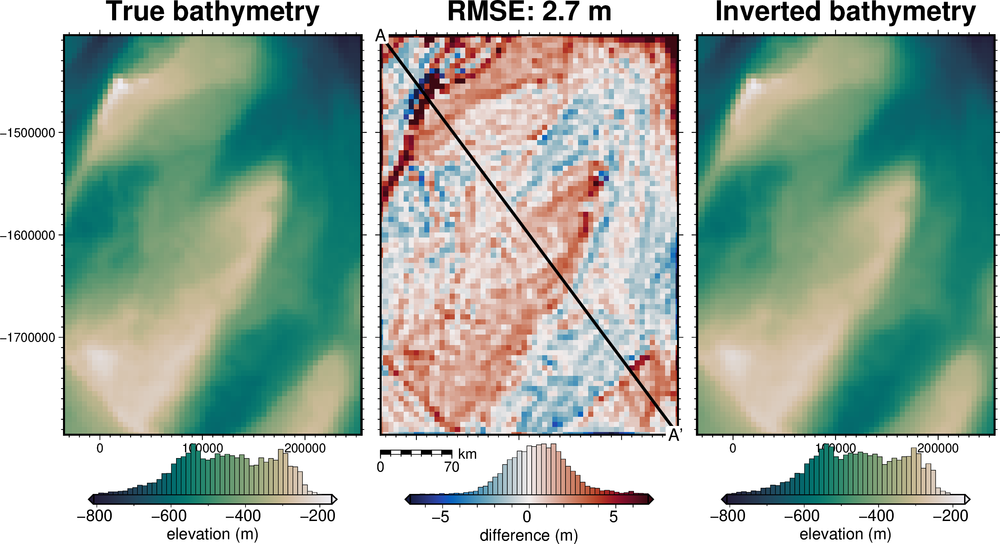

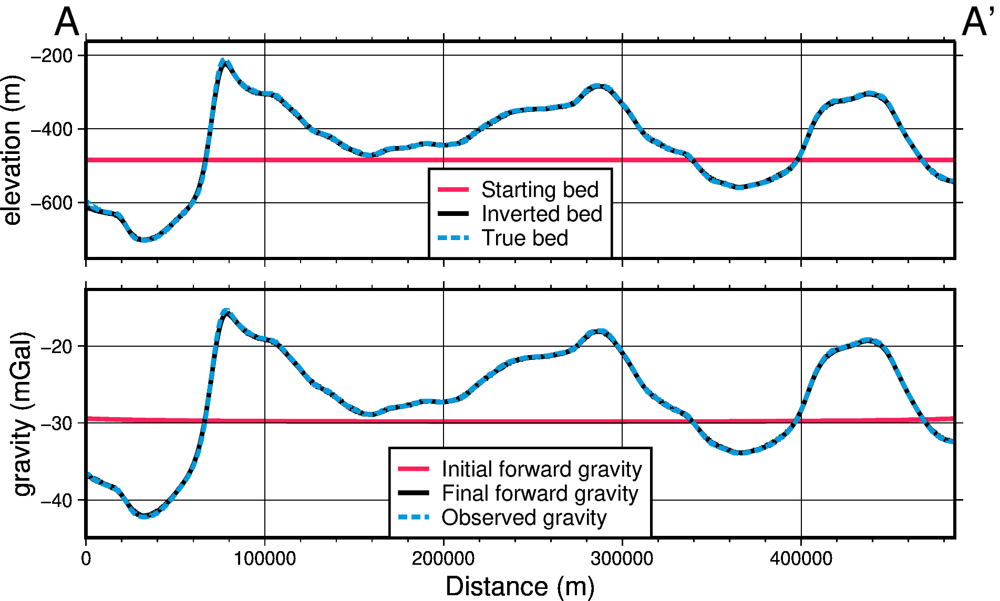

In [11]:
fig1 = inverted_bathymetry_plot(
    final_bathymetry,
)
fig2 = inverted_bathymetry_profile(
    inversion_results,
)
# fig1.savefig("../../figures/Ross_Sea_01_inversion_comparison.png")
# fig2.savefig("../../figures/Ross_Sea_01_inversion_profiles.png")

In [12]:
polar_utils.rmse(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
)

np.float64(125.72042252649922)

In [13]:
np.abs(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
).mean()

<xarray.DataArray ()> Size: 8B
array(105.10947419)

grdinfo [ERROR]: No 3rd-dimension coordinate vector found in /home/mdtanker/RIS_gravity_inversion/results/Ross_Sea_01_uncertainty.nc
grdinfo [ERROR]: gmtapi_import_cube: Unable to examine cube /home/mdtanker/RIS_gravity_inversion/results/Ross_Sea_01_uncertainty.nc.
[Session pygmt-session (183)]: Error returned from GMT API: GMT_RUNTIME_ERROR (79)
[Session pygmt-session (183)]: Error returned from GMT API: GMT_RUNTIME_ERROR (79)


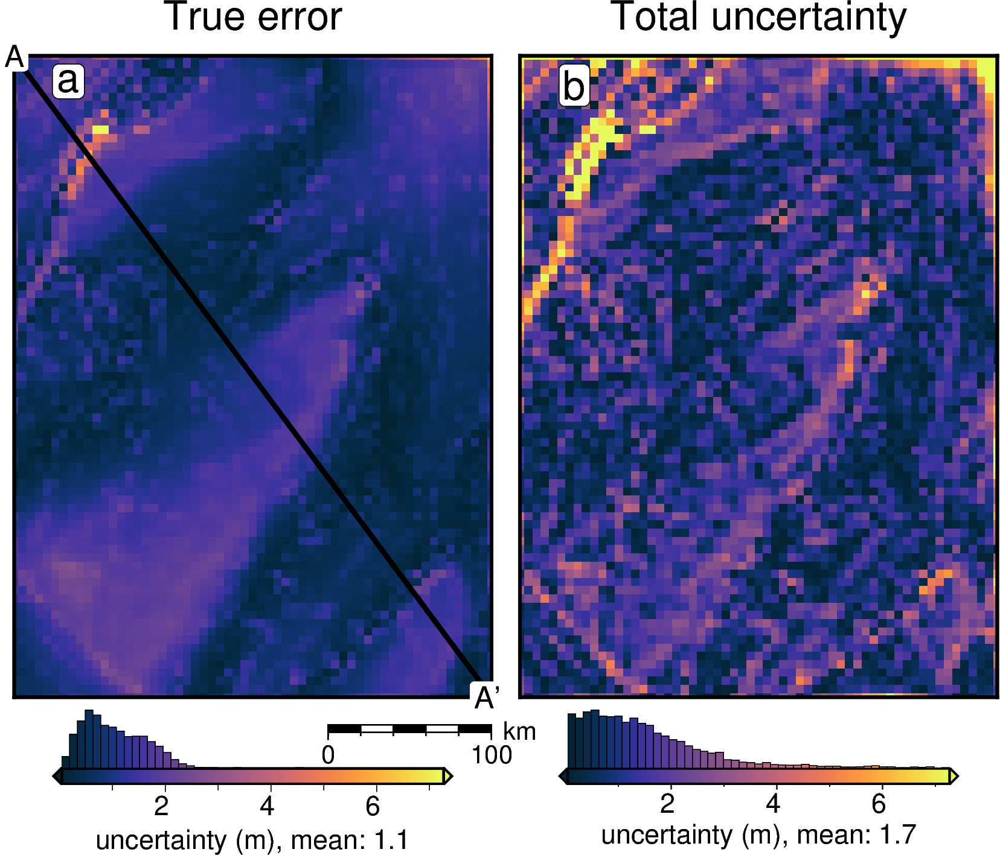

grdinfo [ERROR]: No 3rd-dimension coordinate vector found in /home/mdtanker/RIS_gravity_inversion/results/Ross_Sea_01_uncertainty.nc
grdinfo [ERROR]: gmtapi_import_cube: Unable to examine cube /home/mdtanker/RIS_gravity_inversion/results/Ross_Sea_01_uncertainty.nc.
[Session pygmt-session (272)]: Error returned from GMT API: GMT_RUNTIME_ERROR (79)
[Session pygmt-session (272)]: Error returned from GMT API: GMT_RUNTIME_ERROR (79)


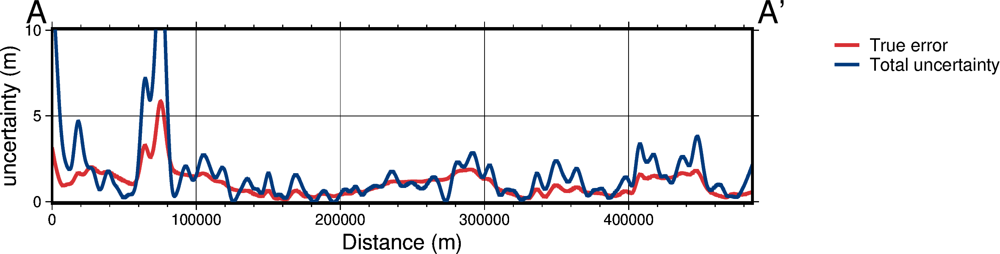

In [14]:
titles = [
    "True error",
    "Total uncertainty",
]
grids = [
    np.abs(final_bathymetry - bathymetry),
    uncertainty,
]

sensitivity_plot(
    titles,
    grids,
)

sensitivity_profile(
    titles,
    grids,
    data_ylims=[0, 10],
)

INFO:root:grid regions dont match, using inner region (-35000.0, 255000.0, -1795000.0, -1405000.0)
INFO:root:returning original grid


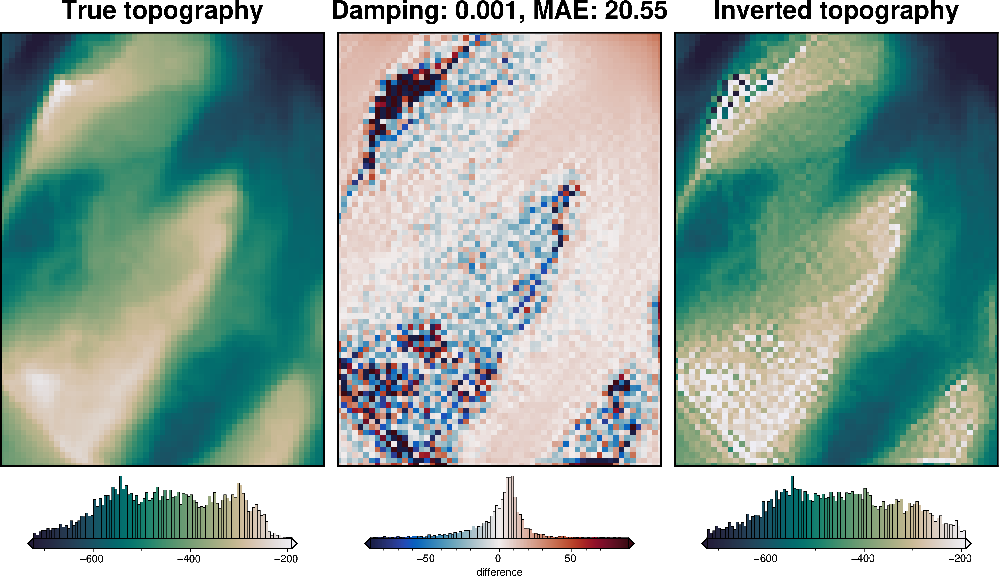

INFO:root:grid regions dont match, using inner region (-35000.0, 255000.0, -1795000.0, -1405000.0)
INFO:root:returning original grid


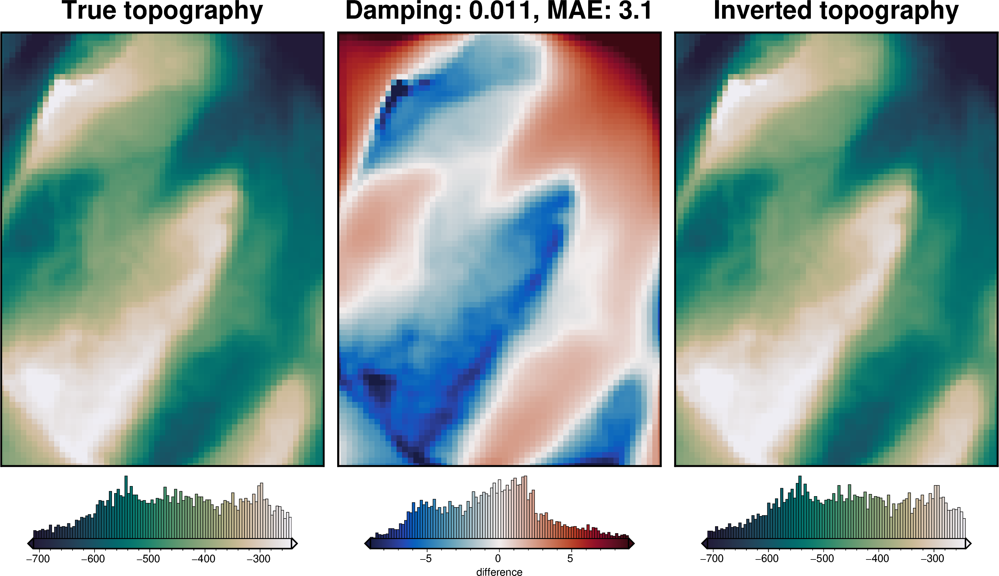

INFO:root:grid regions dont match, using inner region (-35000.0, 255000.0, -1795000.0, -1405000.0)
INFO:root:returning original grid


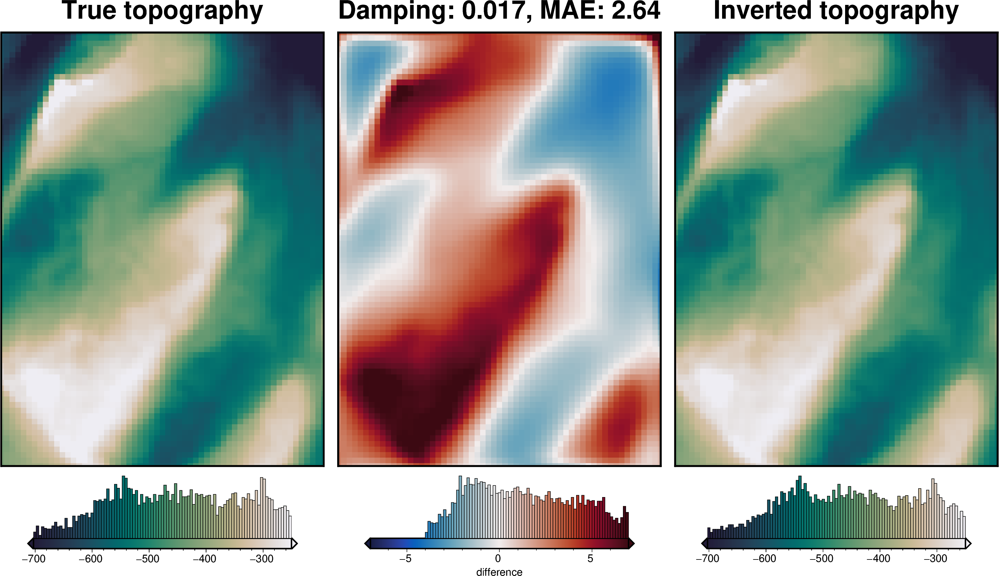

INFO:root:grid regions dont match, using inner region (-35000.0, 255000.0, -1795000.0, -1405000.0)
INFO:root:returning original grid


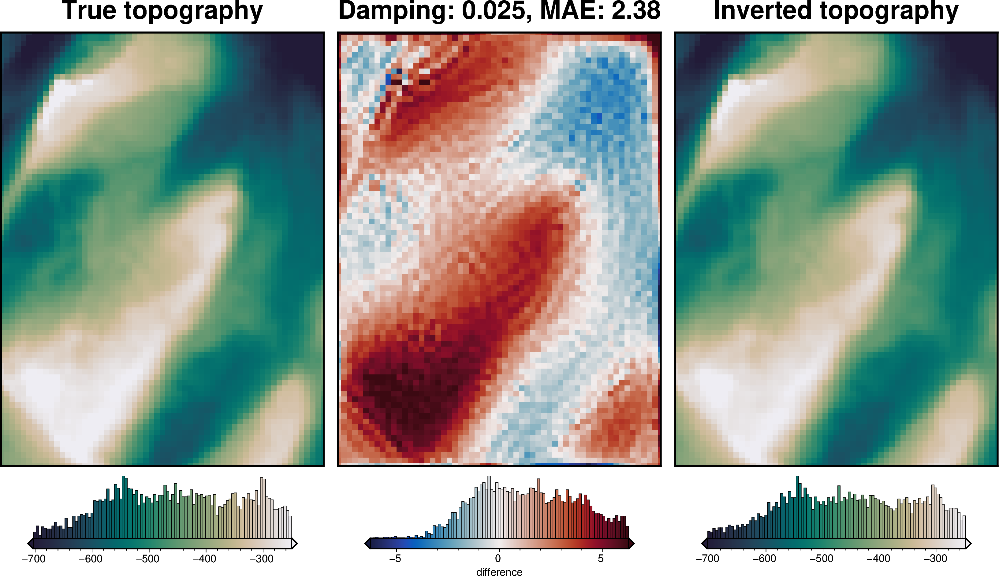

INFO:root:grid regions dont match, using inner region (-35000.0, 255000.0, -1795000.0, -1405000.0)
INFO:root:returning original grid


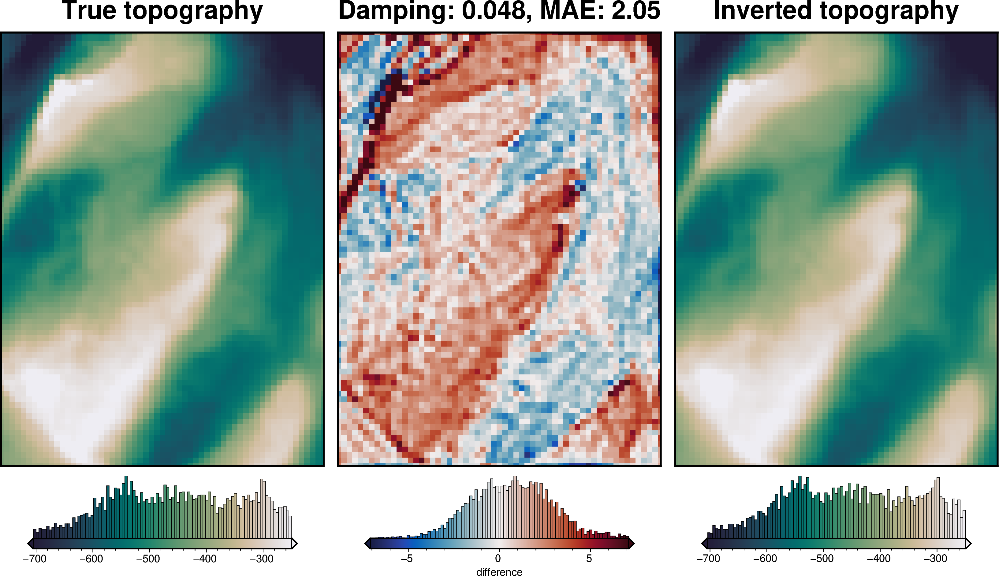

INFO:root:grid regions dont match, using inner region (-35000.0, 255000.0, -1795000.0, -1405000.0)
INFO:root:returning original grid


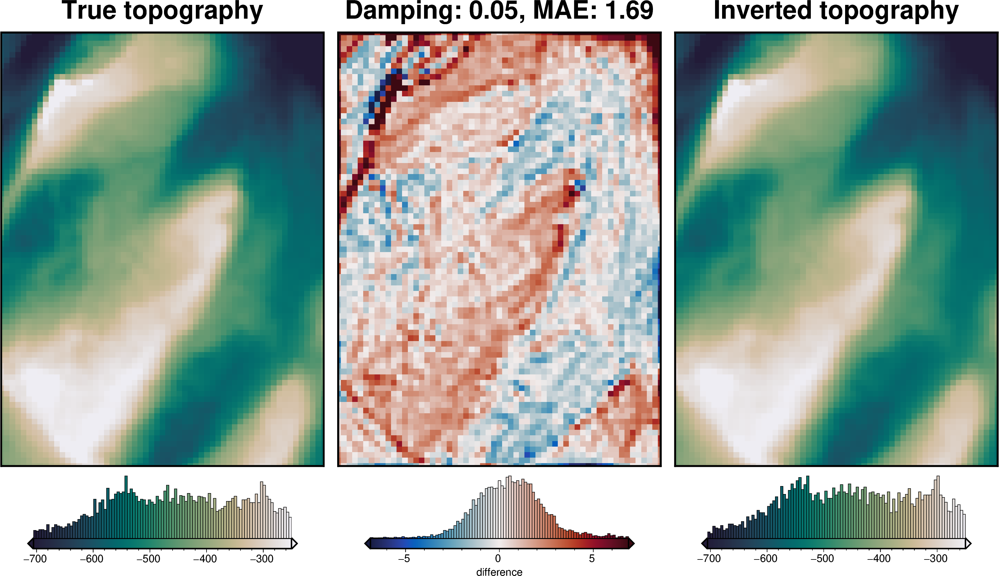

INFO:root:grid regions dont match, using inner region (-35000.0, 255000.0, -1795000.0, -1405000.0)
INFO:root:returning original grid


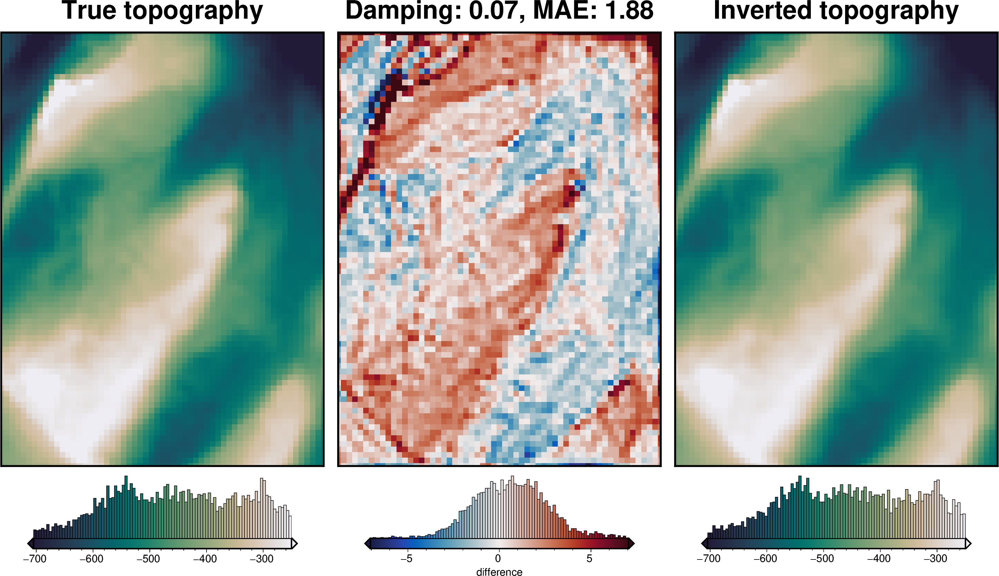

INFO:root:grid regions dont match, using inner region (-35000.0, 255000.0, -1795000.0, -1405000.0)
INFO:root:returning original grid


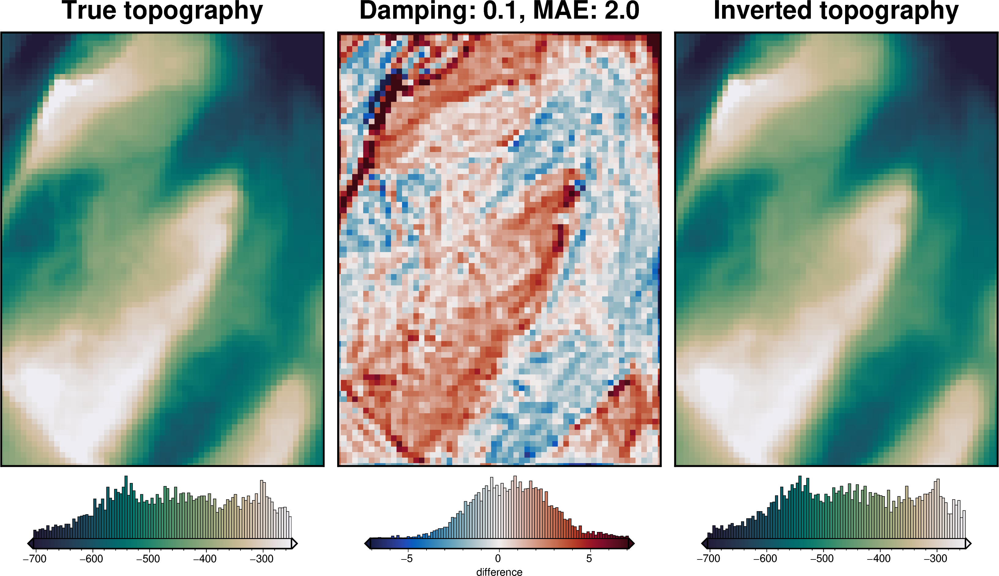

[<xarray.DataArray ()> Size: 8B
 array(20.55090975),
 <xarray.DataArray ()> Size: 8B
 array(3.09755858),
 <xarray.DataArray ()> Size: 8B
 array(2.64047187),
 <xarray.DataArray ()> Size: 8B
 array(2.38300976),
 <xarray.DataArray ()> Size: 8B
 array(2.0476834),
 <xarray.DataArray ()> Size: 8B
 array(1.68653986),
 <xarray.DataArray ()> Size: 8B
 array(1.87724844),
 <xarray.DataArray ()> Size: 8B
 array(1.99564086)]

In [23]:
dampings = [
    (t.params["damping"], t.user_attrs["results"][0])
    for t in damping_study.get_trials()
]
dampings = sorted(dampings, key=lambda x: x[0])

maes = []
for damp, df in dampings:
    final_topography = df.set_index(["northing", "easting"]).to_xarray().topo

    mae = np.mean(np.abs(bathymetry - final_topography))
    maes.append(mae)
    _ = polar_utils.grd_compare(
        bathymetry,
        final_topography,
        region=inversion_region,
        plot=True,
        grid1_name="True topography",
        grid2_name="Inverted topography",
        robust=True,
        hist=True,
        inset=False,
        verbose="q",
        title=f"Damping: {round(damp,3)}, MAE: {round(float(np.mean(np.abs(bathymetry-final_topography))),2)}",
        rmse_in_title=False,
        grounding_line=False,
        reverse_cpt=True,
        cmap="rain",
    )
maes

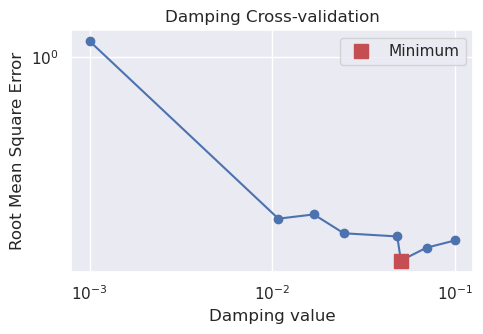

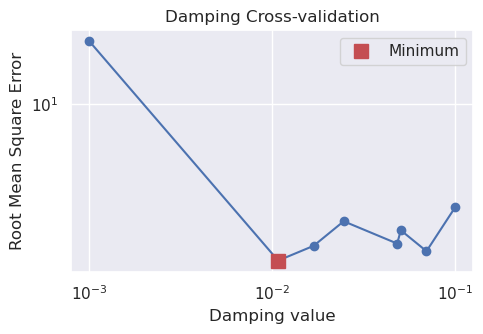

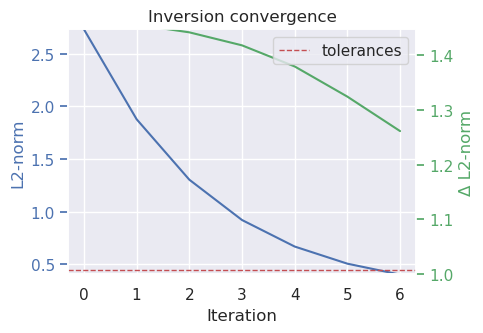

In [24]:
_ = plotting.plot_cv_scores(
    damping_study.trials_dataframe().value.values,
    damping_study.trials_dataframe().params_damping.values,
    param_name="Damping",
    logx=True,
    logy=True,
    fname="../../figures/Ross_Sea_01_damping_cv.png",
)
_ = plotting.plot_cv_scores(
    maes,
    damping_study.trials_dataframe().params_damping.values,
    param_name="Damping",
    logx=True,
    logy=True,
    # fname="../../figures/Ross_Sea_01_damping_cv.png",
)
plotting.plot_convergence(
    inversion_results[1],
    inversion_results[2],
    fname="../../figures/Ross_Sea_01_convergence.png",
)

In [16]:
# def combine_images_horizontally(
#     image_paths: list(str),
#     output_path: str,
# ):
#     # get list of images
#     imgs = [PIL.Image.open(i) for i in image_paths]

#     # pick the image which is the smallest, and resize the others to match it (can be arbitrary image shape here)
#     min_shape = sorted( [(np.sum(i.size), i.size ) for i in imgs])[0][1]

#     # stack them horizontally
#     imgs_comb = np.hstack([i.resize(min_shape) for i in imgs])

#     # save
#     imgs_comb = PIL.Image.fromarray(imgs_comb)
#     imgs_comb.save(output_path)


# def combine_images_vertically(
#     image_paths: list(str),
#     output_path: str,
# ):
#     # get list of images
#     imgs = [PIL.Image.open(i) for i in image_paths]

#     # pick the image which is the smallest, and resize the others to match it (can be arbitrary image shape here)
#     min_shape = sorted( [(np.sum(i.size), i.size ) for i in imgs])[0][1]

#     # stack them vertically
#     imgs_comb = np.vstack([i.resize(min_shape) for i in imgs])

#     # save
#     imgs_comb = PIL.Image.fromarray(imgs_comb)
#     imgs_comb.save(output_path)

In [17]:
# combine_images_vertically(
#     [
#         "../../figures/Ross_Sea_01_damping_cv.png",
#         "../../figures/Ross_Sea_01_convergence.png",
#     ],
#     '../../figures/tmp1.png',
# )

In [18]:
# import cv2 as cv
# from matplotlib import pyplot as plt
# image1 = cv.imread('../../figures/tmp1.png')
# image2 = cv.imread('anotherimage')
# final_frame = cv.hconcat((image1, image2)) # or vconcat for vertical concatenation
# cv.imwrite("image.png", final_frame)

In [19]:
# from matplotlib import pyplot as plt
# image1 = PIL.Image.open("../../figures/Ross_Sea_01_damping_cv.png")
# image2 = PIL.Image.open('../../figures/Ross_Sea_01_inversion_profiles.png')

# fig = plt.figure()
# ax1 =fig.add_subplot(211)
# ax2 = fig.add_subplot(212)
# ax1.imshow(image1, 'gray')
# ax2.imshow(image2, 'gray')
# ax1.axis('off')
# ax2.axis('off')

# plt.subplots_adjust(wspace=0, hspace=0)
# plt.tight_layout()
# # plt.savefig('../../figures/tmp1.png') # To save figure
# plt.show()

In [20]:
# from matplotlib import pyplot as plt
# image1 = PIL.Image.open('../../figures/Ross_Sea_01_inversion_profiles.png')
# image2 = PIL.Image.open('../../figures/tmp1.png')

# fig = plt.figure()
# ax1 =fig.add_subplot(121)
# ax2 = fig.add_subplot(122)
# ax1.imshow(image1, 'gray')
# ax2.imshow(image2, 'gray')
# ax1.axis('off')
# ax2.axis('off')

# plt.subplots_adjust(wspace=0, hspace=0)
# plt.tight_layout()
# plt.savefig('../../figures/tmp2.png') # To save figure
# plt.show()

In [21]:
# combine_images_vertically(
#     [
#         '../../figures/Ross_Sea_01_inversion_profiles.png',
#         "../../figures/Ross_Sea_01_convergence.png",
#     ],
#     '../../figures/tmp1.png',
# )

In [22]:
# import numpy as np
# from PIL import Image, ImageFont, ImageDraw
# import os

# def change_height_proportionally(img, width):
#     """Change height of image proportional to given width."""
#     wpercent = width / img.size[0]
#     proportional_height = int(img.size[1] * wpercent)
#     return img.resize((width, proportional_height), Image.LANCZOS)

# def change_width_proportionally(img, height):
#     """Change width of image proportional to given height."""
#     hpercent = height / img.size[1]
#     proportional_width = int(img.size[0] * hpercent)
#     return img.resize((proportional_width, height), Image.LANCZOS)

# def make_same_width(image_list):
#     """Make all images in input list the same width."""
#     imgs = [Image.open(i) for i in image_list]
#     min_width = min([i.size[0] for i in imgs])
#     resized = [change_height_proportionally(img, min_width) for img in imgs]
#     return [np.asarray(i) for i in resized]

# def make_same_height(image_list):
#     """Make all images in input list the same height."""
#     imgs = [Image.open(i) for i in image_list]
#     min_height = min([i.size[1] for i in imgs])
#     resized = [change_width_proportionally(img, min_height) for img in imgs]
#     return [np.asarray(i) for i in resized]

# def add_text(img):
#     """Add text annotation to hardcoded locations."""
#     font = ImageFont.truetype(
#         "/usr/share/fonts/truetype/freefont/FreeMonoBold.ttf",
#         size=24,
#         encoding="unic")
#     draw = ImageDraw.Draw(img)
#     draw.text((30, 30), "A", (0, 0, 0), font=font)
#     draw.text((30, 490), "B", (0, 0, 0), font=font)
#     draw.text((30, 950), "C", (0, 0, 0), font=font)
#     draw.text((30, 1430), "D", (0, 0, 0), font=font)
#     draw.text((510, 30), "E", (0, 0, 0), font=font)
#     draw.text((510, 950), "F", (0, 0, 0), font=font)

# # combine convergence and cv plots
# Image.fromarray(np.vstack(make_same_width(
#     [
#         "../../figures/Ross_Sea_01_damping_cv.png",
#         "../../figures/Ross_Sea_01_convergence.png",
# ]   ,
# ))).save('../../figures/tmp.png')

# # combined above plot with profiles
# Image.fromarray(np.hstack(make_same_height(
#     [
#         '../../figures/Ross_Sea_01_inversion_profiles.png',
#         '../../figures/tmp.png',
#     ],
# )))#.save('../../figures/tmp2.png')

# # combined = Image.fromarray(np.hstack(make_same_height(["left.png", "right.png"])))

# # add_text(combined)
# # combined.save('Combined_images.png', dpi=combined.size)
# # [os.remove(f) for f in ["left.png", "right.png"]]

# 2: with density CV

In [77]:
i = 2
final_bathymetry = final_bathymetries[i - 2]
inversion_results = best_results[i - 2]

damping_study = damping_studies[i - 2]
density_study = density_studies[i - 2]

constraint_points = pd.read_csv(f"../../results/Ross_Sea_0{i}_constraint_points.csv")

uncertainty = final_uncertainties[i - 2]
stochastic_mean = final_stochastic_means[i - 2]

uncertainty_ds = uncertainty_results[i - 2]
sensitivity_ds = sensitivity_results[i - 2]

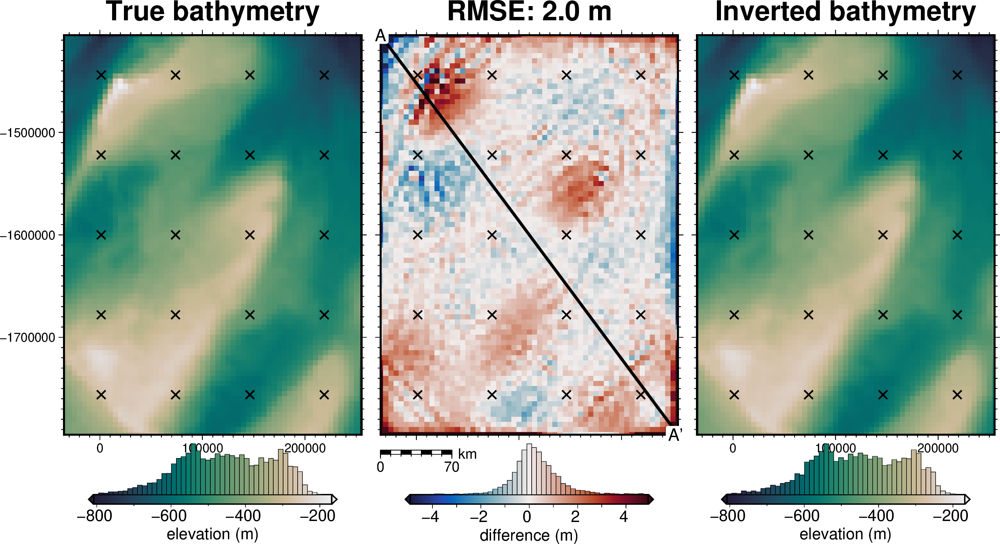

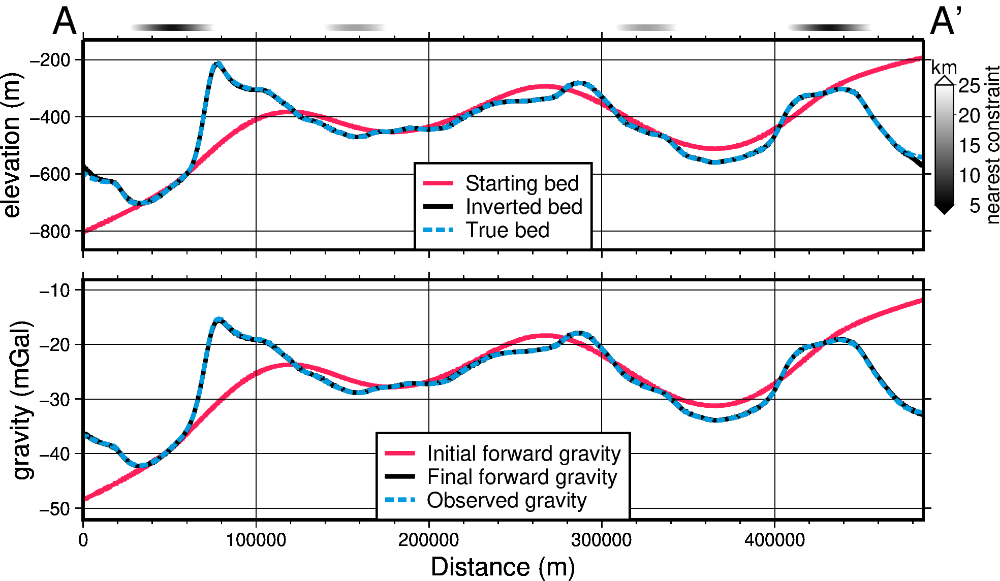

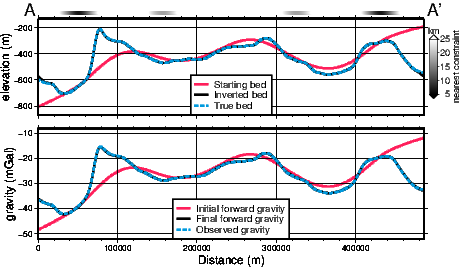

In [26]:
inverted_bathymetry_plot(
    final_bathymetry,
    constraint_points,
)
inverted_bathymetry_profile(
    inversion_results,
    constraint_points,
)

In [212]:
polar_utils.rmse(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
)

np.float64(59.30638258342832)

In [213]:
np.abs(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
).mean()

<xarray.DataArray ()> Size: 8B
array(39.28618766)

In [214]:
sensitivity_ds

<xarray.Dataset> Size: 113kB
Dimensions:        (northing: 79, easting: 59)
Coordinates:
  * northing       (northing) float64 632B -1.795e+06 -1.79e+06 ... -1.405e+06
  * easting        (easting) float64 472B -3.5e+04 -3e+04 ... 2.5e+05 2.55e+05
Data variables:
    full_stdev     (northing, easting) float64 37kB 3.619 3.165 ... 1.531 1.615
    density_stdev  (northing, easting) float64 37kB 0.862 0.8006 ... 1.443 1.537
    damping_stdev  (northing, easting) float64 37kB 3.397 2.744 ... 0.9763 1.069

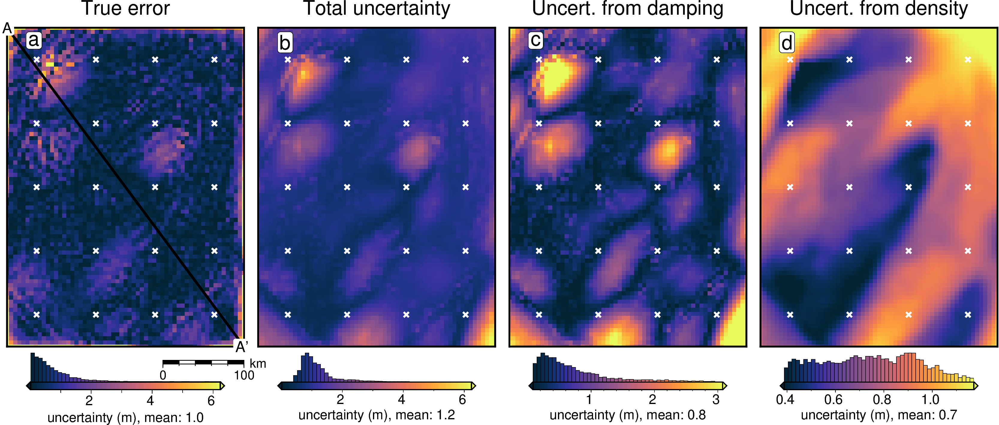

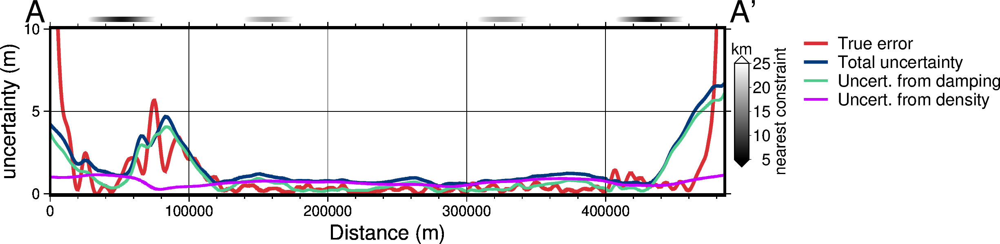

In [78]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
]
# grids = list(sensitivity_ds.data_vars.values())
# grids.insert(0, np.abs(final_bathymetry - bathymetry))

grids = [
    np.abs(final_bathymetry - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
]
sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=4,
    fname="../../paper/figures/Ross_Sea_02_sensitivity.png",
)

sensitivity_profile(
    titles,
    grids,
    constraint_points=constraint_points,
    data_ylims=[0, 10],
    # data_legend_loc="jTC",
    fname="../../paper/figures/Ross_Sea_02_sensitivity_profiles.png",
)

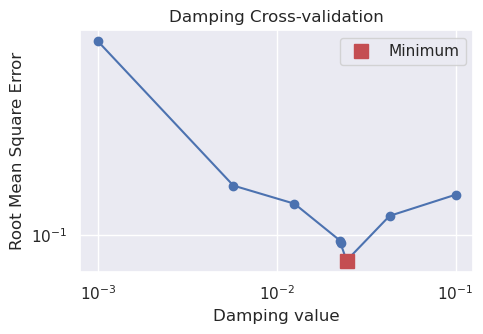

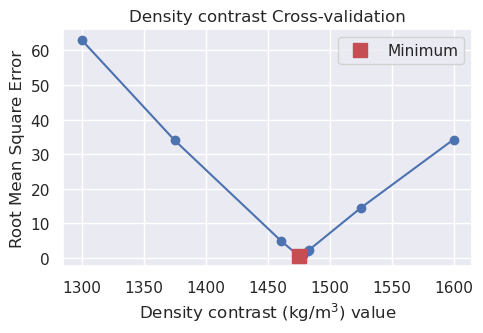

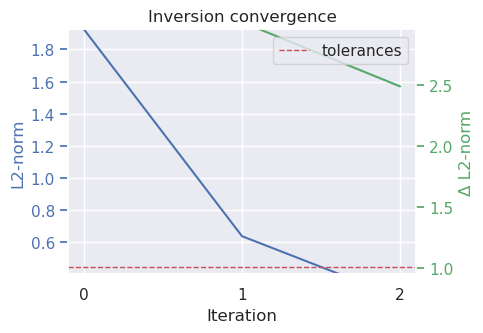

In [28]:
damp_fig = plotting.plot_cv_scores(
    damping_study.trials_dataframe().value.values,
    damping_study.trials_dataframe().params_damping.values,
    param_name="Damping",
    logx=True,
    logy=True,
)
dens_fig = plotting.plot_cv_scores(
    density_study.trials_dataframe().value.values,
    density_study.trials_dataframe().params_density_contrast.values,
    param_name="Density contrast (kg/m$^3$)",
    plot_title="Density contrast Cross-validation",
)
plotting.plot_convergence(
    inversion_results[1],
    inversion_results[2],
)

# 3: with constraint uncertainty

In [79]:
i = 3
final_bathymetry = final_bathymetries[i - 2]
inversion_results = best_results[i - 2]

damping_study = damping_studies[i - 2]
density_study = density_studies[i - 2]

constraint_points = pd.read_csv(f"../../results/Ross_Sea_0{i}_constraint_points.csv")

uncertainty = final_uncertainties[i - 2]
stochastic_mean = final_stochastic_means[i - 2]

uncertainty_ds = uncertainty_results[i - 2]
sensitivity_ds = sensitivity_results[i - 2]

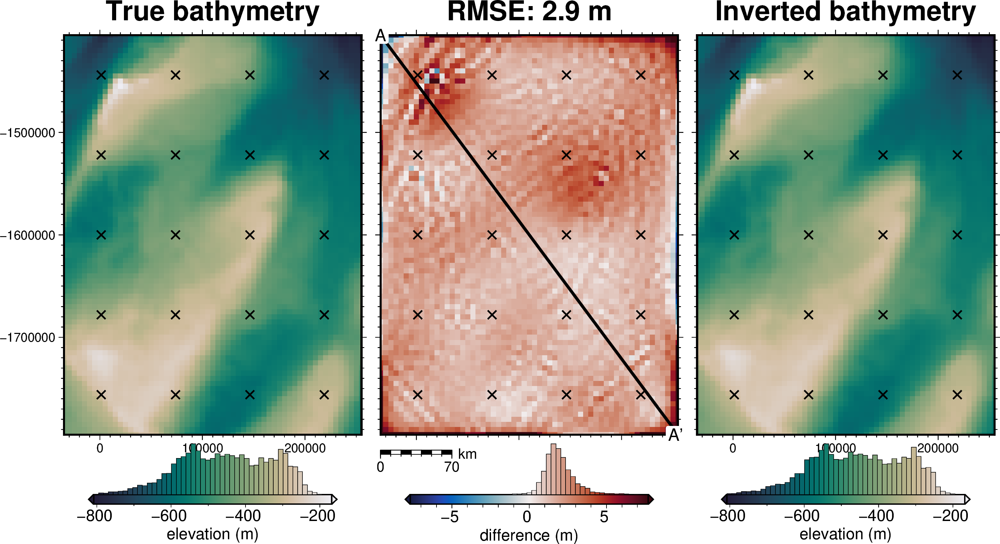

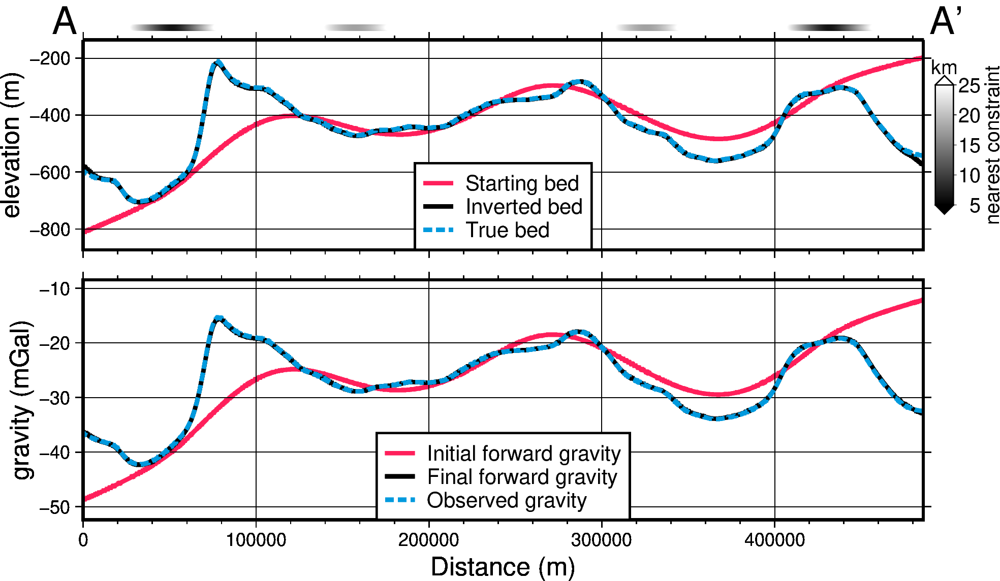

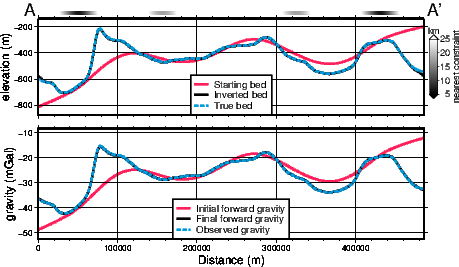

In [284]:
inverted_bathymetry_plot(
    final_bathymetry,
    constraint_points,
)
inverted_bathymetry_profile(
    inversion_results,
    constraint_points,
)

In [285]:
constraint_points.describe()

,northing,easting,true_upward,upward,true_uncert,weight,starting_bathymetry,inverted_topography
count,2.000000e+01,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000
mean,-1.600000e+06,110000.000000,-444.901673,-448.033565,22.245084,0.002607,-448.033708,-446.841048
std,1.131743e+05,83163.203528,132.448643,131.026044,6.622432,0.001500,130.898905,132.958267
min,-1.756000e+06,1250.000000,-692.387842,-656.296662,13.855870,0.000834,-656.229904,-695.198080
25%,-1.678000e+06,55625.000000,-555.166683,-568.582960,15.304526,0.001299,-568.390206,-558.004511
50%,-1.600000e+06,110000.000000,-434.775009,-423.035111,21.738750,0.002119,-423.060945,-436.013563
75%,-1.522000e+06,164375.000000,-306.090511,-309.031418,27.758334,0.004269,-309.238787,-307.645939
max,-1.444000e+06,218750.000000,-277.117397,-275.375295,34.619392,0.005209,-275.357134,-278.921286


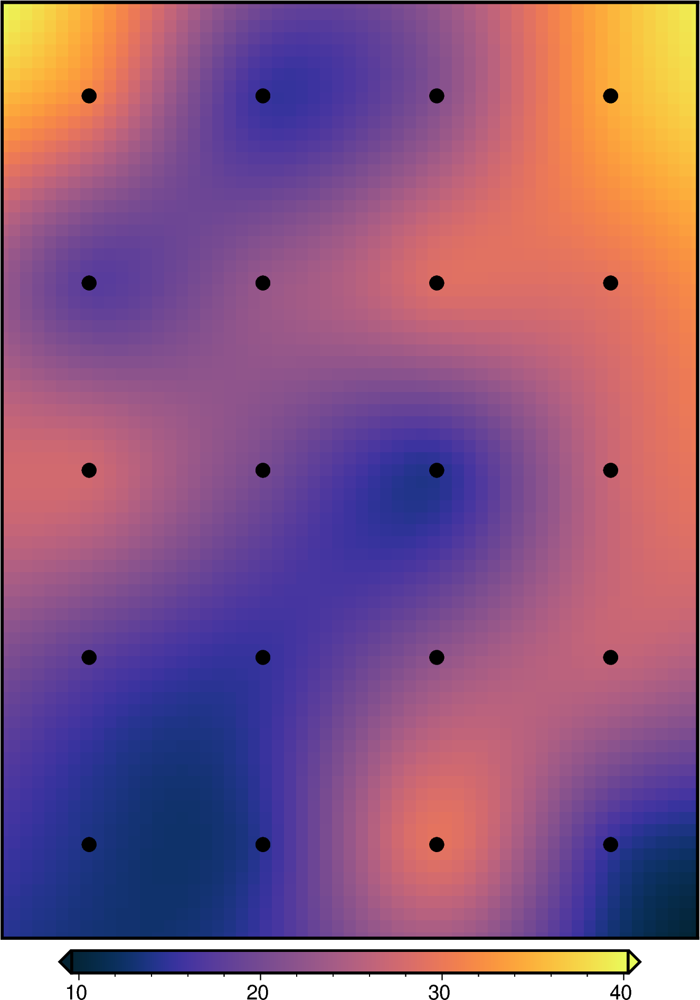

In [265]:
spline = invert4geom.utils.best_spline_cv(
    coordinates=(constraint_points.easting, constraint_points.northing),
    data=constraint_points.true_uncert,
)

constraints_error = spline.grid(
    region=plot_region,
    spacing=spacing,
).scalars
fig = maps.plot_grd(
    constraints_error,
    points=constraint_points,
    cmap="thermal",
)
fig.show()

In [255]:
polar_utils.rmse(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
)

np.float64(62.73421912268751)

In [256]:
np.abs(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
).mean()

<xarray.DataArray ()> Size: 8B
array(43.5153463)

In [190]:
sensitivity_ds

<xarray.Dataset> Size: 150kB
Dimensions:            (northing: 79, easting: 59)
Coordinates:
  * northing           (northing) float64 632B -1.795e+06 ... -1.405e+06
  * easting            (easting) float64 472B -3.5e+04 -3e+04 ... 2.55e+05
Data variables:
    full_stdev         (northing, easting) float64 37kB 5.724 3.716 ... 7.783
    constraints_stdev  (northing, easting) float64 37kB 2.913 1.686 ... 5.74
    density_stdev      (northing, easting) float64 37kB 1.663 1.545 ... 3.02
    damping_stdev      (northing, easting) float64 37kB 3.613 2.927 ... 2.706

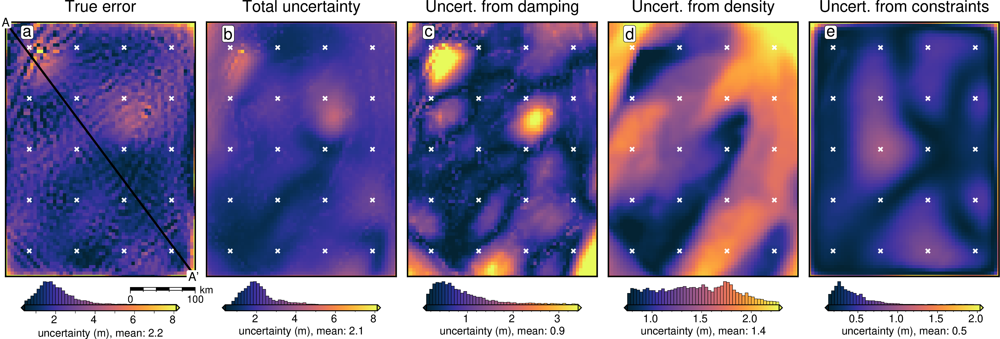

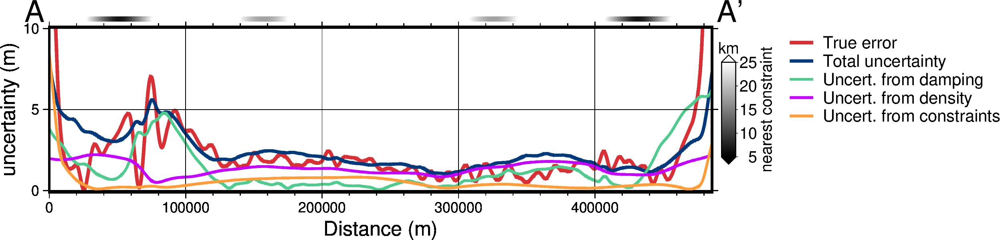

In [80]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
    "Uncert. from constraints",
]
# grids = list(sensitivity_ds.data_vars.values())
# grids.insert(0, np.abs(final_bathymetry - bathymetry))

grids = [
    np.abs(final_bathymetry - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
    sensitivity_ds.constraints_stdev,
]

sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=5,
    fname="../../paper/figures/Ross_Sea_03_sensitivity.png",
)
sensitivity_profile(
    titles,
    grids,
    constraint_points=constraint_points,
    data_ylims=[0, 10],
    # data_legend_loc="jTC",
    fname="../../paper/figures/Ross_Sea_03_sensitivity_profiles.png",
)

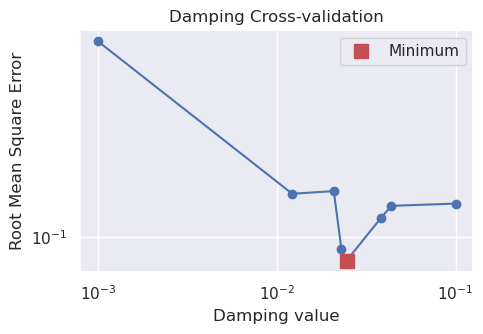

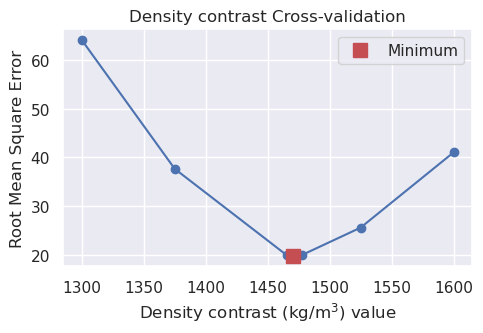

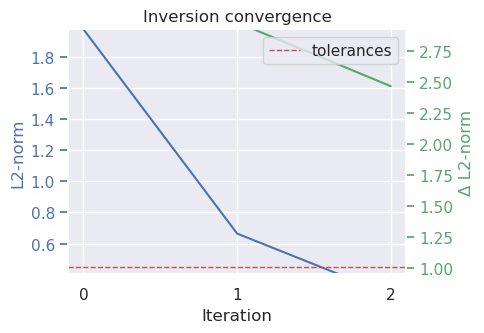

In [32]:
damp_fig = plotting.plot_cv_scores(
    damping_study.trials_dataframe().value.values,
    damping_study.trials_dataframe().params_damping.values,
    param_name="Damping",
    logx=True,
    logy=True,
)
dens_fig = plotting.plot_cv_scores(
    density_study.trials_dataframe().value.values,
    density_study.trials_dataframe().params_density_contrast.values,
    param_name="Density contrast (kg/m$^3$)",
    plot_title="Density contrast Cross-validation",
)
plotting.plot_convergence(
    inversion_results[1],
    inversion_results[2],
)

# 4: with noise

In [81]:
i = 4
final_bathymetry = final_bathymetries[i - 2]
inversion_results = best_results[i - 2]

damping_study = damping_studies[i - 2]
density_study = density_studies[i - 2]

constraint_points = pd.read_csv(f"../../results/Ross_Sea_0{i}_constraint_points.csv")

uncertainty = final_uncertainties[i - 2]
stochastic_mean = final_stochastic_means[i - 2]

uncertainty_ds = uncertainty_results[i - 2]
sensitivity_ds = sensitivity_results[i - 2]

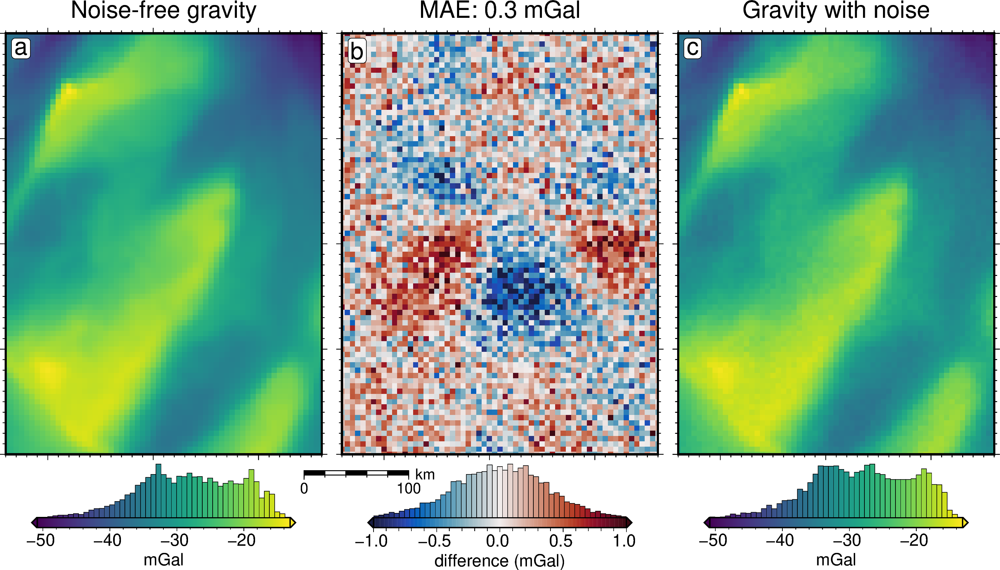

In [128]:
grav_df = inversion_results[1]

grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

lims = polar_utils.get_min_max(grav_grid.noise_free_disturbance)

# plot the noise-free gravity
fig = maps.plot_grd(
    grav_grid.noise_free_disturbance,
    fig_height=10,
    cpt_lims=lims,
    title="Noise-free gravity",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

dif = grav_grid.noise_free_disturbance - grav_grid.disturbance
# dif_lims = polar_utils.get_min_max(dif, robust=False)
dif_lims = [1]
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=(-vd.maxabs(dif_lims), vd.maxabs(dif_lims)),
    # title=f"RMSE: {round(utils.rmse(dif),1)} mGal",
    title=f"MAE: {round(np.nanmean(np.abs(dif)),1)} mGal",
    title_font="16p,Helvetica,black",
    cbar_label="difference (mGal)",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    scalebar=True,
    scale_position="jBL+o-.9c/-.6c",
    scale_length=100,
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the noisey gravity
fig = maps.plot_grd(
    grav_grid.disturbance,
    fig_height=10,
    cpt_lims=lims,
    title="Gravity with noise",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
fig.savefig("../../paper/figures/Ross_Sea_04_grav_error.png")
fig.show()

In [339]:
grav_error = np.abs(grav_df.noise_free_disturbance - grav_df.disturbance)
grav_error.describe()

count    4941.000000
mean        0.296564
std         0.226901
min         0.000166
25%         0.119583
50%         0.246374
75%         0.417640
max         1.423235
dtype: float64

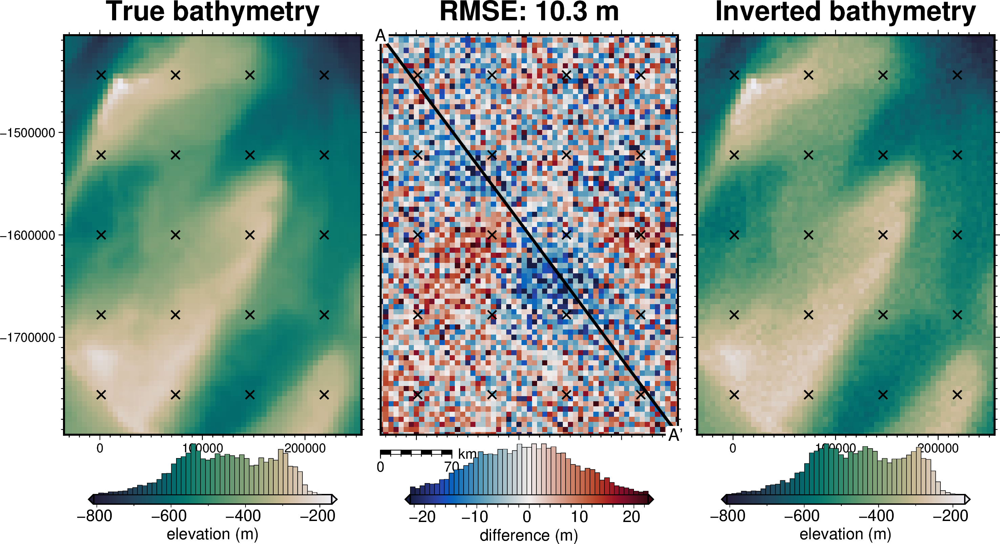

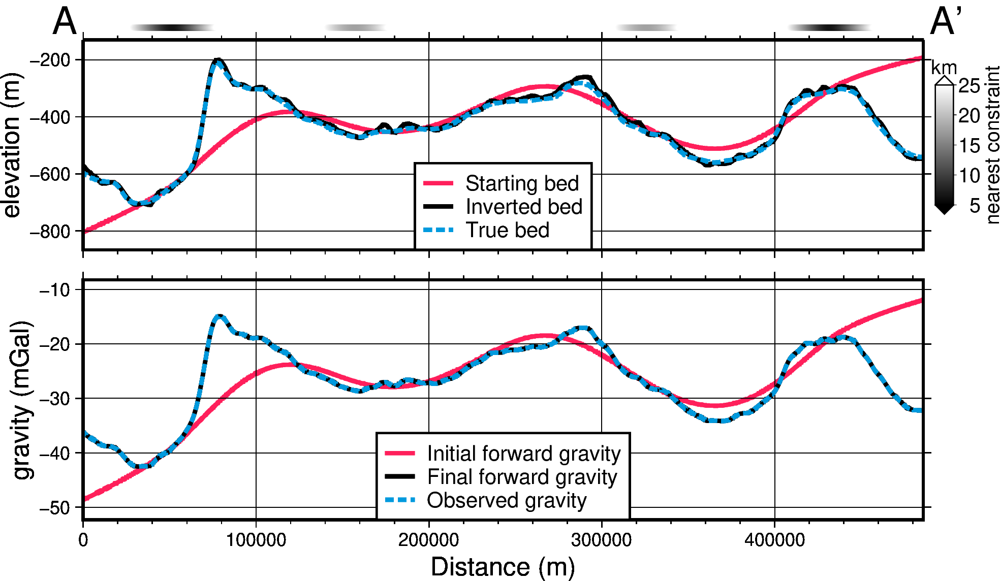

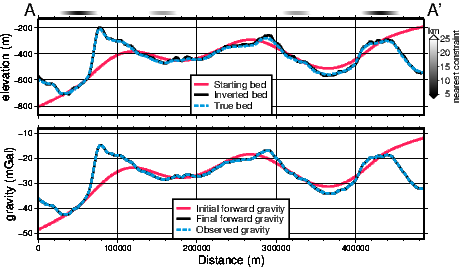

In [268]:
inverted_bathymetry_plot(
    final_bathymetry,
    constraint_points,
)
inverted_bathymetry_profile(
    inversion_results,
    constraint_points,
)

In [269]:
polar_utils.rmse(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
)

np.float64(59.30638258342832)

In [270]:
np.abs(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
).mean()

<xarray.DataArray ()> Size: 8B
array(39.28618766)

In [271]:
sensitivity_ds

<xarray.Dataset> Size: 150kB
Dimensions:        (northing: 79, easting: 59)
Coordinates:
  * northing       (northing) float64 632B -1.795e+06 -1.79e+06 ... -1.405e+06
  * easting        (easting) float64 472B -3.5e+04 -3e+04 ... 2.5e+05 2.55e+05
Data variables:
    full_stdev     (northing, easting) float64 37kB 6.716 17.2 ... 19.6 12.98
    gravity_stdev  (northing, easting) float64 37kB 6.573 8.087 ... 20.15 11.92
    density_stdev  (northing, easting) float64 37kB 1.352 1.378 ... 2.521 2.676
    damping_stdev  (northing, easting) float64 37kB 0.3162 0.08041 ... 0.02136

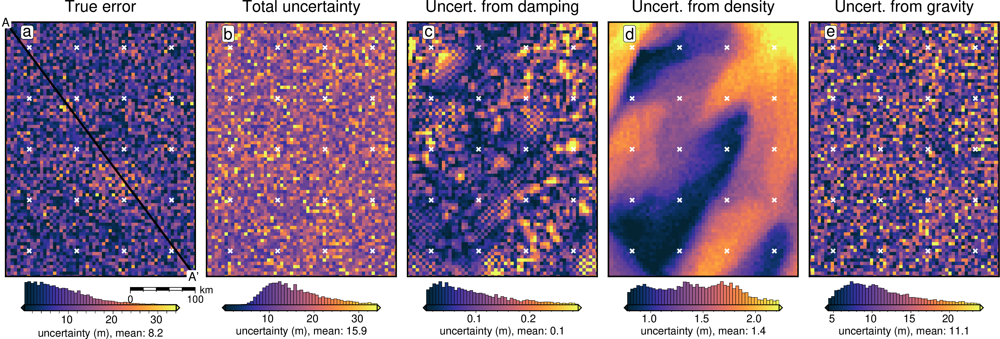

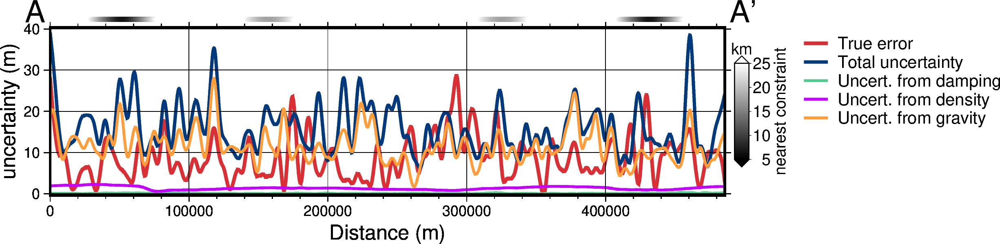

In [83]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
    "Uncert. from gravity",
]
# grids = list(sensitivity_ds.data_vars.values())
# grids.insert(0, np.abs(final_bathymetry - bathymetry))

grids = [
    np.abs(final_bathymetry - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
    sensitivity_ds.gravity_stdev,
]
sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=5,
    fname="../../paper/figures/Ross_Sea_04_sensitivity.png",
)
sensitivity_profile(
    titles,
    grids,
    constraint_points=constraint_points,
    data_ylims=[0, 40],
    # data_legend_loc="jTC",
    fname="../../paper/figures/Ross_Sea_04_sensitivity_profiles.png",
)

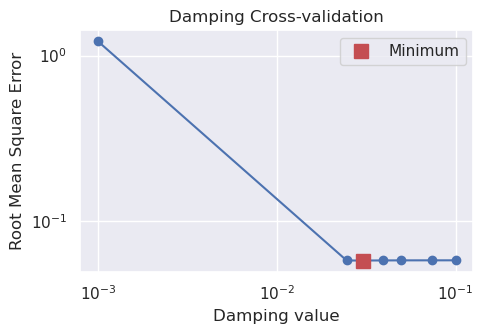

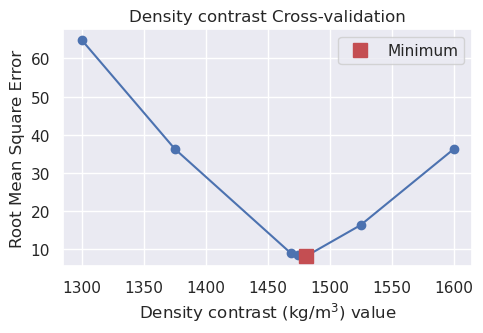

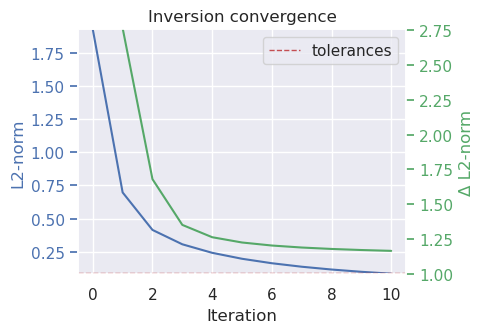

In [37]:
damp_fig = plotting.plot_cv_scores(
    damping_study.trials_dataframe().value.values,
    damping_study.trials_dataframe().params_damping.values,
    param_name="Damping",
    logx=True,
    logy=True,
)
dens_fig = plotting.plot_cv_scores(
    density_study.trials_dataframe().value.values,
    density_study.trials_dataframe().params_density_contrast.values,
    param_name="Density contrast (kg/m$^3$)",
    plot_title="Density contrast Cross-validation",
)
plotting.plot_convergence(
    inversion_results[1],
    inversion_results[2],
)

# 5: with airborne survey

In [36]:
i = 5
final_bathymetry = final_bathymetries[i - 2]
inversion_results = best_results[i - 2]

damping_study = damping_studies[i - 2]
density_study = density_studies[i - 2]

constraint_points = pd.read_csv(f"../../results/Ross_Sea_0{i}_constraint_points.csv")

uncertainty = final_uncertainties[i - 2]
stochastic_mean = final_stochastic_means[i - 2]

# grav_df = inversion_results[1]

grav_df = pd.read_csv("../../results/Ross_Sea_05_grav_df.csv")

uncertainty_ds = uncertainty_results[i - 2]
sensitivity_ds = sensitivity_results[i - 2]

In [37]:
grav_survey_df = RIS_synth.airborne_survey(
    along_line_spacing=1e3,
    grav_observation_height=1e3,
    NS_line_spacing=70e3,
    EW_line_spacing=20e3,
    region=inversion_region,
    grav_grid=grav_df.set_index(["northing", "easting"]).disturbance.to_xarray(),
    plot=False,
)

In [142]:
grav_df.describe()

,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly_full_res,eqs_gravity_anomaly,starting_gravity,misfit,reg,res,predicted_grav,uncert,gravity_anomaly
count,4.941000e+03,4941.00000,4941.0,4941.000000,4941.0,4941.000000,4941.000000,4941.000000,4941.000000,4941.000000,4941.0,4941.000000,4941.000000,4941.000000,4941.000000
mean,-1.600000e+06,110000.00000,1000.0,-28.076339,0.0,-28.076339,-28.076339,-28.066174,-27.853297,-0.212877,0.0,-0.212877,-28.061728,0.141713,-28.064577
std,1.169164e+05,88042.99419,0.0,7.267542,0.0,7.267542,7.267542,7.268002,7.386221,3.710454,0.0,3.710454,7.260003,0.180458,7.258188
min,-1.800000e+06,-40000.00000,1000.0,-50.834525,0.0,-50.834525,-50.834525,-52.217202,-49.906290,-21.299409,0.0,-21.299409,-51.541460,0.002184,-51.556488
25%,-1.700000e+06,35000.00000,1000.0,-33.380910,0.0,-33.380910,-33.380910,-33.438101,-32.771144,-1.574645,0.0,-1.574645,-33.427309,0.050451,-33.445274
50%,-1.600000e+06,110000.00000,1000.0,-28.037682,0.0,-28.037682,-28.037682,-27.988359,-27.538171,-0.069739,0.0,-0.069739,-27.998355,0.093213,-28.010286
75%,-1.500000e+06,185000.00000,1000.0,-21.983838,0.0,-21.983838,-21.983838,-22.015461,-22.143178,1.325516,0.0,1.325516,-22.007099,0.163286,-22.023458
max,-1.400000e+06,260000.00000,1000.0,-13.088736,0.0,-13.088736,-13.088736,-14.068747,-11.285842,16.769840,0.0,16.769840,-14.102644,2.248335,-14.124326


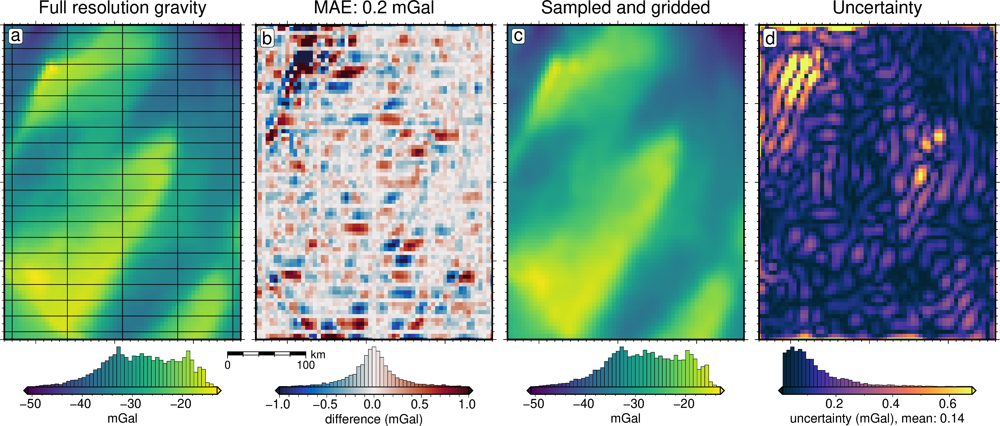

In [143]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

lims = polar_utils.get_min_max(grav_grid.gravity_anomaly_full_res)

# plot the noise-free gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly_full_res,
    fig_height=10,
    cpt_lims=lims,
    title="Full resolution gravity",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
)
# plot observation points
fig.plot(
    grav_survey_df[["easting", "northing"]],
    style="c.02c",
    fill="black",
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
dif = grav_grid.gravity_anomaly_full_res - grav_grid.gravity_anomaly
# dif_lims = polar_utils.get_min_max(dif, robust=False)
dif_lims = [1]
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=(-vd.maxabs(dif_lims), vd.maxabs(dif_lims)),
    # title=f"RMSE: {round(utils.rmse(dif),1)} mGal",
    title=f"MAE: {round(np.nanmean(np.abs(dif)),1)} mGal",
    title_font="16p,Helvetica,black",
    cbar_label="difference (mGal)",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    scalebar=True,
    scale_position="jBL+o-.9c/-.6c",
    scale_length=100,
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# plot the noisey gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    fig_height=10,
    cpt_lims=lims,
    title="Sampled and gridded",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# plot the eq source uncertainty
fig = maps.plot_grd(
    grav_grid.uncert,
    fig_height=10,
    # cpt_lims=lims,
    cmap="thermal",
    robust=True,
    title="Uncertainty",
    title_font="16p,Helvetica,black",
    # cbar_label=f"mGal, mean: {}",
    cbar_label=f"uncertainty (mGal), mean: {round(np.nanmean(grav_grid.uncert),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
)
fig.text(
    position="TL",
    text="d",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
fig.savefig("../../paper/figures/Ross_Sea_05_grav_error.png")
fig.show()

In [133]:
grav_error = np.abs(grav_df.gravity_anomaly_full_res - grav_df.gravity_anomaly)
grav_error.describe()

count    4941.000000
mean        0.219955
std         0.304148
min         0.000002
25%         0.053292
50%         0.128109
75%         0.276013
max         5.742813
dtype: float64

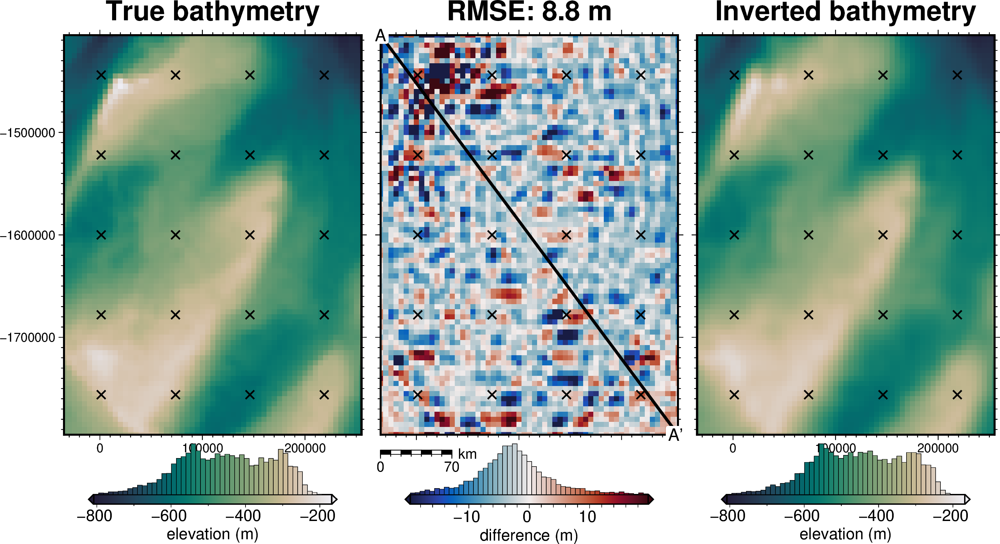

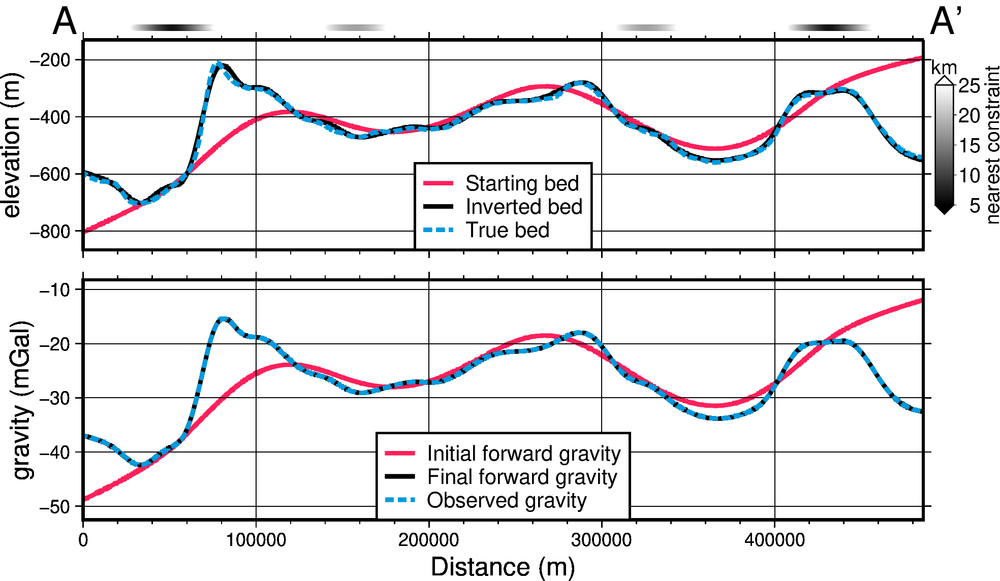

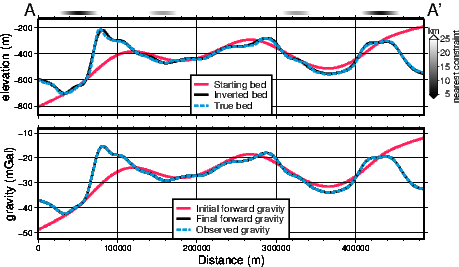

In [298]:
inverted_bathymetry_plot(
    final_bathymetry,
    constraint_points,
)
inverted_bathymetry_profile(
    inversion_results,
    constraint_points,
)

In [299]:
polar_utils.rmse(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
)

np.float64(59.30638258342832)

In [300]:
np.abs(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
).mean()

<xarray.DataArray ()> Size: 8B
array(39.28618766)

In [301]:
sensitivity_ds

<xarray.Dataset> Size: 150kB
Dimensions:                           (northing: 79, easting: 59)
Coordinates:
  * northing                          (northing) float64 632B -1.795e+06 ... ...
  * easting                           (easting) float64 472B -3.5e+04 ... 2.5...
Data variables:
    full_stdev                        (northing, easting) float64 37kB 3.991 ...
    equivalent source gridding_stdev  (northing, easting) float64 37kB 3.425 ...
    density_stdev                     (northing, easting) float64 37kB 1.337 ...
    damping_stdev                     (northing, easting) float64 37kB 0.0629...

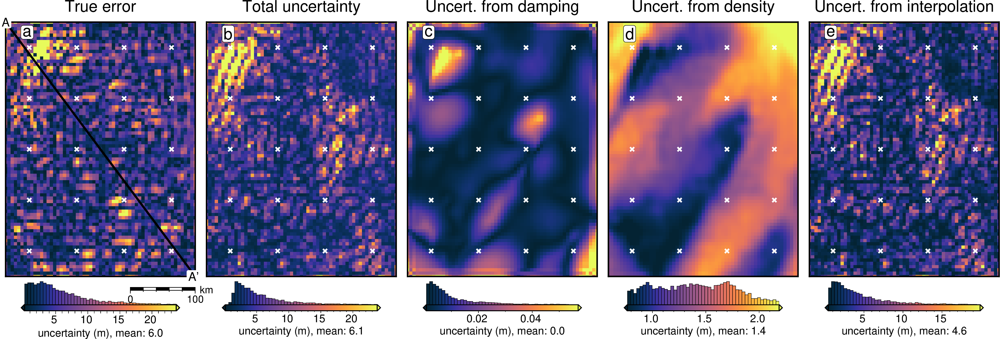

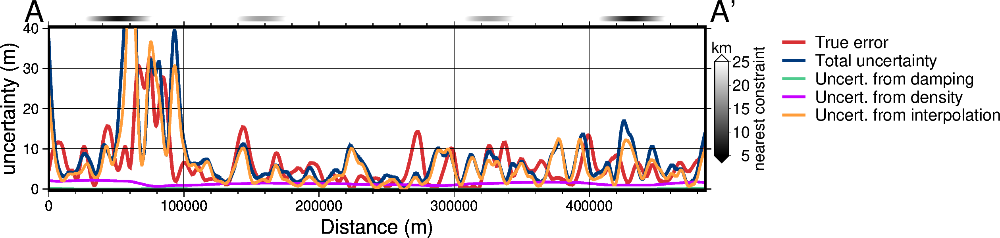

In [101]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
    "Uncert. from interpolation",
]
# grids = list(sensitivity_ds.data_vars.values())
# grids.insert(0, np.abs(final_bathymetry - bathymetry))

grids = [
    np.abs(final_bathymetry - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
    sensitivity_ds["equivalent source gridding_stdev"],
]
sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=5,
    fname="../../paper/figures/Ross_Sea_05_sensitivity.png",
)
sensitivity_profile(
    titles,
    grids,
    constraint_points=constraint_points,
    data_ylims=[0, 40],
    # data_legend_loc="jTC",
    fname="../../paper/figures/Ross_Sea_05_sensitivity_profiles.png",
)

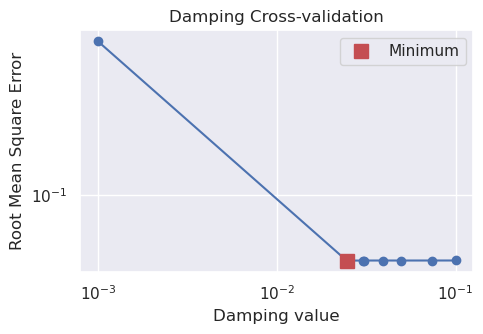

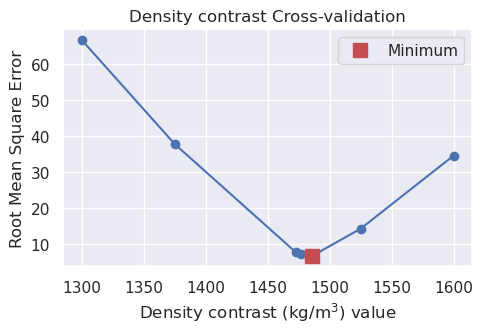

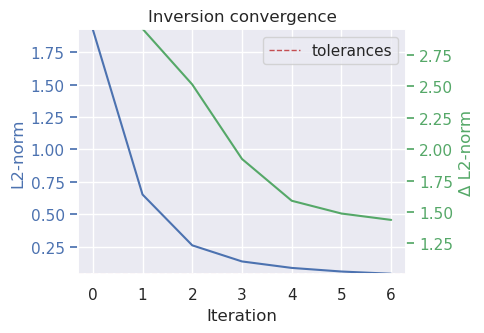

In [42]:
damp_fig = plotting.plot_cv_scores(
    damping_study.trials_dataframe().value.values,
    damping_study.trials_dataframe().params_damping.values,
    param_name="Damping",
    logx=True,
    logy=True,
)
dens_fig = plotting.plot_cv_scores(
    density_study.trials_dataframe().value.values,
    density_study.trials_dataframe().params_density_contrast.values,
    param_name="Density contrast (kg/m$^3$)",
    plot_title="Density contrast Cross-validation",
)
plotting.plot_convergence(
    inversion_results[1],
    inversion_results[2],
)

# 6: with regional

In [51]:
i = 6
final_bathymetry = final_bathymetries[i - 2]
inversion_results = best_results[i - 2]

damping_study = damping_studies[i - 2]
density_study = density_studies[i - 2]

constraint_points = pd.read_csv(f"../../results/Ross_Sea_0{i}_constraint_points.csv")

uncertainty = final_uncertainties[i - 2]
stochastic_mean = final_stochastic_means[i - 2]

grav_df = pd.read_csv("../../results/Ross_Sea_06_grav_df.csv")

uncertainty_ds = uncertainty_results[i - 2]
sensitivity_ds = sensitivity_results[i - 2]

In [52]:
grav_df.head()

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly,starting_gravity,true_res,misfit,reg,res,reg_uncert
0,-1800000.0,-40000.0,1000.0,-28.046289,0.830177,5.710065,-22.336224,-18.413437,-11.745870,-3.922787,5.365996,-9.288784,2.838591
1,-1800000.0,-35000.0,1000.0,-26.714502,0.867672,6.085010,-20.629492,-18.152997,-10.644636,-2.476496,5.457999,-7.934495,2.665995
2,-1800000.0,-30000.0,1000.0,-25.919276,0.898289,6.391175,-19.528100,-17.899238,-10.074049,-1.628863,5.543308,-7.172170,2.499328
3,-1800000.0,-25000.0,1000.0,-25.236960,0.921973,6.628021,-18.608940,-17.655357,-9.607628,-0.953582,5.620326,-6.573908,2.339424
4,-1800000.0,-20000.0,1000.0,-24.610928,0.937189,6.780179,-17.830750,-17.423734,-9.186639,-0.407016,5.687376,-6.094392,2.187283


In [53]:
# calculate the true residual and regional misfit
grav_df["true_res"] = grav_df.bathymetry_grav - grav_df.starting_gravity
grav_df["true_reg"] = grav_df.gravity_anomaly - grav_df.bathymetry_grav
grav_df.head()

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly,starting_gravity,true_res,misfit,reg,res,reg_uncert,true_reg
0,-1800000.0,-40000.0,1000.0,-28.046289,0.830177,5.710065,-22.336224,-18.413437,-9.632852,-3.922787,5.365996,-9.288784,2.838591,5.710065
1,-1800000.0,-35000.0,1000.0,-26.714502,0.867672,6.085010,-20.629492,-18.152997,-8.561505,-2.476496,5.457999,-7.934495,2.665995,6.085010
2,-1800000.0,-30000.0,1000.0,-25.919276,0.898289,6.391175,-19.528100,-17.899238,-8.020038,-1.628863,5.543308,-7.172170,2.499328,6.391175
3,-1800000.0,-25000.0,1000.0,-25.236960,0.921973,6.628021,-18.608940,-17.655357,-7.581603,-0.953582,5.620326,-6.573908,2.339424,6.628021
4,-1800000.0,-20000.0,1000.0,-24.610928,0.937189,6.780179,-17.830750,-17.423734,-7.187194,-0.407016,5.687376,-6.094392,2.187283,6.780179


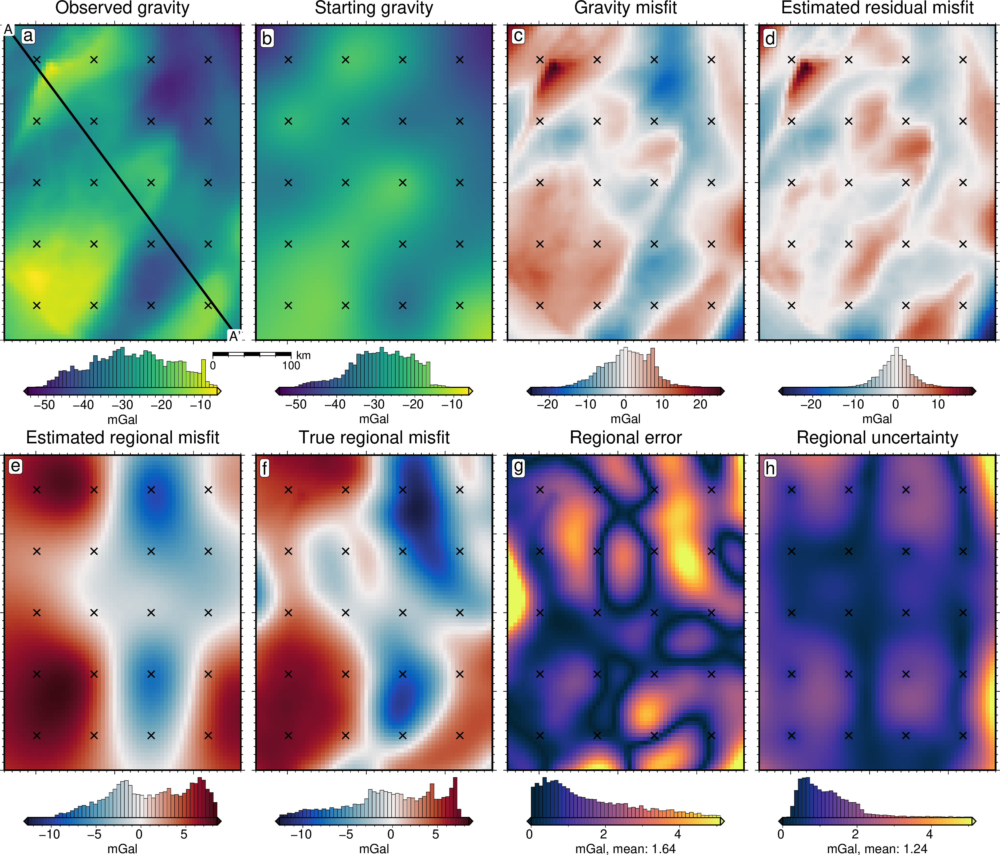

In [54]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

lims = polar_utils.get_min_max(grav_grid.gravity_anomaly)

# plot the observed gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    fig_height=10,
    cpt_lims=lims,
    title="Observed gravity",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    points=constraint_points,
    points_style="x.3c",
    scalebar=True,
    scale_position="jBR+o-1.6c/-.6c",
    scale_length=100,
)
# plot profiles location, and endpoints on map
fig.plot(
    vd.line_coordinates(profile_start, profile_end, size=100),
    pen="2p,black",
)
fig.text(
    x=profile_start[0],
    y=profile_start[1],
    text="A",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    x=profile_end[0],
    y=profile_end[1],
    text="A' ",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.6/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the starting gravity
fig = maps.plot_grd(
    grav_grid.starting_gravity,
    fig_height=10,
    cpt_lims=lims,
    title="Starting gravity",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    points=constraint_points,
    points_style="x.3c",
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot gravity misfit
dif = grav_grid.gravity_anomaly - grav_grid.starting_gravity
dif_lims = polar_utils.get_min_max(dif, robust=False)
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=(-vd.maxabs(dif_lims), vd.maxabs(dif_lims)),
    title="Gravity misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    points=constraint_points,
    points_style="x.3c",
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the estimated residual
fig = maps.plot_grd(
    grav_grid.res,
    fig_height=10,
    cmap="balance+h0",
    # robust=True,
    title="Estimated residual misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    points=constraint_points,
    points_style="x.3c",
)
fig.text(
    position="TL",
    text="d",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the estimated regional
reg_lims = polar_utils.get_combined_min_max([grav_grid.true_reg, grav_grid.reg])
fig = maps.plot_grd(
    grav_grid.reg,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=reg_lims,
    title="Estimated regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="both_shift",
    yshift_amount=-1.05,
    xshift_amount=-1.01 * 3,
    points=constraint_points,
    points_style="x.3c",
)

fig.text(
    position="TL",
    text="e",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the true regional misfit
fig = maps.plot_grd(
    grav_grid.true_reg,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=reg_lims,
    title="True regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    # yshift_amount=.5025,
    xshift_amount=1.01,
    points=constraint_points,
    points_style="x.3c",
)
fig.text(
    position="TL",
    text="f",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the regional error
dif = np.abs(grav_grid.true_reg - grav_grid.reg)
# dif_lims = polar_utils.get_min_max(dif, robust=False)
dif_lims = (0, polar_utils.get_min_max(dif, robust=True)[1])
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="thermal",
    cpt_lims=dif_lims,
    title="Regional error",
    title_font="16p,Helvetica,black",
    cbar_label=f"mGal, mean: {round(np.nanmean(dif),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    points=constraint_points,
    points_style="x.3c",
)
fig.text(
    position="TL",
    text="g",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the regional uncertainty
fig = maps.plot_grd(
    grav_grid.reg_uncert,
    fig_height=10,
    cpt_lims=dif_lims,
    cmap="thermal",
    robust=True,
    title="Regional uncertainty",
    title_font="16p,Helvetica,black",
    cbar_label=f"mGal, mean: {round(np.nanmean(grav_grid.reg_uncert),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    points=constraint_points,
    points_style="x.3c",
)
fig.text(
    position="TL",
    text="h",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
fig.savefig("../../paper/figures/Ross_Sea_06_grav_anomalies.png")
fig.show()

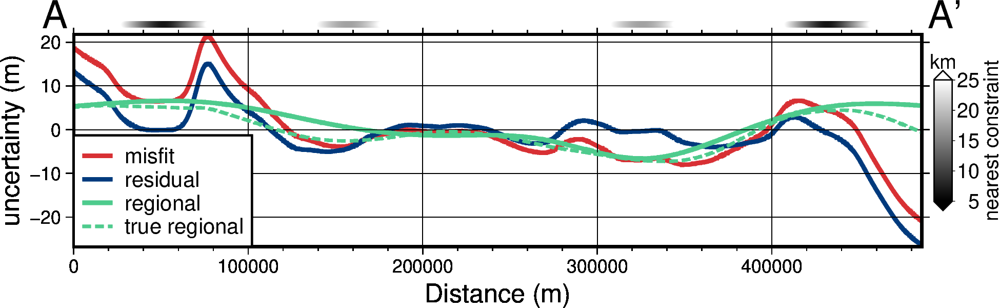

In [53]:
titles = [
    "misfit",
    "residual",
    "regional",
    "true regional",
    # "true residual",
]
grids = [
    grav_grid.misfit,
    grav_grid.res,
    grav_grid.reg,
    grav_grid.true_reg,
    # grav_grid.true_res,
]
data_ylims = None
data_dict = profiles.make_data_dict(
    names=titles,
    grids=grids,
    colors=[  # https://www.simplifiedsciencepublishing.com/resources/best-color-palettes-for-scientific-figures-and-data-visualizations
        "216/48/52",  # red, d83034
        "0/58/125",  # dark blue, 003a7d
        "78/203/141",  # green, 4ecb8d
        "78/203/141",  # green, 4ecb8d
        # "199/1/255", # purple, c701ff
        # "255/157/58", # orange, ff9d3a
        # "0/141/255", # med blue, 008dff
        # "255/115/182", # pink, ff73b6
        # "249/232/88", # yellow, f9e858
    ],
)

fig, df_data = profiles.plot_data(
    "points",
    start=profile_start,
    stop=profile_end,
    num=10000,
    fig_height=4,
    fig_width=14,
    data_dict=data_dict,
    # data_legend_loc="jTR+jTL+o1.5c/0c",
    # data_legend_box="+gwhite",
    data_legend_loc="jBL+o0c/0c",
    data_legend_box="+gwhite+p1p",
    data_buffer=0.01,
    data_frame=["neSW", "xafg+lDistance (m)", "yag+luncertainty (m)"],
    data_pen_style=[None, None, None, "4_2:2p"],
    data_pen_thickness=[2, 2, 2, 1.5],
    share_yaxis=True,
    start_label="A",
    end_label="A' ",
)

# get grid of min dists to nearest constraints
min_dist = utils.normalized_mindist(
    constraint_points,
    grids[0],
)

# set y height in data units for add dist to constraint points
data_max = df_data.drop(columns=["x", "y", "dist"]).max().max()

if data_ylims is not None:
    data_max = data_ylims[1]

df_data = profiles.sample_grids(
    df_data, min_dist, interpolation="b", sampled_name="min_dist"
)
# set color limits
series = [5e3, 25e3]

pygmt.makecpt(
    cmap="gray",
    series=series,
    background=True,
)
fig.shift_origin(
    yshift=".2c",
)
fig.plot(
    x=df_data.dist,
    y=np.ones_like(df_data.dist) * data_max,
    style="c0.1c",
    fill=df_data.min_dist,
    cmap=True,
    no_clip=True,
)
fig.shift_origin(
    yshift="-.2c",
)
with pygmt.config(
    FONT="26p,Helvetica,black",
):
    fig.colorbar(
        cmap=True,
        position="jMR+w2c/.3c+jML+v+o0.2c/0c+e",
        frame=["xa+lnearest constraint", "y+lkm"],
        scale=0.001,
    )
fig.savefig("../../paper/figures/Ross_Sea_06_grav_anomalies_profiles.png")
fig.show()

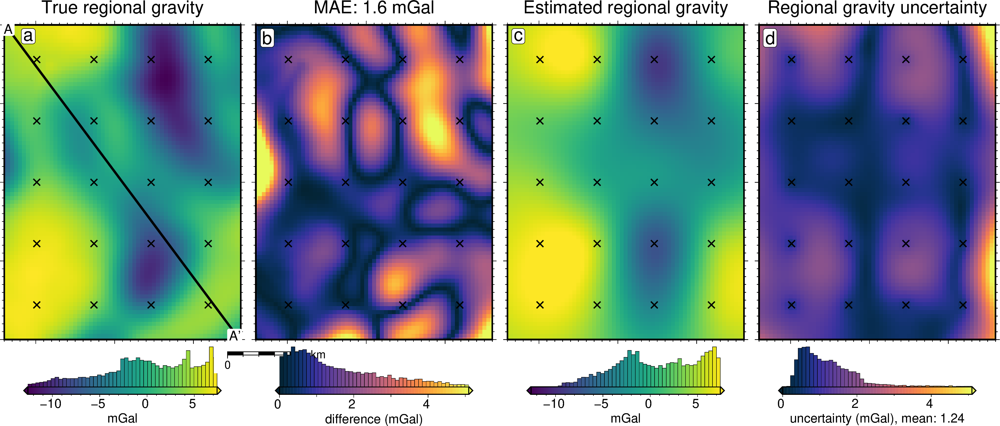

In [22]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

lims = polar_utils.get_min_max(grav_grid.basement_grav)

# plot the noise-free gravity
fig = maps.plot_grd(
    grav_grid.true_reg,
    fig_height=10,
    cpt_lims=lims,
    title="True regional gravity",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    points=constraint_points,
    points_style="x.3c",
)
# plot profiles location, and endpoints on map
fig.plot(
    vd.line_coordinates(profile_start, profile_end, size=100),
    pen="2p,black",
)
fig.text(
    x=profile_start[0],
    y=profile_start[1],
    text="A",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    x=profile_end[0],
    y=profile_end[1],
    text="A' ",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.6/.2",
    clearance="+tO",
    no_clip=True,
)
dif = np.abs(grav_grid.true_reg - grav_grid.reg)
# dif_lims = polar_utils.get_min_max(dif, robust=False)
dif_lims = (0, polar_utils.get_min_max(dif, robust=True)[1])
# dif_lims = [1]
fig = maps.plot_grd(
    dif,
    fig_height=10,
    # cmap="balance+h0",
    cmap="thermal",
    # cpt_lims=(-vd.maxabs(dif_lims), vd.maxabs(dif_lims)),
    cpt_lims=dif_lims,
    # title=f"RMSE: {round(utils.rmse(dif),1)} mGal",
    title=f"MAE: {round(np.nanmean(np.abs(dif)),1)} mGal",
    title_font="16p,Helvetica,black",
    cbar_label="difference (mGal)",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    scalebar=True,
    scale_position="jBL+o-.9c/-.6c",
    scale_length=100,
    points=constraint_points,
    points_style="x.3c",
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# plot the estimated regional
fig = maps.plot_grd(
    grav_grid.reg,
    fig_height=10,
    cpt_lims=lims,
    title="Estimated regional gravity",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    points=constraint_points,
    points_style="x.3c",
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# plot the regional uncertainty
fig = maps.plot_grd(
    grav_grid.reg_uncert,
    fig_height=10,
    cpt_lims=dif_lims,
    cmap="thermal",
    robust=True,
    title="Regional gravity uncertainty",
    title_font="16p,Helvetica,black",
    # cbar_label=f"mGal, mean: {}",
    cbar_label=f"uncertainty (mGal), mean: {round(np.nanmean(grav_grid.reg_uncert),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    points=constraint_points,
    points_style="x.3c",
)
fig.text(
    position="TL",
    text="d",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
fig.savefig("../../paper/figures/Ross_Sea_06_regional_error.png")
fig.show()

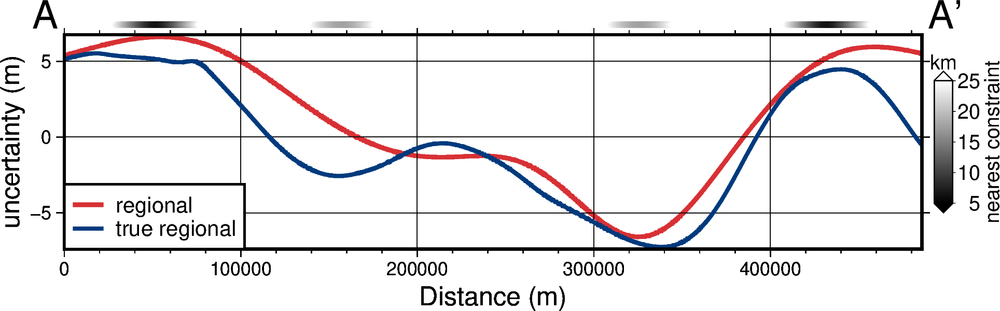

In [23]:
titles = [
    "regional",
    "true regional",
]
grids = [
    grav_grid.reg,
    grav_grid.true_reg,
]
data_ylims = None
data_dict = profiles.make_data_dict(
    names=titles,
    grids=grids,
    colors=[  # https://www.simplifiedsciencepublishing.com/resources/best-color-palettes-for-scientific-figures-and-data-visualizations
        "216/48/52",  # red, d83034
        "0/58/125",  # dark blue, 003a7d
        "78/203/141",  # green, 4ecb8d
        "199/1/255",  # purple, c701ff
        "255/157/58",  # orange, ff9d3a
        "0/141/255",  # med blue, 008dff
        "255/115/182",  # pink, ff73b6
        "249/232/88",  # yellow, f9e858
    ],
)

fig, df_data = profiles.plot_data(
    "points",
    start=profile_start,
    stop=profile_end,
    num=10000,
    fig_height=4,
    fig_width=14,
    data_dict=data_dict,
    data_legend_loc="jBL+o0c/0c",
    data_legend_box="+gwhite+p1p",
    data_buffer=0.01,
    data_frame=["neSW", "xafg+lDistance (m)", "yag+luncertainty (m)"],
    # data_pen_style=[None,None,"4_2:2p"],
    data_pen_thickness=[2, 1.8, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5],
    share_yaxis=True,
    start_label="A",
    end_label="A' ",
)

# get grid of min dists to nearest constraints
min_dist = utils.normalized_mindist(
    constraint_points,
    grids[0],
)

# set y height in data units for add dist to constraint points
data_max = df_data.drop(columns=["x", "y", "dist"]).max().max()

if data_ylims is not None:
    data_max = data_ylims[1]

df_data = profiles.sample_grids(
    df_data, min_dist, interpolation="b", sampled_name="min_dist"
)
# set color limits
series = [5e3, 25e3]

pygmt.makecpt(
    cmap="gray",
    series=series,
    background=True,
)
fig.shift_origin(
    yshift=".2c",
)
fig.plot(
    x=df_data.dist,
    y=np.ones_like(df_data.dist) * data_max,
    style="c0.1c",
    fill=df_data.min_dist,
    cmap=True,
    no_clip=True,
)
fig.shift_origin(
    yshift="-.2c",
)
with pygmt.config(
    FONT="26p,Helvetica,black",
):
    fig.colorbar(
        cmap=True,
        position="jMR+w2c/.3c+jML+v+o0.2c/0c+e",
        frame=["xa+lnearest constraint", "y+lkm"],
        scale=0.001,
    )
fig.savefig("../../paper/figures/Ross_Sea_06_regional_profiles.png")
fig.show()

In [526]:
np.abs(dif).max()

<xarray.DataArray ()> Size: 8B
array(10.94531564)

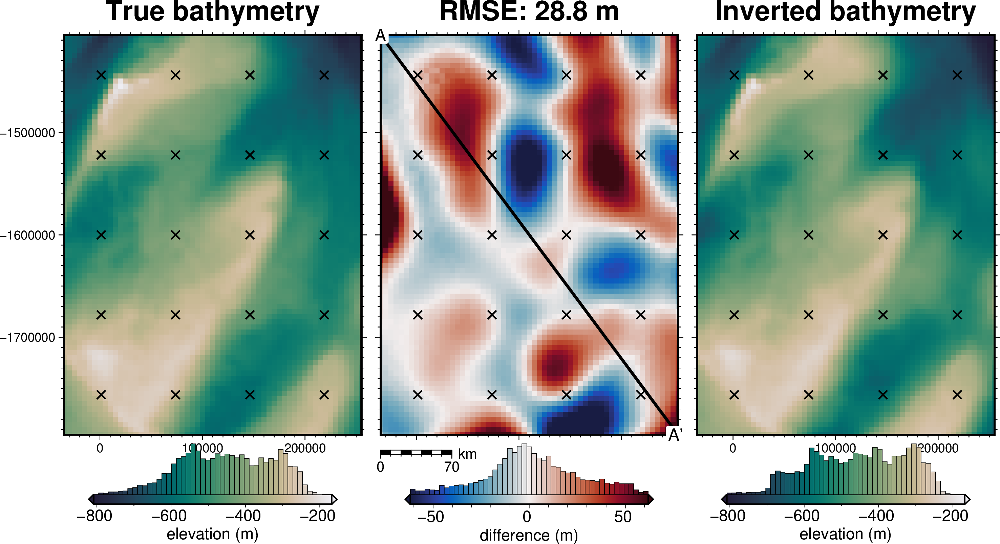

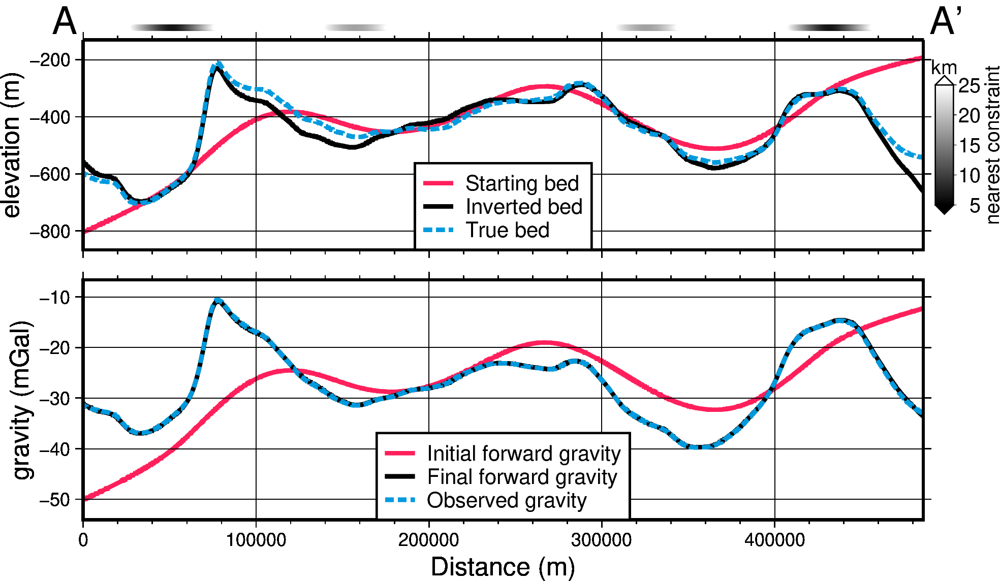

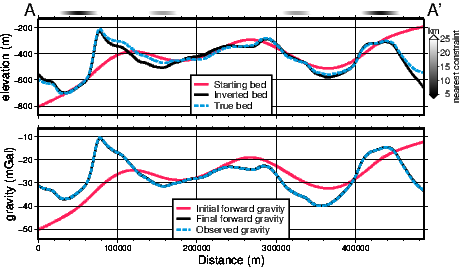

In [410]:
inverted_bathymetry_plot(
    final_bathymetry,
    constraint_points,
)
inverted_bathymetry_profile(
    inversion_results,
    constraint_points,
)

In [411]:
polar_utils.rmse(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
)

np.float64(59.30638258342832)

In [412]:
np.abs(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
).mean()

<xarray.DataArray ()> Size: 8B
array(39.28618766)

In [45]:
sensitivity_ds

<xarray.Dataset> Size: 150kB
Dimensions:         (northing: 79, easting: 59)
Coordinates:
  * northing        (northing) float64 632B -1.795e+06 -1.79e+06 ... -1.405e+06
  * easting         (easting) float64 472B -3.5e+04 -3e+04 ... 2.5e+05 2.55e+05
Data variables:
    full_stdev      (northing, easting) float64 37kB 25.24 22.59 ... 80.36 96.17
    regional_stdev  (northing, easting) float64 37kB 22.95 21.04 ... 92.09 112.1
    density_stdev   (northing, easting) float64 37kB 7.787 6.57 ... 11.05 13.67
    damping_stdev   (northing, easting) float64 37kB 4.002 2.56 ... 2.288 4.573

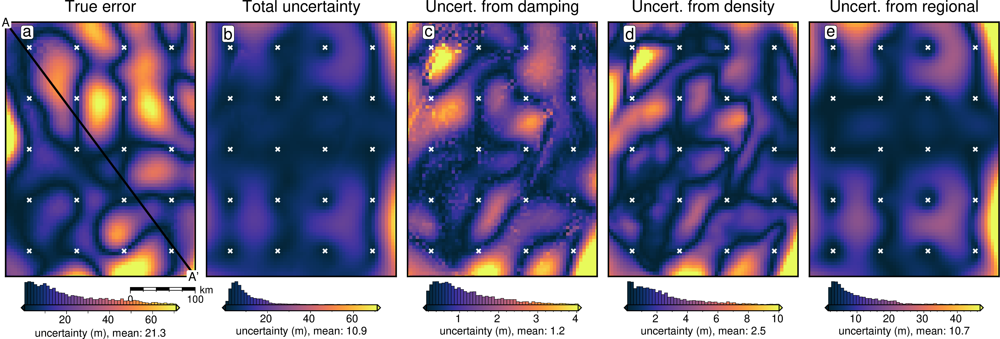

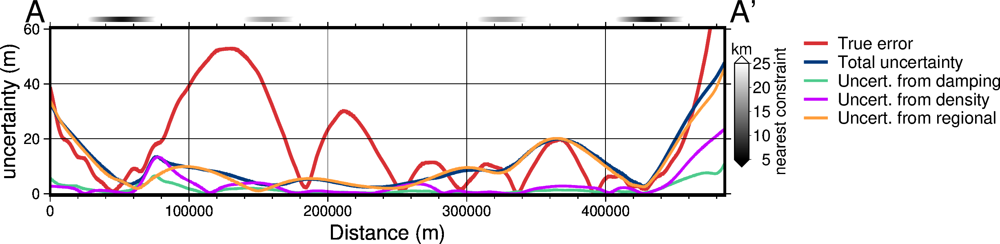

In [90]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
    "Uncert. from regional",
]
# grids = list(sensitivity_ds.data_vars.values())
# grids.insert(0, np.abs(final_bathymetry - bathymetry))

grids = [
    np.abs(final_bathymetry - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
    sensitivity_ds.regional_stdev,
]
sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=5,
    fname="../../paper/figures/Ross_Sea_06_sensitivity.png",
)
sensitivity_profile(
    titles,
    grids,
    constraint_points=constraint_points,
    data_ylims=[0, 60],
    # data_legend_loc="jTC+o3c/0c",
    fname="../../paper/figures/Ross_Sea_06_sensitivity_profiles.png",
)

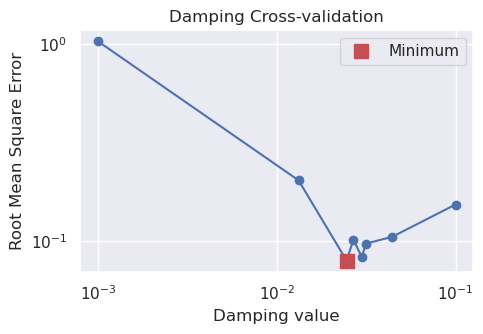

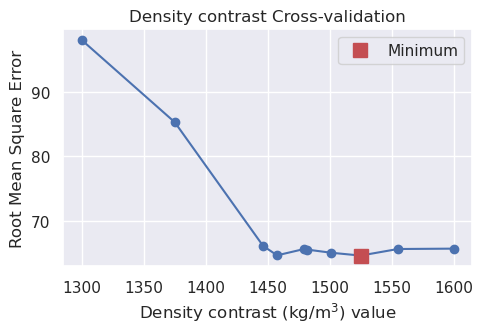

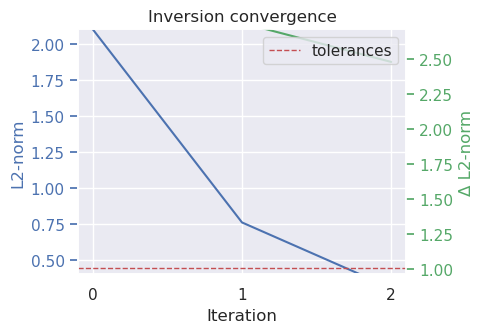

In [47]:
damp_fig = plotting.plot_cv_scores(
    damping_study.trials_dataframe().value.values,
    damping_study.trials_dataframe().params_damping.values,
    param_name="Damping",
    logx=True,
    logy=True,
)
dens_fig = plotting.plot_cv_scores(
    density_study.trials_dataframe().value.values,
    density_study.trials_dataframe().params_density_contrast.values,
    param_name="Density contrast (kg/m$^3$)",
    plot_title="Density contrast Cross-validation",
)
plotting.plot_convergence(
    inversion_results[1],
    inversion_results[2],
)

# 7: Realistic scenario

In [38]:
i = 7
final_bathymetry = final_bathymetries[i - 2]
inversion_results = best_results[i - 2]

damping_study = damping_studies[i - 2]
density_study = density_studies[i - 2]

constraint_points = pd.read_csv(f"../../results/Ross_Sea_0{i}_constraint_points.csv")

uncertainty = final_uncertainties[i - 2]
stochastic_mean = final_stochastic_means[i - 2]

grav_df = pd.read_csv("../../results/Ross_Sea_07_grav_df.csv")

uncertainty_ds = uncertainty_results[i - 2]
sensitivity_ds = sensitivity_results[i - 2]

In [39]:
sensitivity_ds

<xarray.Dataset> Size: 262kB
Dimensions:            (northing: 79, easting: 59)
Coordinates:
  * northing           (northing) float64 632B -1.795e+06 ... -1.405e+06
  * easting            (easting) float64 472B -3.5e+04 -3e+04 ... 2.55e+05
Data variables:
    full_stdev         (northing, easting) float64 37kB 55.74 50.56 ... 86.65
    eq_sources_stdev   (northing, easting) float64 37kB 5.532 2.416 ... 2.667
    regional_stdev     (northing, easting) float64 37kB 92.63 83.79 ... 60.56
    grav_stdev         (northing, easting) float64 37kB 7.519 6.284 ... 10.09
    constraints_stdev  (northing, easting) float64 37kB 17.42 16.87 ... 38.81
    density_stdev      (northing, easting) float64 37kB 6.7 5.923 ... 13.32
    damping_stdev      (northing, easting) float64 37kB 0.3446 ... 0.9997

In [40]:
grav_df.head()

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly_full_res_no_noise,gravity_anomaly_full_res,eqs_gravity_anomaly,starting_gravity,true_res,misfit,reg,res,reg_uncert,predicted_grav,uncert,gravity_anomaly,staring_res,starting_reg
0,-1800000.0,-40000.0,1000.0,-28.046289,0.830177,5.710065,-22.336224,-22.417501,-22.453228,-19.062575,-11.864706,-3.669034,6.062560,-9.731594,5.370161,-21.993275,1.715817,-22.731609,-9.731594,6.062560
1,-1800000.0,-35000.0,1000.0,-26.714502,0.867672,6.085010,-20.629492,-20.803706,-20.452633,-18.792216,-10.762418,-1.838565,6.164406,-8.002971,4.918048,-20.450028,0.472282,-20.630781,-8.002971,6.164406
2,-1800000.0,-30000.0,1000.0,-25.919276,0.898289,6.391175,-19.528100,-19.488174,-19.507269,-18.530713,-10.189173,-1.001893,6.263805,-7.265698,4.495100,-19.599002,0.132442,-19.532606,-7.265698,6.263805
3,-1800000.0,-25000.0,1000.0,-25.236960,0.921973,6.628021,-18.608940,-18.748448,-19.144625,-18.281720,-9.718220,-0.730217,6.359442,-7.089659,4.101620,-19.255206,0.440946,-19.011936,-7.089659,6.359442
4,-1800000.0,-20000.0,1000.0,-24.610928,0.937189,6.780179,-17.830750,-18.181498,-18.885928,-18.048032,-9.290557,-0.603612,6.449798,-7.053410,3.737961,-19.057972,0.697598,-18.651644,-7.053410,6.449798


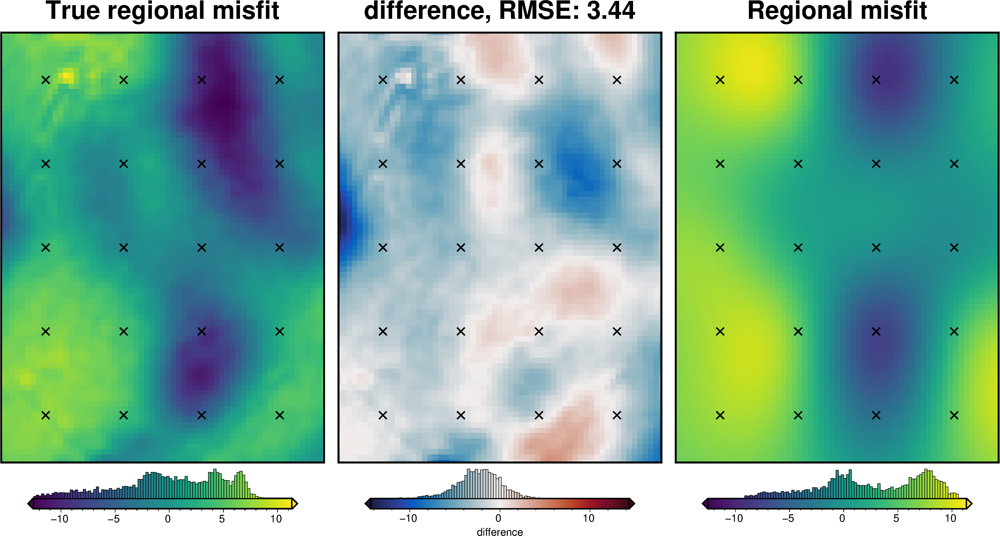

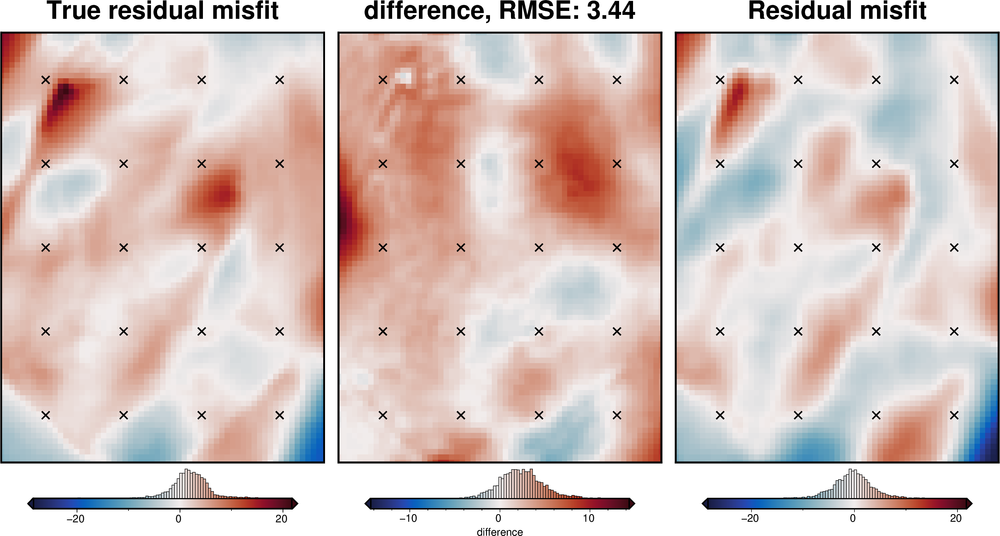

In [41]:
regional_comparison(grav_df)

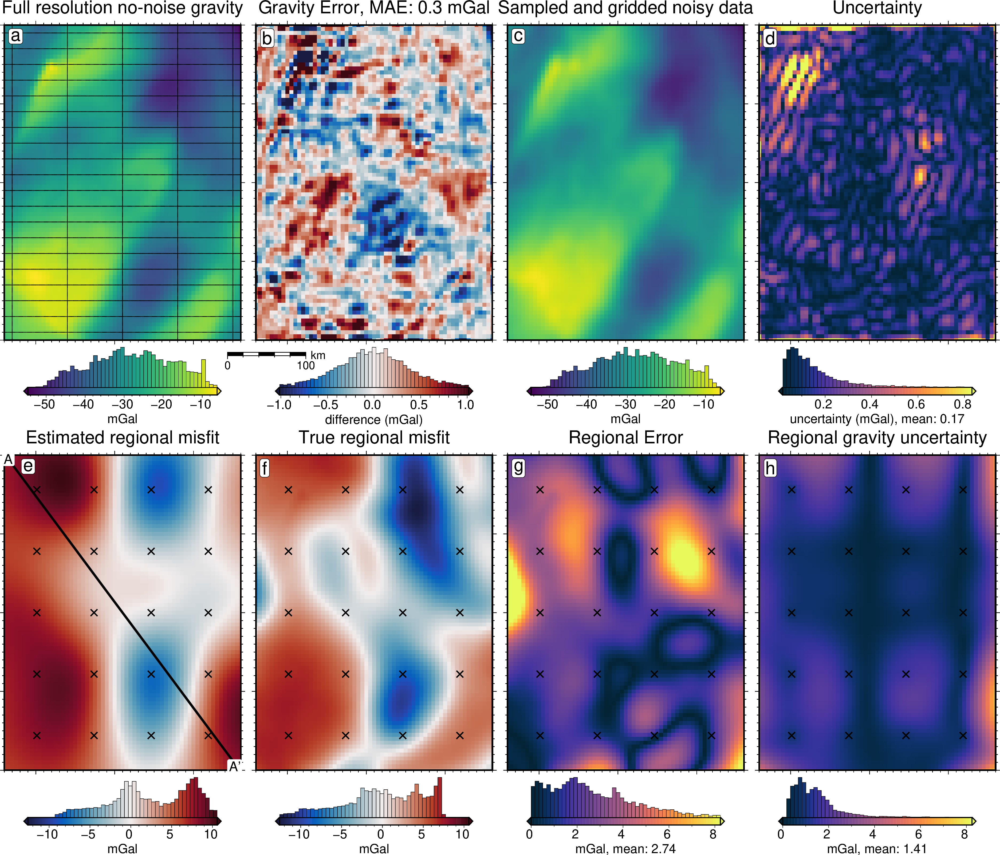

In [49]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

lims = polar_utils.get_min_max(grav_grid.gravity_anomaly_full_res_no_noise)

# plot the noise-free full res gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly_full_res_no_noise,
    fig_height=10,
    cpt_lims=lims,
    title="Full resolution no-noise gravity",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
)
# plot observation points
fig.plot(
    grav_survey_df[["easting", "northing"]],
    style="c.02c",
    fill="black",
)
fig.text(
    position="TL",
    text="a",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the gravity error
dif = grav_grid.gravity_anomaly_full_res_no_noise - grav_grid.gravity_anomaly
dif_lims = polar_utils.get_min_max(dif, robust=True)
# dif_lims = [1]
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=(-vd.maxabs(dif_lims), vd.maxabs(dif_lims)),
    # title=f"RMSE: {round(utils.rmse(dif),1)} mGal",
    title=f"Gravity Error, MAE: {round(np.nanmean(np.abs(dif)),1)} mGal",
    title_font="16p,Helvetica,black",
    cbar_label="difference (mGal)",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    scalebar=True,
    scale_position="jBL+o-.9c/-.6c",
    scale_length=100,
)
fig.text(
    position="TL",
    text="b",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the noisy interpolated gravity
fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    fig_height=10,
    cpt_lims=lims,
    title="Sampled and gridded noisy data",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
)
fig.text(
    position="TL",
    text="c",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# plot the eq source uncertainty
fig = maps.plot_grd(
    grav_grid.uncert,
    fig_height=10,
    cmap="thermal",
    robust=True,
    title="Uncertainty",
    title_font="16p,Helvetica,black",
    # cbar_label=f"mGal, mean: {}",
    cbar_label=f"uncertainty (mGal), mean: {round(np.nanmean(grav_grid.uncert),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
)
fig.text(
    position="TL",
    text="d",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# plot the estimated regional
grav_grid["true_reg"] = (
    grav_grid.gravity_anomaly_full_res_no_noise - grav_grid.bathymetry_grav
)
reg_lims = polar_utils.get_combined_min_max([grav_grid.true_reg, grav_grid.reg])
fig = maps.plot_grd(
    grav_grid.reg,
    fig_height=10,
    cmap="balance+h0",
    cpt_lims=reg_lims,
    title="Estimated regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    points=constraint_points,
    points_style="x.3c",
    origin_shift="both_shift",
    xshift_amount=-3 * 1.01,
    yshift_amount=-1.05,
)
# plot profiles location, and endpoints on map
fig.plot(
    vd.line_coordinates(profile_start, profile_end, size=100),
    pen="2p,black",
)
fig.text(
    x=profile_start[0],
    y=profile_start[1],
    text="A",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    x=profile_end[0],
    y=profile_end[1],
    text="A' ",
    fill="white",
    font="12p,Helvetica,black",
    justify="CM",
    clearance="+tO",
    no_clip=True,
)
fig.text(
    position="TL",
    text="e",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.6/.2",
    clearance="+tO",
    no_clip=True,
)

# plot the true regional misfit
fig = maps.plot_grd(
    grav_grid.true_reg,
    fig_height=10,
    cpt_lims=reg_lims,
    cmap="balance+h0",
    # robust=True,
    title="True regional misfit",
    title_font="16p,Helvetica,black",
    cbar_label="mGal",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    points=constraint_points,
    points_style="x.3c",
)
fig.text(
    position="TL",
    text="f",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# plot the regional error
dif = np.abs(grav_grid.true_reg - grav_grid.reg)
dif_lims = (0, polar_utils.get_min_max(dif, robust=True)[1])
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="thermal",
    cpt_lims=dif_lims,
    title="Regional Error",
    title_font="16p,Helvetica,black",
    cbar_label=f"mGal, mean: {round(np.nanmean(dif),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    points=constraint_points,
    points_style="x.3c",
)
fig.text(
    position="TL",
    text="g",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)
# plot the regional uncertainty
fig = maps.plot_grd(
    grav_grid.reg_uncert,
    fig_height=10,
    cpt_lims=dif_lims,
    cmap="thermal",
    robust=True,
    title="Regional gravity uncertainty",
    title_font="16p,Helvetica,black",
    cbar_label=f"mGal, mean: {round(np.nanmean(grav_grid.reg_uncert),2)}",
    cbar_font="18p,Helvetica,black",
    frame=["nswe", "xaf10000", "yaf10000"],
    hist=True,
    hist_bin_num=50,
    cbar_yoffset=1.5,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.01,
    points=constraint_points,
    points_style="x.3c",
)
fig.text(
    position="TL",
    text="h",
    fill="white",
    pen=True,
    font="16p,Helvetica,black",
    offset="j.2/.2",
    clearance="+tO",
    no_clip=True,
)

fig.savefig("../../paper/figures/Ross_Sea_07_grav_anomalies.png")
fig.show()

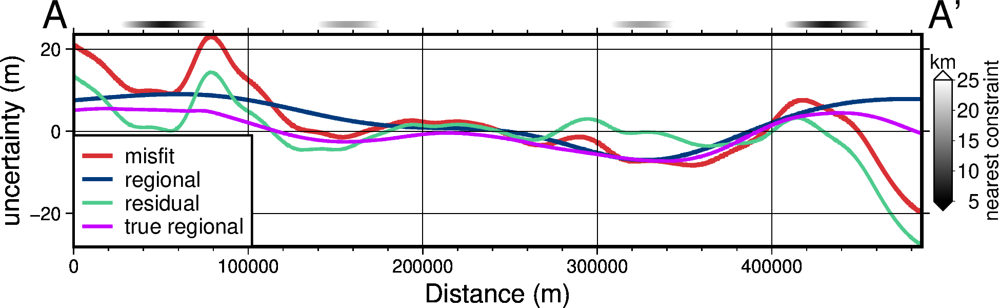

In [50]:
titles = [
    "misfit",
    "regional",
    "residual",
    "true regional",
]
grids = [
    grav_grid.misfit,
    grav_grid.reg,
    grav_grid.res,
    grav_grid.true_reg,
]
data_ylims = None
data_dict = profiles.make_data_dict(
    names=titles,
    grids=grids,
    colors=[  # https://www.simplifiedsciencepublishing.com/resources/best-color-palettes-for-scientific-figures-and-data-visualizations
        "216/48/52",  # red, d83034
        "0/58/125",  # dark blue, 003a7d
        "78/203/141",  # green, 4ecb8d
        "199/1/255",  # purple, c701ff
        "255/157/58",  # orange, ff9d3a
        "0/141/255",  # med blue, 008dff
        "255/115/182",  # pink, ff73b6
        "249/232/88",  # yellow, f9e858
    ],
)

fig, df_data = profiles.plot_data(
    "points",
    start=profile_start,
    stop=profile_end,
    num=10000,
    fig_height=4,
    fig_width=14,
    data_dict=data_dict,
    # data_legend_loc="jTR+jTL+o1.5c/0c",
    # data_legend_box="+gwhite",
    data_legend_loc="jBL+o0c/0c",
    data_legend_box="+gwhite+p1p",
    data_buffer=0.01,
    data_frame=["neSW", "xafg+lDistance (m)", "yag+luncertainty (m)"],
    # data_pen_style=[None,None,"4_2:2p"],
    data_pen_thickness=[2, 1.8, 1.5, 1.5, 1.5, 1.5, 1.5, 1.5],
    share_yaxis=True,
    start_label="A",
    end_label="A' ",
)

# get grid of min dists to nearest constraints
min_dist = utils.normalized_mindist(
    constraint_points,
    grids[0],
)

# set y height in data units for add dist to constraint points
data_max = df_data.drop(columns=["x", "y", "dist"]).max().max()

if data_ylims is not None:
    data_max = data_ylims[1]

df_data = profiles.sample_grids(
    df_data, min_dist, interpolation="b", sampled_name="min_dist"
)
# set color limits
series = [5e3, 25e3]

pygmt.makecpt(
    cmap="gray",
    series=series,
    background=True,
)
fig.shift_origin(
    yshift=".2c",
)
fig.plot(
    x=df_data.dist,
    y=np.ones_like(df_data.dist) * data_max,
    style="c0.1c",
    fill=df_data.min_dist,
    cmap=True,
    no_clip=True,
)
fig.shift_origin(
    yshift="-.2c",
)
with pygmt.config(
    FONT="26p,Helvetica,black",
):
    fig.colorbar(
        cmap=True,
        position="jMR+w2c/.3c+jML+v+o0.2c/0c+e",
        frame=["xa+lnearest constraint", "y+lkm"],
        scale=0.001,
    )
fig.savefig("../../paper/figures/Ross_Sea_07_grav_anomalies_profiles.png")
fig.show()

In [45]:
grav_error = np.abs(grav_df.gravity_anomaly_full_res_no_noise - grav_df.gravity_anomaly)
grav_error.describe()

count    4941.000000
mean        0.341489
std         0.337621
min         0.000019
25%         0.119953
50%         0.258766
75%         0.464634
max         5.776889
dtype: float64

In [65]:
reg_error = np.abs(grav_df.basement_grav - grav_df.reg)
reg_error.describe()

count    4941.000000
mean        2.739629
std         2.065309
min         0.000043
25%         1.215153
50%         2.301514
75%         3.810223
max        14.134512
dtype: float64

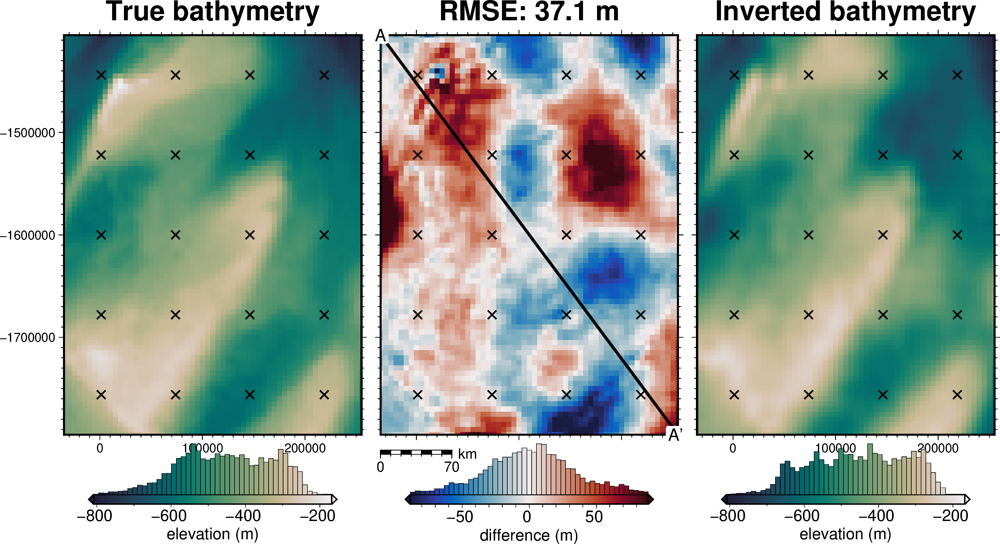

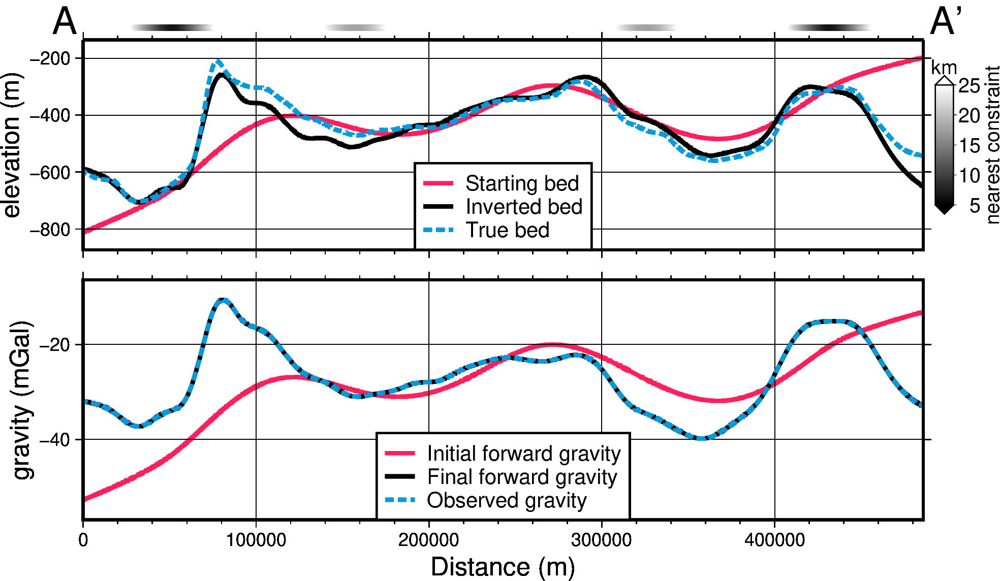

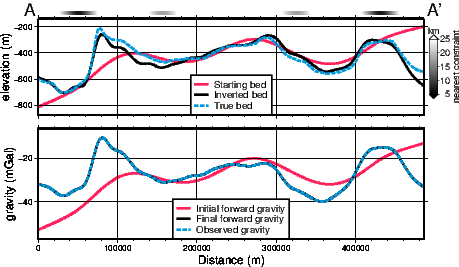

In [46]:
inverted_bathymetry_plot(
    final_bathymetry,
    constraint_points,
)
inverted_bathymetry_profile(
    inversion_results,
    constraint_points,
)

In [47]:
polar_utils.rmse(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
)

np.float64(62.73421912268751)

In [41]:
np.abs(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
).mean()

<xarray.DataArray ()> Size: 8B
array(43.5153463)

In [42]:
np.abs(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
).max()

<xarray.DataArray ()> Size: 8B
array(358.7006813)

In [43]:
np.abs(
    bathymetry
    - inversion_results[0].set_index(["northing", "easting"]).to_xarray().topo
).max()

<xarray.DataArray ()> Size: 8B
array(175.60648165)

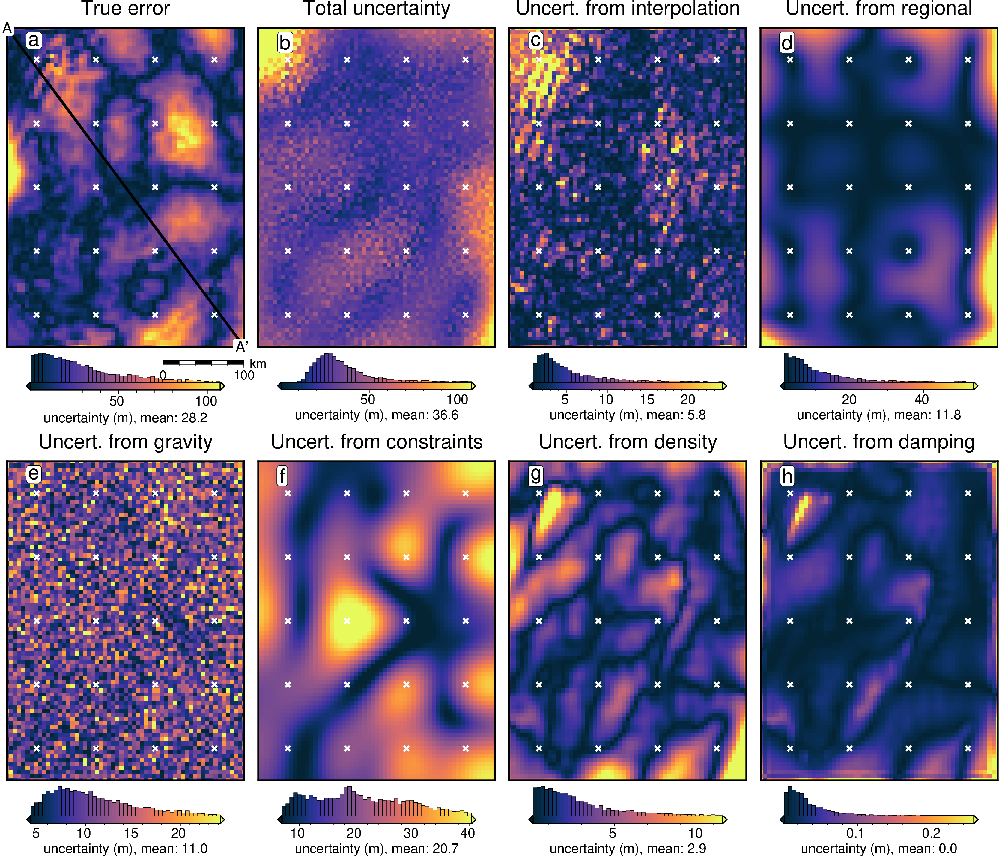

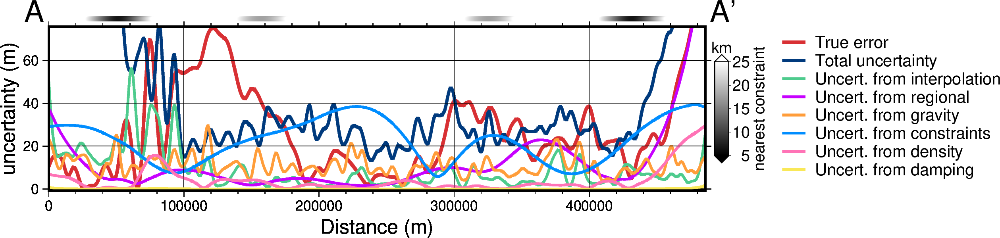

In [64]:
titles = [
    "True error",
    "Total uncertainty",
    "Uncert. from damping",
    "Uncert. from density",
    "Uncert. from constraints",
    "Uncert. from gravity",
    "Uncert. from interpolation",
    "Uncert. from regional",
]
# grids = list(sensitivity_ds.data_vars.values())
# grids.insert(0, np.abs(final_bathymetry - bathymetry))
grids = [
    np.abs(final_bathymetry - bathymetry),
    sensitivity_ds.full_stdev,
    sensitivity_ds.damping_stdev,
    sensitivity_ds.density_stdev,
    sensitivity_ds.constraints_stdev,
    sensitivity_ds.gravity_stdev,
    sensitivity_ds["equivalent source gridding_stdev"],
    sensitivity_ds.regional_stdev,
]
sensitivity_plot(
    titles,
    grids,
    constraint_points=constraint_points,
    num_in_top_row=4,
    fname="../../paper/figures/Ross_Sea_07_sensitivity.png",
)
sensitivity_profile(
    titles,
    grids,
    constraint_points=constraint_points,
    data_ylims=[0, 75],
    fname="../../paper/figures/Ross_Sea_07_sensitivity_profiles.png",
)

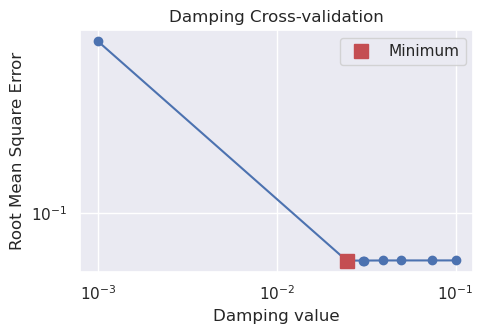

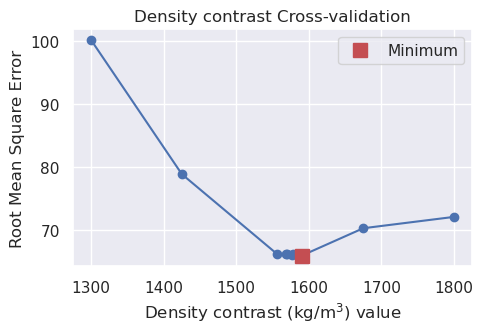

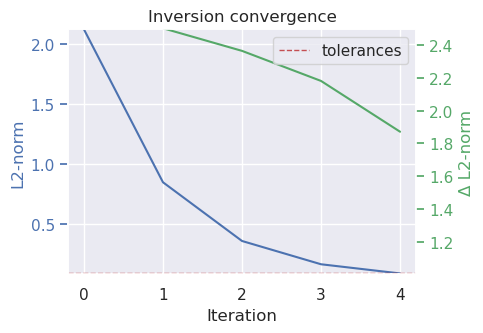

In [21]:
damp_fig = plotting.plot_cv_scores(
    damping_study.trials_dataframe().value.values,
    damping_study.trials_dataframe().params_damping.values,
    param_name="Damping",
    logx=True,
    logy=True,
)
dens_fig = plotting.plot_cv_scores(
    density_study.trials_dataframe().value.values,
    density_study.trials_dataframe().params_density_contrast.values,
    param_name="Density contrast (kg/m$^3$)",
    plot_title="Density contrast Cross-validation",
)
plotting.plot_convergence(
    inversion_results[1],
    inversion_results[2],
)

# Damping CV's

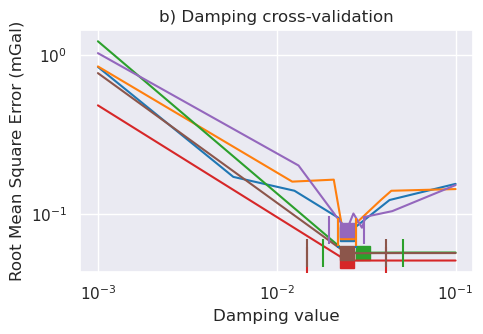

In [26]:
fig, ax = plt.subplots(figsize=(5, 3.5))

stdevs = [
    # 0.348, # test 1
    0.05,  # test 2
    0.05,  # test 3
    0.223,  # test 4
    0.223,  # test 5
    0.1,  # test 6
    0.223,  # test 7
]

for i, j in enumerate(damping_studies):
    scores = j.trials_dataframe().value.values
    parameters = j.trials_dataframe().params_damping.values
    param_name = "Damping"

    df0 = pd.DataFrame({"scores": scores, "parameters": parameters})
    df = df0.sort_values(by="parameters")

    best = df.scores.argmin()

    color = sns.color_palette("tab10")[i]

    ax.plot(
        df.parameters,
        df.scores,
        # marker="o",
        color=color,
    )

    # plot +/- stdev's
    best_damp = float(df.parameters.iloc[best])
    upper = float(10 ** (np.log10(best_damp) + stdevs[i]))
    lower = float(10 ** (np.log10(best_damp) - stdevs[i]))

    # plot square for best value
    ax.plot(
        df.parameters.iloc[best],
        df.scores.iloc[best],
        "s",
        markersize=10,
        color=color,
        label=inversion_titles[i],
        zorder=2,
    )
    # plot lines for plus and minus stdev
    ax.plot(
        lower,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )
    ax.plot(
        upper,
        df.scores.iloc[best],
        "|",
        markersize=20,
        color=color,
        markeredgewidth=1.5,
        zorder=40,
    )

ax.set_xscale("log")
ax.set_yscale("log")

# ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
# ax.legend(loc='upper right', fontsize=8)
ax.set_xlabel("Damping value")
ax.set_ylabel("Root Mean Square Error (mGal)")
ax.set_title("b) Damping cross-validation")

plt.tight_layout()
# plt.legend(fontsize=10)

plt.savefig("../../paper/figures/damping_cvs.png")

# Density optimizations

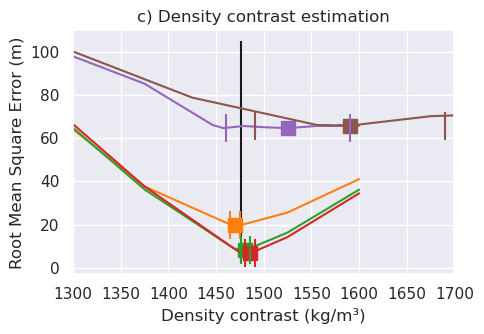

In [27]:
fig, ax = plt.subplots(figsize=(5, 3.5))

stdevs = [
    # None, # test 1
    5,  # test 2
    5,  # test 3
    5,  # test 4
    5,  # test 5
    65,  # test 6
    100,  # test 7
]
for i, j in enumerate(density_studies):
    if i == 0:
        pass
    else:
        scores = j.trials_dataframe().value.values
        parameters = j.trials_dataframe().params_density_contrast.values
        param_name = "Density"

        df0 = pd.DataFrame({"scores": scores, "parameters": parameters})
        df = df0.sort_values(by="parameters")

        best = df.scores.argmin()

        color = sns.color_palette("tab10")[i]

        ax.plot(
            df.parameters,
            df.scores,
            # marker="o",
            color=color,
        )

        # plot +/- stdev's
        upper = df.parameters.iloc[best] + stdevs[i]
        lower = df.parameters.iloc[best] - stdevs[i]

        # plot square for best value
        ax.plot(
            df.parameters.iloc[best],
            df.scores.iloc[best],
            "s",
            markersize=10,
            color=color,
            zorder=2,
            # xerr=stdevs[i],
            # capsize=10,
            # linestyle=None,
            # elinewidth=0,
            # # ecolor='k',
            # capthick=1.5,
        )
        # plot lines for plus and minus stdev
        ax.plot(
            lower,
            df.scores.iloc[best],
            "|",
            markersize=20,
            color=color,
            markeredgewidth=1.5,
            zorder=40,
        )
        ax.plot(
            upper,
            df.scores.iloc[best],
            "|",
            markersize=20,
            color=color,
            markeredgewidth=1.5,
            zorder=40,
        )


y_lims = ax.get_ylim()
ax.vlines(
    true_density_contrast,
    ymin=y_lims[0],
    ymax=y_lims[1],
    color="k",
    zorder=1,
    label="True density",
)
# ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.set_xlabel("Density contrast (kg/m³)")
ax.set_ylabel("Root Mean Square Error (m)")
ax.set_title("c) Density contrast estimation")

ax.set_xlim(1300, 1700)

plt.tight_layout()

plt.savefig("../../paper/figures/density_optimizations.png")

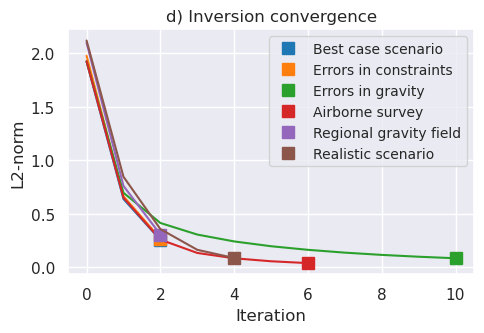

In [ ]:
fig, ax1 = plt.subplots(figsize=(5, 3.5))

for i, j in enumerate(best_results):
    grav_results = j[1]
    params = j[2]

    # get misfit data at end of each iteration
    cols = [s for s in grav_results.columns.to_list() if "_final_misfit" in s]
    iters = len(cols)

    l2_norms = [np.sqrt(utils.rmse(grav_results[i])) for i in cols]
    starting_misfit = utils.rmse(grav_results["iter_1_initial_misfit"])
    starting_l2_norm = np.sqrt(starting_misfit)

    # add starting l2 norm to the beginning of the list
    l2_norms.insert(0, starting_l2_norm)

    # calculate delta L2-norms
    delta_l2_norms = []
    for k, m in enumerate(l2_norms):
        if k == 0:
            delta_l2_norms.append(np.nan)
        else:
            delta_l2_norms.append(l2_norms[k - 1] / m)

    # get tolerance values
    l2_norm_tolerance = float(params["L2 norm tolerance"])
    delta_l2_norm_tolerance = float(params["Delta L2 norm tolerance"])

    color = sns.color_palette("tab10")[i]

    # plot L2-norm convergence
    ax1.plot(
        range(iters + 1),
        l2_norms,
        color=color,
        # label=inversion_titles[i],
    )
    # plot square for end iteration
    ax1.plot(
        iters,
        l2_norms[-1],
        "s",
        markersize=8,
        color=color,
        zorder=2,
        label=inversion_titles[i],
    )
# set x axis to integer values
ax1.xaxis.set_major_locator(mpl.ticker.MaxNLocator(integer=True))

ax1.legend(loc="upper right", fontsize=10)

# set axis labels, ticks and gridlines
ax1.set_xlabel("Iteration")
ax1.set_ylabel("L2-norm")
ax1.tick_params(axis="y", which="both")
plt.title("d) Inversion convergence")
plt.tight_layout()
plt.savefig("../../paper/figures/convergences.png")
plt.show()

# Inversions 2-7

## Inversion results

In [759]:
dif_grids = []
for g in final_bathymetries:
    dif_grids.append(bathymetry - g)

# use combined min max
# dif_lims = polar_utils.get_combined_min_max(dif_grids, robust=True)

# use quartiles for combined min/max
# mins = pd.Series([polar_utils.get_min_max(g, robust=True)[0] for g in dif_grids])
# maxes = pd.Series([polar_utils.get_min_max(g, robust=True)[1] for g in dif_grids])
# dif_lims = mins.quantile(.25), maxes.quantile(.75)

# set min max as 2nd to last grid
dif_lims = polar_utils.get_min_max(dif_grids[-2], robust=True)

dif_lims

(np.float64(-61.27016730277889), np.float64(61.88889827253576))

In [760]:
abs_inversion_errors = []
uncert_errors = []
# for i, g in enumerate(final_stochastic_means):
for i, g in enumerate(final_bathymetries):
    abs_inversion_error = np.abs(bathymetry - g)
    abs_inversion_errors.append(abs_inversion_error)

    uncert_errors.append(abs_inversion_error - final_uncertainties[i])

# use combined min max
inversion_error_lims = (
    0,
    polar_utils.get_combined_min_max(abs_inversion_errors, robust=True)[1],
)
# uncert_error_lims = polar_utils.get_combined_min_max(uncert_errors, robust=True)

# use quartiles for combined min/max
# mins = pd.Series([polar_utils.get_min_max(g, robust=True)[0] for g in dif_grids])
# maxes = pd.Series([polar_utils.get_min_max(g, robust=True)[1] for g in dif_grids])
# dif_lims = mins.quantile(.25), maxes.quantile(.75)

# set min max as 2nd to last grid
uncert_error_lims = polar_utils.get_min_max(uncert_errors[-2], robust=True)

inversion_error_lims, uncert_error_lims

((0, np.float64(92.25477775336675)),
 (np.float64(-24.734066417359237), np.float64(63.48645438819427)))

grdinfo [ERROR]: No 3rd-dimension coordinate vector found in /home/mdtanker/RIS_gravity_inversion/results/Ross_Sea_02_uncertainty.nc
grdinfo [ERROR]: gmtapi_import_cube: Unable to examine cube /home/mdtanker/RIS_gravity_inversion/results/Ross_Sea_02_uncertainty.nc.
[Session pygmt-session (9025)]: Error returned from GMT API: GMT_RUNTIME_ERROR (79)
[Session pygmt-session (9025)]: Error returned from GMT API: GMT_RUNTIME_ERROR (79)
grdinfo [ERROR]: No 3rd-dimension coordinate vector found in /home/mdtanker/RIS_gravity_inversion/results/Ross_Sea_03_uncertainty.nc
grdinfo [ERROR]: gmtapi_import_cube: Unable to examine cube /home/mdtanker/RIS_gravity_inversion/results/Ross_Sea_03_uncertainty.nc.
[Session pygmt-session (9186)]: Error returned from GMT API: GMT_RUNTIME_ERROR (79)
[Session pygmt-session (9186)]: Error returned from GMT API: GMT_RUNTIME_ERROR (79)
grdinfo [ERROR]: No 3rd-dimension coordinate vector found in /home/mdtanker/RIS_gravity_inversion/results/Ross_Sea_04_uncertainty.nc

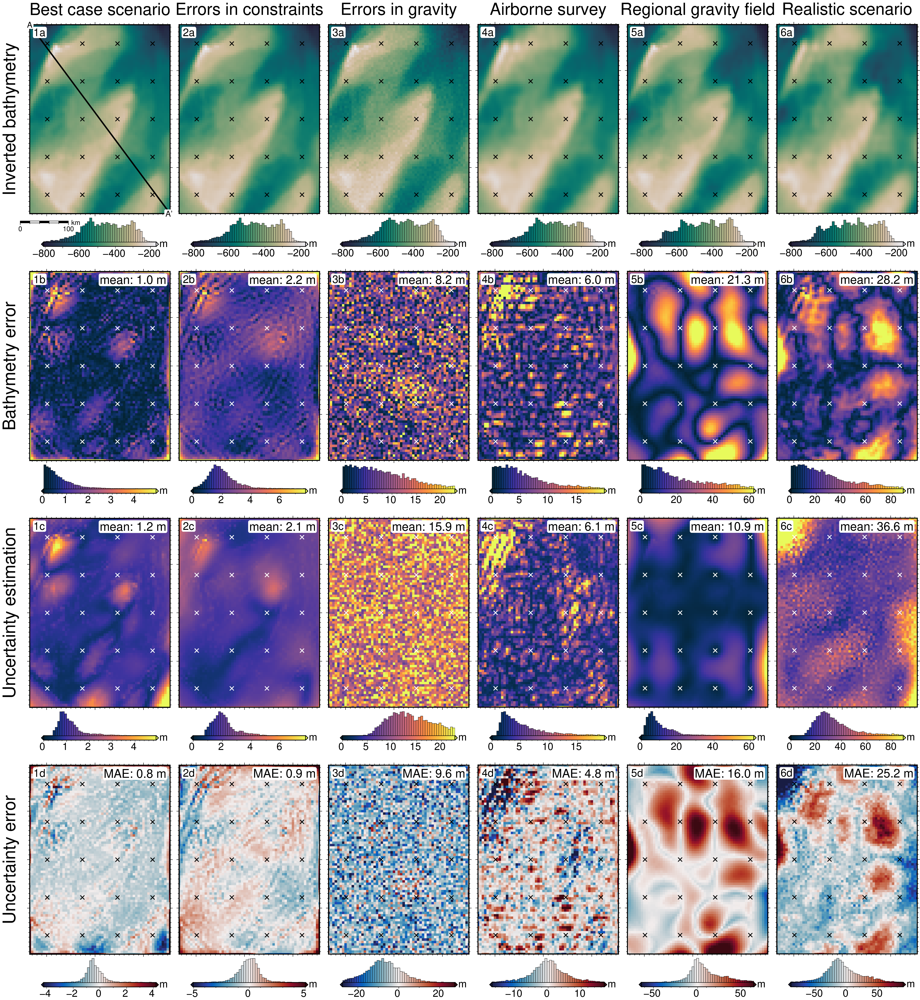

In [761]:
bathy_lims = polar_utils.get_min_max(bathymetry)

inversion_MAEs = []
inversion_RMSEs = []
uncert_MAEs = []
uncert_RMSEs = []
uncert_MAs = []
uncert_RMSs = []
for i, g in enumerate(final_bathymetries):
    if i == 0:
        fig = None
        origin_shift = "initialize"
        scalebar = True
    else:
        origin_shift = "both_shift"
        scalebar = False

    constraint_points = constraint_points_dfs[i]

    yshift_amount = 1.005
    # plot the starting bathymetry
    fig = maps.plot_grd(
        g,
        fig_height=10,
        cmap="rain",
        reverse_cpt=True,
        cpt_lims=bathy_lims,
        # cbar_label="elevation (m)",
        cbar_unit="m",
        cbar_font="24p,Helvetica,black",
        frame=["nswe", "xaf10000", "yaf10000"],
        hist=True,
        hist_bin_num=50,
        cbar_yoffset=1.5,
        fig=fig,
        origin_shift=origin_shift,
        yshift_amount=3 * yshift_amount,
        xshift_amount=1.01,
        points=constraint_points,
        points_style="x.3c",
        scalebar=scalebar,
        scale_position="jBL+o-.5c/-.6c",
        scale_length=100,
    )

    # add title to each column
    fig.text(
        y=plot_region[3] + 20e3,
        x=np.mean([plot_region[0], plot_region[1]]),
        justify="BC",
        text=inversion_titles[i],
        fill="white",
        font="25p,Helvetica,black",
        clearance="+tO",
        no_clip=True,
    )

    if i == 0:
        # add title to top row
        fig.text(
            x=plot_region[0] - 30e3,
            y=np.mean([plot_region[2], plot_region[3]]),
            justify="BC",
            text="Inverted bathymetry",
            fill="white",
            angle=90,
            font="26p,Helvetica,black",
            clearance="+tO",
            no_clip=True,
        )
        # # add subplot label
        # fig.text(
        #     position="TL",
        #     justify="BR",
        #     offset="j1c/1c",
        #     text = "a)",
        #     fill = 'white',
        #     font = '36p,Helvetica,black',
        #     clearance = '+tO',
        #     no_clip=True,
        # )
        # add transect line
        # plot profiles location, and endpoints on map
        fig.plot(
            vd.line_coordinates(profile_start, profile_end, size=100),
            pen="2p,black",
        )
        fig.text(
            x=profile_start[0],
            y=profile_start[1],
            text="A",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
        fig.text(
            x=profile_end[0],
            y=profile_end[1],
            text="A' ",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )

    # plot subplot labels (1a, 1b, 1c, etc.)
    fig.text(
        position="TL",
        text=f"{i+1}a",
        fill="white",
        font="16p,Helvetica,black",
        offset="j.2/.2",
        clearance="+tO",
    )
    cpt_lims = polar_utils.get_min_max(dif_grids[i], robust=True)

    # plot bathymetry error
    fig = maps.plot_grd(
        np.abs(dif_grids[i]),
        fig_height=10,
        # cmap="balance+h0",
        cmap="thermal",
        # cpt_lims=(-vd.maxabs(dif_lims), vd.maxabs(dif_lims)),
        # cpt_lims=(-vd.maxabs(cpt_lims), vd.maxabs(cpt_lims)),
        cpt_lims=(0, vd.maxabs(cpt_lims)),
        # title=f"RMSE: {round(utils.rmse(dif_grids[i]),1)} m",
        # title_font="18p,Helvetica,black",
        # cbar_label=f"difference (m)",
        cbar_unit="m",
        cbar_font="24p,Helvetica,black",
        frame=["nswe", "xaf10000", "yaf10000"],
        hist=True,
        hist_bin_num=50,
        cbar_yoffset=1.5,
        grd2_cpt=True,
        fig=fig,
        origin_shift="yshift",
        yshift_amount=-yshift_amount,
        points=constraint_points,
        points_style="x.3c",
        points_fill="white",
    )
    inversion_MAE = np.abs(dif_grids[i]).values.mean()
    inversion_RMSE = utils.rmse(dif_grids[i])
    inversion_MAEs.append(inversion_MAE)
    inversion_RMSEs.append(inversion_RMSE)

    # add errors to plot
    fig.text(
        position="TR",
        # text=f"RMSE: {round(inversion_RMSE,1)} m",
        text=f"mean: {round(inversion_MAE,1)} m",
        fill="white",
        font="18p,Helvetica,black",
        offset="j.2/.2",
        clearance="+tO",
    )
    # plot subplot labels
    fig.text(
        position="TL",
        text=f"{i+1}b",
        fill="white",
        font="16p,Helvetica,black",
        offset="j.2/.2",
        clearance="+tO",
    )
    if i == 0:
        # add title to 2nd row
        fig.text(
            x=plot_region[0] - 30e3,
            y=np.mean([plot_region[2], plot_region[3]]),
            justify="BC",
            text="Bathymetry error",
            fill="white",
            angle=90,
            font="26p,Helvetica,black",
            clearance="+tO",
            no_clip=True,
        )

    # plot the uncertainty
    fig = maps.plot_grd(
        final_uncertainties[i],
        fig_height=10,
        cmap="thermal",
        # robust=True,
        cpt_lims=(0, vd.maxabs(cpt_lims)),
        # cbar_label="elevation (m)",
        cbar_unit="m",
        cbar_font="24p,Helvetica,black",
        frame=["nswe", "xaf10000", "yaf10000"],
        hist=True,
        hist_bin_num=50,
        cbar_yoffset=1.5,
        fig=fig,
        origin_shift="yshift",
        yshift_amount=-yshift_amount,
        points=constraint_points,
        points_style="x.3c",
        points_fill="white",
    )

    uncert_MA = np.abs(final_uncertainties[i]).values.mean()
    uncert_RMS = utils.rmse(final_uncertainties[i])
    uncert_MAs.append(uncert_MA)
    uncert_RMSs.append(uncert_RMS)

    # add mean / rms to plot
    fig.text(
        position="TR",
        # text=f"RMS: {round(uncert_RMS,1)} m",
        text=f"mean: {round(uncert_MA,1)} m",
        fill="white",
        font="18p,Helvetica,black",
        offset="j.2/.2",
        clearance="+tO",
    )
    # plot subplot labels
    fig.text(
        position="TL",
        text=f"{i+1}c",
        fill="white",
        font="16p,Helvetica,black",
        offset="j.2/.2",
        clearance="+tO",
    )
    if i == 0:
        # add title to 3rd row
        fig.text(
            x=plot_region[0] - 30e3,
            y=np.mean([plot_region[2], plot_region[3]]),
            justify="BC",
            text="Uncertainty estimation",
            fill="white",
            angle=90,
            font="26p,Helvetica,black",
            clearance="+tO",
            no_clip=True,
        )

    # plot uncertainty error
    cpt_lims = polar_utils.get_min_max(uncert_errors[i], robust=True)
    fig = maps.plot_grd(
        uncert_errors[i],
        fig_height=10,
        cmap="balance+h0",
        # cpt_lims=(-vd.maxabs(uncert_error_lims), vd.maxabs(uncert_error_lims)),
        cpt_lims=(-vd.maxabs(cpt_lims), vd.maxabs(cpt_lims)),
        # title_font="18p,Helvetica,black",
        # cbar_label=f"difference (m)",
        cbar_unit="m",
        cbar_font="24p,Helvetica,black",
        frame=["nswe", "xaf10000", "yaf10000"],
        hist=True,
        hist_bin_num=50,
        cbar_yoffset=1.5,
        grd2_cpt=True,
        fig=fig,
        origin_shift="yshift",
        yshift_amount=-yshift_amount,
        # scalebar=True,
        # scale_position="jBL+o0c/-.6c",
        points=constraint_points,
        points_style="x.3c",
    )

    uncert_MAE = np.abs(uncert_errors[i]).values.mean()
    uncert_RMSE = utils.rmse(uncert_errors[i])
    uncert_MAEs.append(uncert_MAE)
    uncert_RMSEs.append(uncert_RMSE)

    # add RMSE / MAE to plot
    fig.text(
        position="TR",
        # text=f"RMS: {round(uncert_RMSE,1)} m",
        text=f"MAE: {round(uncert_MAE,1)} m",
        fill="white",
        font="18p,Helvetica,black",
        offset="j.2/.2",
        clearance="+tO",
    )
    # plot subplot labels
    fig.text(
        position="TL",
        text=f"{i+1}d",
        fill="white",
        font="16p,Helvetica,black",
        offset="j.2/.2",
        clearance="+tO",
    )
    if i == 0:
        # add title to 4th row
        fig.text(
            x=plot_region[0] - 30e3,
            y=np.mean([plot_region[2], plot_region[3]]),
            justify="BC",
            text="Uncertainty error",
            fill="white",
            angle=90,
            font="26p,Helvetica,black",
            clearance="+tO",
            no_clip=True,
        )

fig.savefig("../../paper/figures/Ross_Sea_inversions.png", dpi=500)

fig.show()

## Sensitivity results

In [14]:
# plots_in_row = []
# for column, final_bathymetry in enumerate(final_bathymetries):
#     # get data for each test
#     sensitivity_ds = sensitivity_results[column]
#     # if column == 0:
#     #     titles = [
#     #         "True error",
#     #         "Total uncertainty",
#     #     ]
#     #     grids=[
#     #         np.abs(final_bathymetry - bathymetry),
#     #         final_uncertainties[column],
#     #     ]
#     #     constraint_points = constraint_points_dfs[column]
#     #     plots_in_row.append(len(grids))
#     if column == 0:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#         ]
#         constraint_points = constraint_points_dfs[column]
#         plots_in_row.append(len(grids))
#     elif column == 1:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             "Uncert. from constraints",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             sensitivity_ds.constraints_stdev,
#         ]
#         constraint_points = constraint_points_dfs[column]
#         plots_in_row.append(len(grids))
#     elif column == 2:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             "Uncert. from gravity",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             sensitivity_ds.gravity_stdev,
#         ]
#         constraint_points = constraint_points_dfs[column]
#         plots_in_row.append(len(grids))
#     elif column == 3:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             "Uncert. from interpolation",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             sensitivity_ds["equivalent source gridding_stdev"],
#         ]
#         constraint_points = constraint_points_dfs[column]
#         plots_in_row.append(len(grids))
#     elif column == 4:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             "Uncert. from regional",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             sensitivity_ds.regional_stdev,
#         ]
#         constraint_points = constraint_points_dfs[column]
#         plots_in_row.append(len(grids))
#     elif column == 5:
#         titles = [
#             "True error",
#             "Total uncertainty",
#             "Uncert. from damping",
#             "Uncert. from density",
#             "Uncert. from constraints",
#             "Uncert. from gravity",
#             "Uncert. from interpolation",
#             "Uncert. from regional",
#         ]
#         grids = [
#             np.abs(final_bathymetry - bathymetry),
#             sensitivity_ds.full_stdev,
#             sensitivity_ds.damping_stdev,
#             sensitivity_ds.density_stdev,
#             sensitivity_ds.constraints_stdev,
#             sensitivity_ds.grav_stdev,
#             sensitivity_ds["eq_sources_stdev"],
#             sensitivity_ds.regional_stdev,
#         ]
#         constraint_points = constraint_points_dfs[column]
#         plots_in_row.append(len(grids))

#     # clip each grid to region of interest
#     grids = [g.sel(
#             easting=slice(plot_region[0], plot_region[1]),
#             northing=slice(plot_region[2], plot_region[3]),
#         ) for g in grids]

#     first_2_lims = polar_utils.get_combined_min_max(grids[0:2], robust=True)
#     # cpt_lims = polar_utils.get_min_max(grids[1], robust=True)

#     # plot specs
#     yshift_amount = -1.005
#     xshift_amount = 1
#     fig_height = 8

#     first_column = True
#     for row, g in enumerate(grids):
#         if row == 0:
#             origin_shift = "both_shift"
#             yshift_amount = -(plots_in_row[column-1]-1)*yshift_amount
#             scalebar=True
#             if column == 0:
#                 origin_shift="initialize"
#                 fig=None
#                 scalebar=True
#         else:
#             origin_shift = "yshift"
#             scalebar=False
#             yshift_amount = -1.005
#         if row < 2:
#             cpt_lims = first_2_lims
#         else:
#             cpt_lims = polar_utils.get_min_max(g, robust=True)

#         fig = maps.plot_grd(
#             grid=g,
#             fig_height=fig_height,
#             # title=titles[row],
#             # title_font="16p,Helvetica,black",
#             cmap="thermal",
#             cpt_lims = cpt_lims,
#             cbar_label=f"uncertainty (m), mean: {round(np.nanmean(g),1)}",
#             cbar_font="18p,Helvetica,black",
#             hist=True,
#             hist_bin_num=50,
#             cbar_yoffset=1,
#             fig=fig,
#             origin_shift=origin_shift,
#             xshift_amount=xshift_amount,
#             yshift_amount=yshift_amount,
#             scalebar=scalebar,
#             scale_length=100,
#             scale_position="jBR+o0c/-.6c",
#         )
#         if constraint_points is not None:
#             fig.plot(
#                 x=constraint_points.easting,
#                 y=constraint_points.northing,
#                 style="x.2c",
#                 fill="white",
#                 pen="1.5p,white",
#             )
#         fig.text(
#             position="TL",
#             text=f"{string.ascii_lowercase[row]}",
#             fill="white",
#             pen=True,
#             font="16p,Helvetica,black",
#             offset="j.6/.2",
#             clearance="+tO",
#             no_clip=True,
#         )
#         if row == 0:
#             if column == 0:
#                 # plot profiles location, and endpoints on map
#                 fig.plot(
#                     vd.line_coordinates(profile_start, profile_end, size=100),
#                     pen="2p,black",
#                 )
#                 fig.text(
#                     x=profile_start[0],
#                     y=profile_start[1],
#                     text="A",
#                     fill="white",
#                     font="12p,Helvetica,black",
#                     justify="CM",
#                     clearance="+tO",
#                     no_clip=True,
#                 )
#                 fig.text(
#                     x=profile_end[0],
#                     y=profile_end[1],
#                     text="A' ",
#                     fill="white",
#                     font="12p,Helvetica,black",
#                     justify="CM",
#                     clearance="+tO",
#                     no_clip=True,
#                 )
#             # add title to each column
#             fig.text(
#                 y = plot_region[3]+40e3,
#                 x = np.mean([plot_region[0],plot_region[1]]),
#                 justify="TC",
#                 text = inversion_titles[column],
#                 fill = 'white',
#                 font = '26p,Helvetica,black',
#                 clearance = '+tO',
#                 no_clip=True,
#             )
#         if first_column is True:
#             # add title to each row
#             fig.text(
#                 x = plot_region[0]-30e3,
#                 y = np.mean([plot_region[2],plot_region[3]]),
#                 justify="BC",
#                 text = titles[row],
#                 fill = 'white',
#                 angle = 90,
#                 font = '26p,Helvetica,black',
#                 clearance = '+tO',
#                 no_clip=True,
#             )
#         first_column=False
#     # if fname is not None:
#         # fig.savefig(fname)
# fig.show()

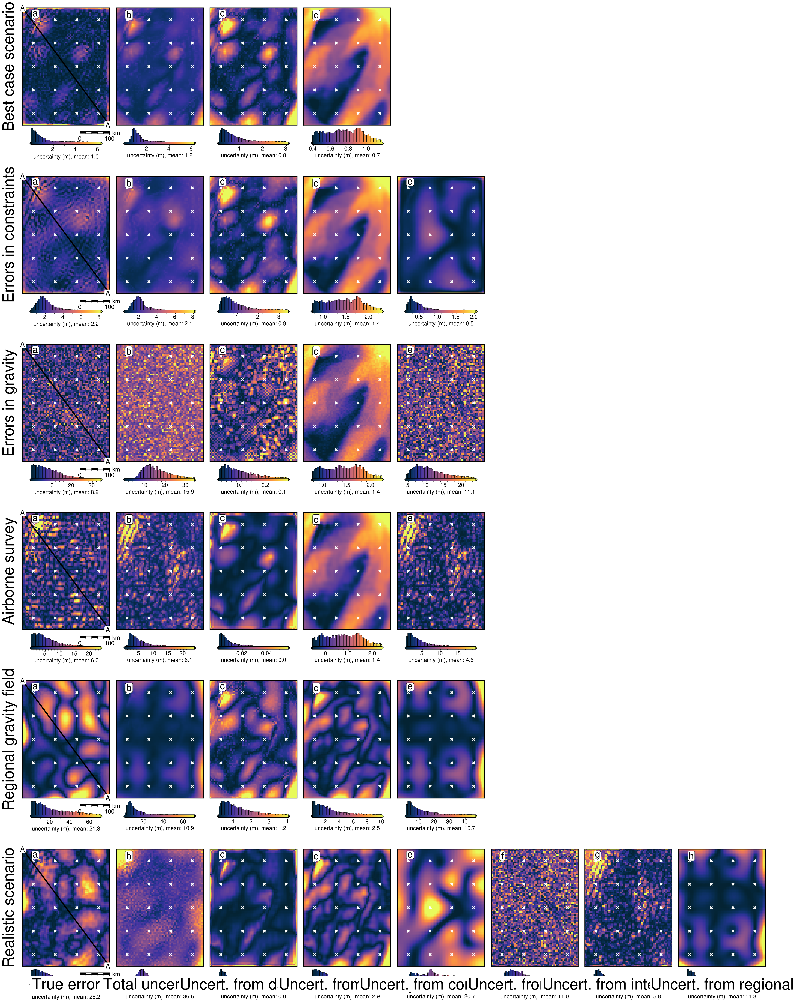

In [ ]:
plots_in_row = []
for i, final_bathymetry in enumerate(final_bathymetries):
    # get data for each test
    sensitivity_ds = sensitivity_results[i]
    # if i == 0:
    #     titles = [
    #         "True error",
    #         "Total uncertainty",
    #     ]
    #     grids=[
    #         np.abs(final_bathymetry - bathymetry),
    #         final_uncertainties[i],
    #     ]
    #     constraint_points = constraint_points_dfs[i]
    #     plots_in_row.append(len(grids))
    if i == 0:
        titles = [
            "True error",
            "Total uncertainty",
            "Uncert. from damping",
            "Uncert. from density",
        ]
        grids = [
            np.abs(final_bathymetry - bathymetry),
            sensitivity_ds.full_stdev,
            sensitivity_ds.damping_stdev,
            sensitivity_ds.density_stdev,
        ]
        constraint_points = constraint_points_dfs[i]
        plots_in_row.append(len(grids))
    elif i == 1:
        titles = [
            "True error",
            "Total uncertainty",
            "Uncert. from damping",
            "Uncert. from density",
            "Uncert. from constraints",
        ]
        grids = [
            np.abs(final_bathymetry - bathymetry),
            sensitivity_ds.full_stdev,
            sensitivity_ds.damping_stdev,
            sensitivity_ds.density_stdev,
            sensitivity_ds.constraints_stdev,
        ]
        constraint_points = constraint_points_dfs[i]
        plots_in_row.append(len(grids))
    elif i == 2:
        titles = [
            "True error",
            "Total uncertainty",
            "Uncert. from damping",
            "Uncert. from density",
            "Uncert. from gravity",
        ]
        grids = [
            np.abs(final_bathymetry - bathymetry),
            sensitivity_ds.full_stdev,
            sensitivity_ds.damping_stdev,
            sensitivity_ds.density_stdev,
            sensitivity_ds.gravity_stdev,
        ]
        constraint_points = constraint_points_dfs[i]
        plots_in_row.append(len(grids))
    elif i == 3:
        titles = [
            "True error",
            "Total uncertainty",
            "Uncert. from damping",
            "Uncert. from density",
            "Uncert. from interpolation",
        ]
        grids = [
            np.abs(final_bathymetry - bathymetry),
            sensitivity_ds.full_stdev,
            sensitivity_ds.damping_stdev,
            sensitivity_ds.density_stdev,
            sensitivity_ds["equivalent source gridding_stdev"],
        ]
        constraint_points = constraint_points_dfs[i]
        plots_in_row.append(len(grids))
    elif i == 4:
        titles = [
            "True error",
            "Total uncertainty",
            "Uncert. from damping",
            "Uncert. from density",
            "Uncert. from regional",
        ]
        grids = [
            np.abs(final_bathymetry - bathymetry),
            sensitivity_ds.full_stdev,
            sensitivity_ds.damping_stdev,
            sensitivity_ds.density_stdev,
            sensitivity_ds.regional_stdev,
        ]
        constraint_points = constraint_points_dfs[i]
        plots_in_row.append(len(grids))
    elif i == 5:
        titles = [
            "True error",
            "Total uncertainty",
            "Uncert. from damping",
            "Uncert. from density",
            "Uncert. from constraints",
            "Uncert. from gravity",
            "Uncert. from interpolation",
            "Uncert. from regional",
        ]
        grids = [
            np.abs(final_bathymetry - bathymetry),
            sensitivity_ds.full_stdev,
            sensitivity_ds.damping_stdev,
            sensitivity_ds.density_stdev,
            sensitivity_ds.constraints_stdev,
            sensitivity_ds.grav_stdev,
            sensitivity_ds["eq_sources_stdev"],
            sensitivity_ds.regional_stdev,
        ]
        constraint_points = constraint_points_dfs[i]
        plots_in_row.append(len(grids))

    # clip each grid to region of interest
    grids = [
        g.sel(
            easting=slice(plot_region[0], plot_region[1]),
            northing=slice(plot_region[2], plot_region[3]),
        )
        for g in grids
    ]

    first_2_lims = polar_utils.get_combined_min_max(grids[0:2], robust=True)
    # cpt_lims = polar_utils.get_min_max(grids[1], robust=True)

    # plot specs
    # origin_shift = "both_shift"
    # scalebar=False
    yshift_amount = -1.005
    xshift_amount = 1
    fig_height = 7

    for x, g in enumerate(grids):
        if x == 0:
            origin_shift = "both_shift"
            xshift_amount = -(plots_in_row[i - 2] - 1) * xshift_amount
            scalebar = True
            if i == 0:
                origin_shift = "initialize"
                fig = None
        else:
            origin_shift = "xshift"
            scalebar = False
            xshift_amount = 1
        if x < 2:  # noqa: SIM108
            cpt_lims = first_2_lims
        else:
            cpt_lims = polar_utils.get_min_max(g, robust=True)

        fig = maps.plot_grd(
            grid=g,
            fig_height=fig_height,
            # title=titles[x],
            # title_font="16p,Helvetica,black",
            cmap="thermal",
            cpt_lims=cpt_lims,
            cbar_label=f"uncertainty (m), mean: {round(np.nanmean(g),1)}",
            cbar_font="18p,Helvetica,black",
            hist=True,
            hist_bin_num=50,
            cbar_yoffset=1,
            fig=fig,
            origin_shift=origin_shift,
            xshift_amount=xshift_amount,
            yshift_amount=yshift_amount,
            scalebar=scalebar,
            scale_length=100,
            scale_position="jBR+o0c/-.6c",
        )
        if constraint_points is not None:
            fig.plot(
                x=constraint_points.easting,
                y=constraint_points.northing,
                style="x.2c",
                fill="white",
                pen="1.5p,white",
            )
        fig.text(
            position="TL",
            text=f"{string.ascii_lowercase[x]}",
            fill="white",
            pen=True,
            font="16p,Helvetica,black",
            offset="j.6/.2",
            clearance="+tO",
            no_clip=True,
        )
        if x == 0:
            # plot profiles location, and endpoints on map
            fig.plot(
                vd.line_coordinates(profile_start, profile_end, size=100),
                pen="2p,black",
            )
            fig.text(
                x=profile_start[0],
                y=profile_start[1],
                text="A",
                fill="white",
                font="12p,Helvetica,black",
                justify="CM",
                clearance="+tO",
                no_clip=True,
            )
            fig.text(
                x=profile_end[0],
                y=profile_end[1],
                text="A' ",
                fill="white",
                font="12p,Helvetica,black",
                justify="CM",
                clearance="+tO",
                no_clip=True,
            )
            # add title to each row
            fig.text(
                x=plot_region[0] - 30e3,
                y=np.mean([plot_region[2], plot_region[3]]),
                justify="BC",
                text=inversion_titles[i],
                fill="white",
                angle=90,
                font="26p,Helvetica,black",
                clearance="+tO",
                no_clip=True,
            )
        if i == len(final_bathymetries) - 1:
            # add title to each column
            fig.text(
                y=plot_region[2] - 40e3,
                x=np.mean([plot_region[0], plot_region[1]]),
                justify="TC",
                text=titles[x],
                fill="white",
                font="26p,Helvetica,black",
                clearance="+tO",
                no_clip=True,
            )

    # if fname is not None:
    # fig.savefig(fname)
fig.show()

In [20]:
hexs = sns.color_palette("tab10").as_hex()[:]
rgbs = [PIL.ImageColor.getrgb(h) for h in hexs]
colors = [f"{r[0]}/{r[1]}/{r[2]}" for r in rgbs]

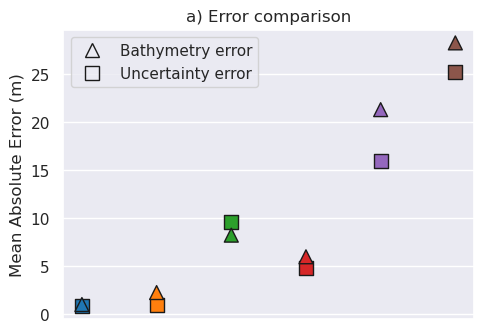

In [21]:
df = pd.DataFrame(
    {
        "inversion_RMSE": inversion_RMSEs,
        "uncertainty_RMSE": uncert_RMSEs,
        "inversion_MAE": inversion_MAEs,
        "uncertainty_MAE": uncert_MAEs,
        "title": inversion_titles,
        "color": sns.color_palette("tab10")[0 : len(inversion_RMSEs)],
    }
)

fig, ax1 = plt.subplots(figsize=(5, 3.5))
# ax2 = ax1.twinx()

ax1.scatter(
    data=df,
    x="title",
    y="uncertainty_MAE",
    color=sns.color_palette("tab10")[0 : len(inversion_RMSEs)],
    marker="s",
    s=100,
    edgecolor="k",
)
ax1.scatter(
    # ax2.scatter(
    data=df,
    x="title",
    y="inversion_MAE",
    color=sns.color_palette("tab10")[0 : len(inversion_RMSEs)],
    marker="^",
    s=100,
    edgecolor="k",
)
# ax1.set_ylabel("■ Uncertainty RMSE (m)")
# ax2.set_ylabel("▲ Bathymetry RMSE (m)")
ax1.set_ylabel("Mean Absolute Error (m)")

# ax1.set_xticks(ax1.get_xticks())
# ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right')
ax1.set_xticks([])
plt.title("a) Error comparison")

inversion_label = mpl.lines.Line2D(
    [0],
    [0],
    label="Bathymetry error",
    marker="^",
    markersize=10,
    markeredgecolor="k",
    markerfacecolor="none",
    linestyle="",
)
uncert_label = mpl.lines.Line2D(
    [0],
    [0],
    label="Uncertainty error",
    marker="s",
    markersize=10,
    markeredgecolor="k",
    markerfacecolor="none",
    linestyle="",
)
plt.legend(handles=[inversion_label, uncert_label])

plt.tight_layout()

plt.savefig("../../paper/figures/inversion_errors.png")
plt.show()

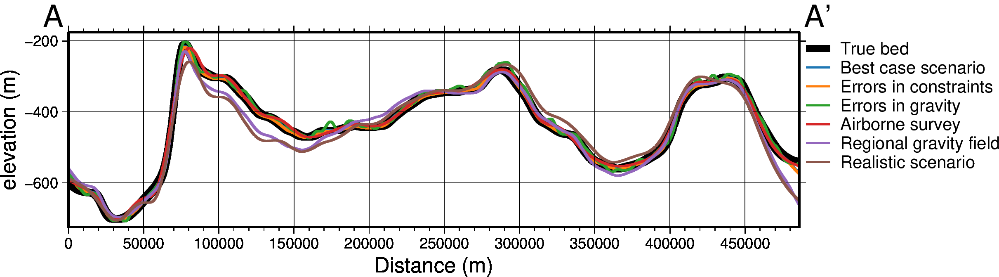

In [22]:
# topography dictionary
topo_names = ["True bed", *inversion_titles]
topo_grids = [bathymetry, *final_bathymetries]

layers_dict = profiles.make_data_dict(
    names=topo_names,
    grids=topo_grids,
    colors=[
        "black",
        *colors,
        # "216/48/52", # red, d83034
        # "0/58/125", # dark blue, 003a7d
        # "78/203/141", # green, 4ecb8d
        # "255/157/58", # orange, ff9d3a
        # "199/1/255", # purple, c701ff
        # "0/141/255", # med blue, 008dff
        # "255/115/182", # pink, ff73b6
        # "249/232/88", # yellow, f9e858
    ],
)

fig, df_layers, df_data = profiles.plot_profile(
    "points",
    start=profile_start,
    stop=profile_end,
    num=100000,
    fig_height=4,
    fig_width=15,
    share_yaxis=True,
    layers_dict=layers_dict,
    layer_buffer=0.05,
    layers_ylims=[-700, -200],
    layers_legend_loc="jTR+jTL+o0c/0c",
    layers_legend_box=None,
    fill_layers=False,
    layers_frame=["neSW", "xafg+lDistance (m)", "yag+lelevation (m)"],
    layers_pen_thickness=[4, *[1.2] * len(inversion_titles)],
    start_label="A",
    end_label="A' ",
    start_end_pen=None,
)
fig.savefig("../../paper/figures/Ross_Sea_inversion_profiles.png", dpi=500)
fig.show()

# Ensemble 1: Constraint spacing vs. regional strength

In [740]:
# ensemble_path = f"../../results/08_constraint_spacing_vs_regional_strength_ensemble_regional_cv"
ensemble_path = (
    "../../results/08_constraint_spacing_vs_regional_strength_ensemble_linear"
)
ensemble_fname = f"{ensemble_path}.csv"

sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.columns

Index(['constraint_numbers', 'regional_strengths', 'constraint_points_fname',
       'constraints_starting_rmse', 'starting_bathymetry_fname',
       'constraint_spacing', 'starting_prisms_fname',
       'starting_bathymetry_damping', 'number_of_constraints',
       'constraints_per_10000sq_km', 'starting_bathymetry_mae',
       'starting_bathymetry_rmse', 'grav_df_fname', 'reg_eqs_damping',
       'reg_eqs_depth', 'reg_eqs_score', 'damping_cv_results_fname',
       'best_damping', 'constraints_rmse', 'inversion_rmse', 'inversion_mae',
       'inverted_bathymetry_fname', 'regional_error', 'regional_rms',
       'topo_improvement_rmse', 'topo_improvement_mae'],
      dtype='object')

In [741]:
sampled_params_df.describe()

,constraint_numbers,regional_strengths,constraints_starting_rmse,constraint_spacing,starting_bathymetry_damping,number_of_constraints,constraints_per_10000sq_km,starting_bathymetry_mae,starting_bathymetry_rmse,reg_eqs_damping,reg_eqs_depth,reg_eqs_score,best_damping,constraints_rmse,inversion_rmse,inversion_mae,regional_error,regional_rms,topo_improvement_rmse,topo_improvement_mae
count,64.000000,64.000000,64.000000,64.000000,6.400000e+01,64.000000,64.000000,64.000000,64.000000,6.400000e+01,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000,64.000000
mean,36.625000,25.000000,33.256243,62.704366,2.505000e-03,36.625000,3.052083,119.012591,165.515040,8.691387e-01,54095.420641,-0.231949,0.029902,43.172094,74.401221,43.829515,3.141236,6.147638,91.113819,75.183077
std,21.803961,16.495722,34.796658,33.311466,4.361450e-03,21.803961,1.816997,152.132373,197.126140,2.423730e+00,66001.342352,3.317809,0.009432,55.151009,77.811141,41.523020,2.861403,4.056389,133.533072,132.158465
min,4.000000,0.000000,0.034142,35.709316,1.000000e-20,4.000000,0.333333,48.522935,76.778412,5.709459e-27,10.000000,-25.818412,0.018439,0.439290,4.255628,1.441081,0.000579,0.000000,-57.388354,-45.136526
25%,19.750000,12.502500,10.876597,40.226401,7.500000e-06,19.750000,1.645833,51.655787,82.884048,6.960965e-18,10.000000,-0.174121,0.024578,14.274747,24.625031,17.824967,1.302738,3.074434,34.762520,22.079159
50%,36.500000,25.000000,22.272540,49.316705,1.000000e-05,36.500000,3.041667,56.620072,90.519520,4.239857e-07,36466.823653,0.268820,0.024763,22.990091,40.757816,26.241473,2.102589,6.147638,53.310072,31.783863
75%,53.250000,37.497500,40.172813,68.850146,2.507500e-03,53.250000,4.437500,84.611885,107.492376,8.145916e-07,77444.267528,0.682907,0.036075,59.772333,91.350524,63.487736,4.381799,9.220842,76.037877,47.461744
max,70.000000,50.000000,96.870107,141.418734,1.000000e-02,70.000000,5.833333,516.567897,682.098767,9.256935e+00,321267.043628,0.874541,0.050287,265.105112,292.922604,184.857585,12.293355,12.295276,450.200441,488.922268


In [742]:
# sampled_params_df["number_of_constraints"] = sampled_params_df.constraint_numbers**2
# vals = sampled_params_df.number_of_constraints.unique()[0:6]
# pd.Series(vals).plot(marker=".")
# vals

In [743]:
# inversion_area = (inversion_region[1]-inversion_region[0])/1e3 * (inversion_region[3]-inversion_region[2])/1e3
# inversion_area

In [744]:
# sampled_params_df["constraints_per_10000sq_km"] = (sampled_params_df.number_of_constraints / inversion_area) * 10e3
sampled_params_df.constraints_per_10000sq_km.unique()

array([0.33333333, 1.08333333, 1.83333333, 2.66666667, 3.41666667,
       4.25      , 5.        , 5.83333333])

In [745]:
sampled_params_df.constraint_numbers.unique()

array([ 4, 13, 22, 32, 41, 51, 60, 70])

In [746]:
sampled_params_df.constraint_spacing.unique()

array([141.41873386,  81.82127027,  64.5264376 ,  53.33304224,
        45.30036752,  40.68992076,  38.83584162,  35.7093163 ])

In [747]:
sampled_params_df.regional_strengths.unique()

array([ 0.  ,  7.14, 14.29, 21.43, 28.57, 35.71, 42.86, 50.  ])

In [748]:
sampled_params_df.regional_rms.unique()

array([ 0.        ,  1.75576546,  3.51398998,  5.26975544,  7.0255209 ,
        8.78128636, 10.53951088, 12.29527634])

In [749]:
# sampled_params_df[sampled_params_df.inversion_rmse == sampled_params_df.inversion_rmse.max()]
# sampled_params_df[sampled_params_df.inversion_rmse == sampled_params_df.inversion_rmse.min()]

In [750]:
# sampled_params_df.sort_values("topo_improvement_mae")

In [751]:
# sampled_params_df.iloc[21]

In [752]:
bathy_lims = polar_utils.get_min_max(bathymetry, robust=False)

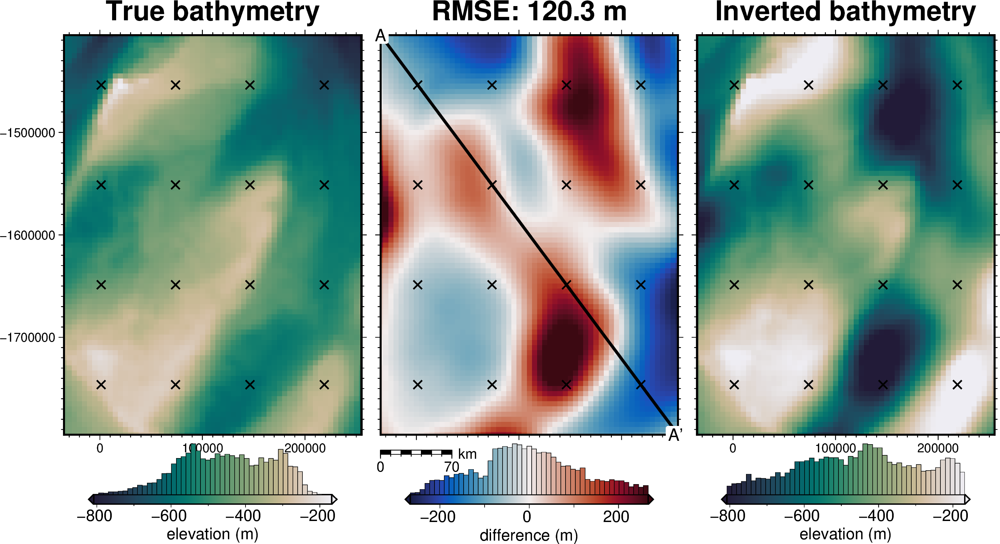

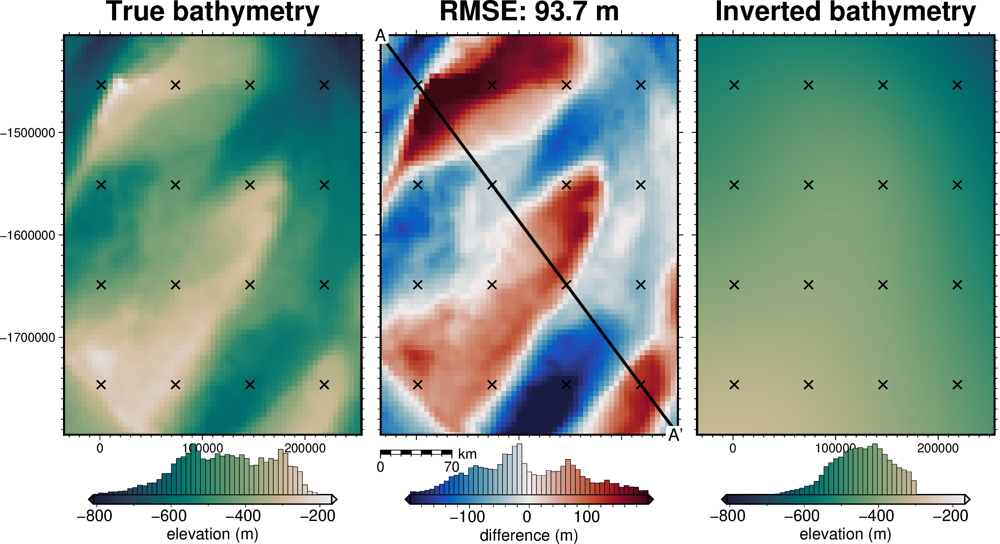

In [81]:
# row = sampled_params_df[
#     (sampled_params_df.constraint_spacing==17.5) &
#     # (sampled_params_df.constraint_spacing<117) &
#     (sampled_params_df.regional_strengths==50)
#     ].iloc[0]
row = sampled_params_df.iloc[21]

starting_bathymetry = xr.load_dataarray(row.starting_bathymetry_fname)
constraint_points = pd.read_csv(row.constraint_points_fname)

with pathlib.Path(f"{row.damping_cv_results_fname}_results.pickle").open("rb") as f:
    results = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results
final_bathymetry = topo_results.set_index(["northing", "easting"]).to_xarray().topo

final_bathymetry = final_bathymetry.sel(
    easting=slice(plot_region[0], plot_region[1]),
    northing=slice(plot_region[2], plot_region[3]),
)
starting_bathymetry = starting_bathymetry.sel(
    easting=slice(plot_region[0], plot_region[1]),
    northing=slice(plot_region[2], plot_region[3]),
)
inverted_bathymetry_plot(
    final_bathymetry,
    constraint_points=constraint_points,
)
inverted_bathymetry_plot(
    starting_bathymetry,
    constraint_points=constraint_points,
)
# grav_df = pd.read_csv(row.grav_df_fname)
# g = grav_df.set_index(["northing", "easting"]).to_xarray()

# dif = (g.basement_grav - g.reg)

# polar_utils.grd_compare(
#     starting_bathymetry,
#     final_bathymetry,
#     region=inversion_region,
#     plot=True,
#     inset=False,
#     points=constraint_points,
#     grid1_name="Starting bathymetry",
# )
# row

(np.float64(-72500.0),
 np.float64(292500.0),
 np.float64(-1832500.0),
 np.float64(-1367500.0))

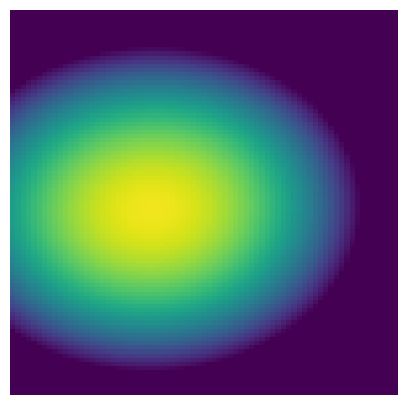

In [149]:
starting_bathymetry_few_constraints = xr.load_dataarray(
    sampled_params_df.iloc[0].starting_bathymetry_fname
)
ax = starting_bathymetry_few_constraints.plot(
    aspect="equal",
    size=5,
    add_colorbar=False,
    vmin=bathy_lims[0],
    vmax=bathy_lims[1],
)
plt.axis("off")

(np.float64(-72500.0),
 np.float64(292500.0),
 np.float64(-1832500.0),
 np.float64(-1367500.0))

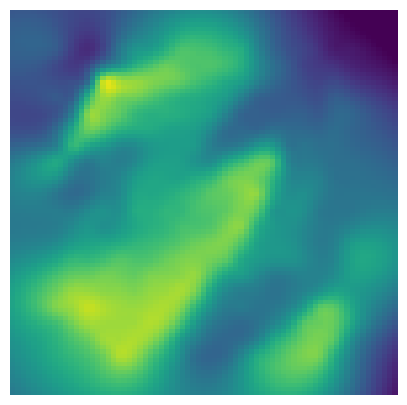

In [150]:
starting_bathymetry_many_constraints = xr.load_dataarray(
    sampled_params_df.iloc[-1].starting_bathymetry_fname
)
starting_bathymetry_many_constraints.plot(
    aspect="equal",
    size=5,
    add_colorbar=False,
    vmin=bathy_lims[0],
    vmax=bathy_lims[1],
)
plt.axis("off")

In [163]:
# fig = plt.figure(constrained_layout=True, figsize=(10, 10))
# gs = fig.add_gridspec(6, 6)

# # main figure
# f_ax5 = fig.add_subplot(gs[:, :])
# f_ax5.set_title('full size')

# f_ax1 = fig.add_subplot(gs[1:5, 1:5])
# f_ax1.set_title('ensemble')

# f_ax2 = fig.add_subplot(gs[-1, -2])
# f_ax2.set_title('few constraints')

# f_ax2 = fig.add_subplot(gs[-1, 1])
# f_ax2.set_title('many constraints')

# f_ax2 = fig.add_subplot(gs[-2, 0])
# f_ax2.set_title('strong regional')

# f_ax2 = fig.add_subplot(gs[1, 0])
# f_ax2.set_title('weak regional')



In [691]:
sampled_params_df.constraint_numbers.unique()

array([ 4, 13, 22, 32, 41, 51, 60, 70])

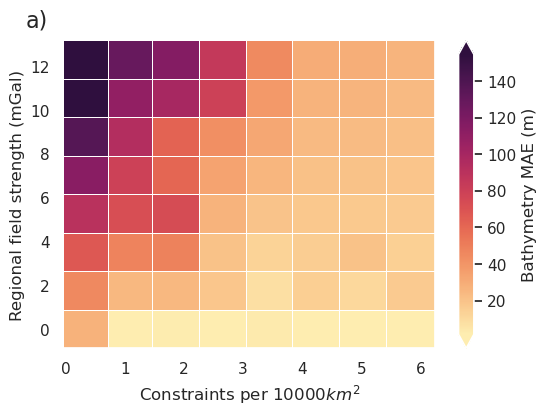

In [711]:
fig = RIS_plotting.plot_2var_ensemble(
    sampled_params_df,
    figsize=(6, 4),
    # x="constraint_spacing",
    # x_title="Constraint spacing (km)",
    # x="number_of_constraints",
    # x_title="Number of constraints",
    x="constraints_per_10000sq_km",
    x_title="Constraints per $10000 km^2$",
    y="regional_rms",
    y_title="Regional field strength (mGal)",
    background="inversion_mae",
    background_title="Bathymetry MAE (m)",
    # plot_title="Constraint spacing vs regional strength",
    background_robust=True,
    # logx=True,
)
ax = fig.get_axes()[0]

# ax.set_xticks(sampled_params_df.constraint_spacing.unique().round(1).astype(int))
# ax.set_xticklabels(sampled_params_df.constraint_spacing.unique().round(1).astype(int))
# ax.set_xticks(sampled_params_df.constraints_per_10000sq_km.unique().round(1))
# ax.set_xticklabels(sampled_params_df.constraints_per_10000sq_km.unique().round(1))
# ax.set_xticks(sampled_params_df.number_of_constraints.unique().round(1))
# ax.set_xticklabels(sampled_params_df.number_of_constraints.unique().round(1))

# grd = sampled_params_df.set_index(["regional_rms", "constraint_spacing"]).to_xarray().inversion_mae
# grd.plot(
#     ax=ax2,
#     cmap="cmo.matter",
#     xincrease=False,
#     alpha=.5,
# )

# ax2 = ax.twiny()
# ax2.set_xscale("log")#, base=np.e)
# ax2.set_xlabel("Constraint spacing (km)")
# ax2.set_xlim(ax.get_xlim())
# # ax2.xaxis.set_major_locator(mpl.ticker.MultipleLocator(base=2))
# ax2.set_xticks(ax.get_xticks())
# # ax2.set_xticklabels([f"{int(x)}" for x in ax2.get_xticks()])
# ax2.set_xticklabels(sampled_params_df.constraint_spacing.unique().round(0).astype(int))
# ax2.set_xticks(ax.get_xticks())
# ax2.set_xticks(sampled_params_df.constraints_per_10000sq_km.unique())
# ax2.set_xticklabels(list(1*len(sampled_params_df.constraint_spacing.unique())))

# ax2.get_xaxis().set_major_formatter(
#     mpl.ticker.FuncFormatter(lambda x, p: format(round(x,1))))

# ax1.xaxis.set_ticks_position('bottom')
# ax1.spines.bottom.set_position(('axes', -80))
# ax1.set_xticks(ax.get_xticks())
# ax1.set_xticklabels(sampled_params_df.constraint_spacing.unique())

bbox = dict(facecolor="lightgray", boxstyle="round")
# plt.gcf().text(0.3, -.05, "many constraints", fontsize=12, va="center", ha="right", bbox=bbox)
# plt.gcf().text(0.6, -.05, "few constraints", fontsize=12, va="center", ha="left", bbox=bbox)
plt.gcf().text(0.1, 0.9, "a)", fontsize=16, va="bottom", ha="right")

plt.savefig("../../paper/figures/ensemble_1_bathy_error_2var.png", bbox_inches="tight")

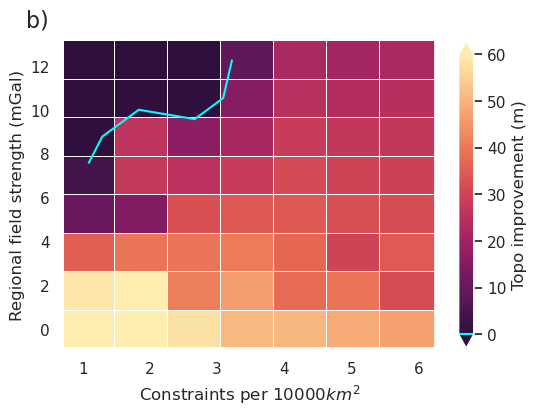

In [721]:
fig = RIS_plotting.plot_2var_ensemble(
    sampled_params_df[sampled_params_df.constraint_numbers > 4],
    figsize=(6, 4),
    # x="constraint_spacing",
    # x_title="Constraint spacing (km)",
    # x="number_of_constraints",
    # x_title="Number of constraints",
    x="constraints_per_10000sq_km",
    x_title="Constraints per $10000 km^2$",
    y="regional_rms",
    y_title="Regional field strength (mGal)",
    background="topo_improvement_mae",
    background_title="Topo improvement (m)",
    background_cmap="cmo.matter_r",
    background_robust=True,
    background_cpt_lims=(
        0,
        60,
        # polar_utils.get_min_max(sampled_params_df.topo_improvement_mae, robust=True)[1],
    ),
    plot_contours=[0],
    contour_color="cyan",
    # plot_title="Constraint spacing vs regional strength",
    # logx=True,
)
ax = fig.get_axes()[0]
# ax.set_xticks(sampled_params_df.constraints_per_10000sq_km.unique())
# ax.get_xaxis().set_major_formatter(
#     mpl.ticker.FuncFormatter(lambda x, p: format(round(x,1))))

bbox = dict(facecolor="lightgray", boxstyle="round")
# plt.gcf().text(0.3, -.05, "many constraints", fontsize=12, va="center", ha="right", bbox=bbox)
# plt.gcf().text(0.6, -.05, "few constraints", fontsize=12, va="center", ha="left", bbox=bbox)
plt.gcf().text(0.1, 0.9, "b)", fontsize=16, va="bottom", ha="right")

plt.savefig(
    "../../paper/figures/ensemble_1_topo_improvement_2var.png", bbox_inches="tight"
)

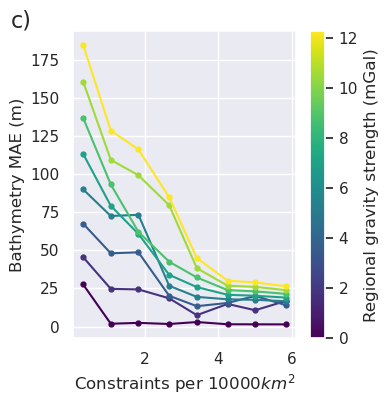

In [715]:
fig = RIS_plotting.plot_ensemble_as_lines(
    sampled_params_df,
    figsize=(4, 4),
    # x="constraint_spacing",
    # x_label="Constraint spacing (km)",
    x="constraints_per_10000sq_km",
    x_label="Constraints per $10000 km^2$",
    # x="number_of_constraints",
    # x_label="Number of constraints",
    y="inversion_mae",
    y_label="Bathymetry MAE (m)",
    groupby_col="regional_rms",
    cbar_label="Regional gravity strength (mGal)",
    # trend_line=True,
    # horizontal_line=starting_bathymetry_rmse,
    # horizontal_line_label="Starting RMSE",
    slope_min_max=True,
    slope_mean=True,
)
plt.gcf().text(0.1, 0.95, "c)", fontsize=16, va="bottom", ha="right")
plt.savefig(
    "../../paper/figures/ensemble_1_bathy_error_vs_constraint_spacing.png",
    bbox_inches="tight",
)

In [716]:
# fig = RIS_plotting.plot_ensemble_as_lines(
#     sampled_params_df,
#     figsize = (8,4),

#     # x="constraint_spacing",
#     # x_label="Constraint spacing (km)",

#     x="constraints_per_10000sq_km",
#     x_label="Constraints per $10000 km^2$",

#     # x="number_of_constraints",
#     # x_label="Number of constraints",

#     y="inversion_mae",
#     y_label="Bathymetry MAE (m)",

#     groupby_col="regional_rms",
#     cbar_label="Regional gravity strength (mGal)",
#     # trend_line=True,
#     # horizontal_line=starting_bathymetry_rmse,
#     # horizontal_line_label="Starting RMSE",
#     # slope_min_max=True,
#     # slope_mean=True,
# )
# plt.gcf().text(0.1, .95, "g)", fontsize=16, va="bottom", ha="right")
# plt.savefig('../../paper/figures/ensemble_1_bathy_error_vs_constraint_density.png', bbox_inches='tight')

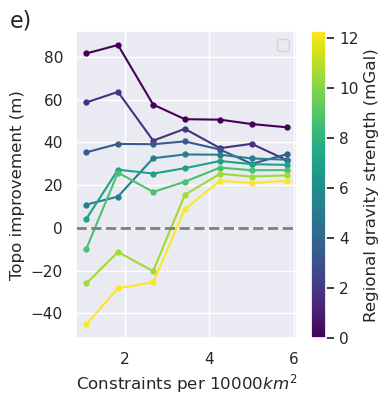

In [758]:
fig = RIS_plotting.plot_ensemble_as_lines(
    sampled_params_df[sampled_params_df.constraint_numbers > 4],
    figsize=(4, 4),
    # x="constraint_spacing",
    # x_label="Constraint spacing (km)",
    x="constraints_per_10000sq_km",
    x_label="Constraints per $10000 km^2$",
    y="topo_improvement_mae",
    y_label="Topo improvement (m)",
    groupby_col="regional_rms",
    cbar_label="Regional gravity strength (mGal)",
    # trend_line=True,
    horizontal_line=0,
    # horizontal_line_label="Starting RMSE",
    # horizontal_line_color="cyan",
    slope_min_max=True,
    slope_mean=True,
    # logx=True,
)
plt.gcf().text(0.1, 0.95, "e)", fontsize=16, va="bottom", ha="right")
plt.savefig(
    "../../paper/figures/ensemble_1_topo_improvement_vs_constraint_spacing.png",
    bbox_inches="tight",
)

In [723]:
# fig = RIS_plotting.plot_ensemble_as_lines(
#     sampled_params_df[sampled_params_df.constraint_numbers>4],
#     figsize = (8,4),

#     # x="constraint_spacing",
#     # x_label="Constraint spacing (km)",

#     x="constraints_per_10000sq_km",
#     x_label="Constraints per $10000 km^2$",

#     y="topo_improvement_mae",
#     y_label="Topo improvement (m)",

#     groupby_col="regional_rms",
#     cbar_label="Regional gravity strength (mGal)",
#     # trend_line=True,
#     # horizontal_line=0,
#     # horizontal_line_label="Starting RMSE",
#     # slope_min_max=True,
#     # slope_mean=True,
#     # logx=True,
# )
# plt.gcf().text(0.1, .95, "h)", fontsize=16, va="bottom", ha="right")
# plt.savefig('../../paper/figures/ensemble_1_topo_improvement_vs_constraint_density.png', bbox_inches='tight')

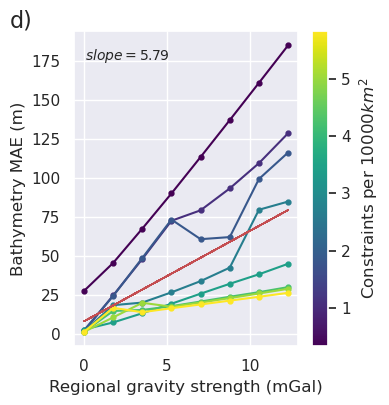

In [728]:
fig = RIS_plotting.plot_ensemble_as_lines(
    sampled_params_df,
    figsize=(4, 4),
    x="regional_rms",
    x_label="Regional gravity strength (mGal)",
    y="inversion_mae",
    y_label="Bathymetry MAE (m)",
    # groupby_col="constraint_spacing",
    # cbar_label="Constraint spacing (km)",
    groupby_col="constraints_per_10000sq_km",
    cbar_label="Constraints per $10000 km^2$",
    trend_line=True,
    # horizontal_line=starting_bathymetry_rmse,
    # horizontal_line_label="Starting RMSE",
    # slope_min_max=True,
    # slope_mean=True,
)
plt.gcf().text(0.1, 0.95, "d)", fontsize=16, va="bottom", ha="right")
plt.savefig(
    "../../paper/figures/ensemble_1_bathy_error_vs_regional_strength.png",
    bbox_inches="tight",
)

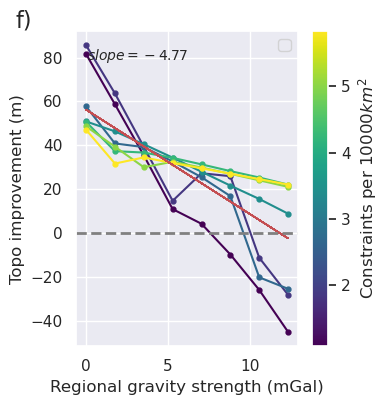

In [757]:
fig = RIS_plotting.plot_ensemble_as_lines(
    sampled_params_df[sampled_params_df.constraint_numbers > 4],
    figsize=(4, 4),
    x="regional_rms",
    x_label="Regional gravity strength (mGal)",
    y="topo_improvement_mae",
    y_label="Topo improvement (m)",
    # groupby_col="constraint_spacing",
    # cbar_label="Constraint spacing (km)",
    groupby_col="constraints_per_10000sq_km",
    cbar_label="Constraints per $10000 km^2$",
    trend_line=True,
    horizontal_line=0,
    # horizontal_line_label="Starting RMSE",
    # horizontal_line_color="cyan",
    # slope_min_max=True,
    # slope_mean=True,
)
plt.gcf().text(0.1, 0.95, "f)", fontsize=16, va="bottom", ha="right")
plt.savefig(
    "../../paper/figures/ensemble_1_topo_improvement_vs_regional_strength.png",
    bbox_inches="tight",
)

# Ensemble 2: Grav spacing vs noise, no regional

In [734]:
line_plot_ylims = [5, 200]
# cpt_lims = [15, 170]
cpt_lims = None
figsize = (5, 3.5)

In [735]:
ensemble_path = "../../results/09_grav_spacing_vs_noise_ensemble_no_regional"
ensemble_fname = f"{ensemble_path}.csv"

sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.columns

Index(['grav_line_numbers', 'grav_noise_levels', 'grav_df_fname',
       'grav_survey_df_fname', 'grav_line_spacing', 'grav_eqs_damping',
       'grav_eqs_depth', 'grav_eqs_score', 'damping_cv_results_fname',
       'best_damping', 'inversion_rmse', 'inverted_bathymetry_fname',
       'regional_error', 'regional_rms', 'topo_improvement', 'inversion_mae',
       'topo_improvement_rmse', 'topo_improvement_mae'],
      dtype='object')

In [736]:
sampled_params_df["flight_kms"] = pd.Series()
for i, row in sampled_params_df.iterrows():
    survey_df = pd.read_csv(row.grav_survey_df_fname)
    sampled_params_df.loc[i, "flight_kms"] = len(survey_df)
sampled_params_df.flight_kms.unique()
inversion_area = (
    (inversion_region[1] - inversion_region[0])
    / 1e3
    * (inversion_region[3] - inversion_region[2])
    / 1e3
)
inversion_area
sampled_params_df["flight_kms_per_10000sq_km"] = (
    (sampled_params_df.flight_kms / inversion_area) * 10e3
).astype(float)
sampled_params_df.flight_kms_per_10000sq_km.unique()

array([ 175.        ,  233.33333333,  350.        ,  466.66666667,
        641.66666667,  933.33333333, 1283.33333333, 1750.        ])

array([ 3,  4,  6,  8, 11, 16, 22, 30])

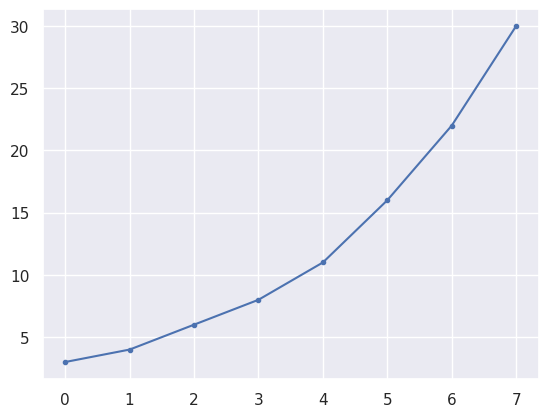

In [674]:
vals = sampled_params_df.grav_line_numbers.unique()
pd.Series(vals).plot(marker=".")
vals

array([116.66666667,  87.5       ,  58.33333333,  43.75      ,
        31.81818182,  21.875     ,  15.90909091,  11.66666667])

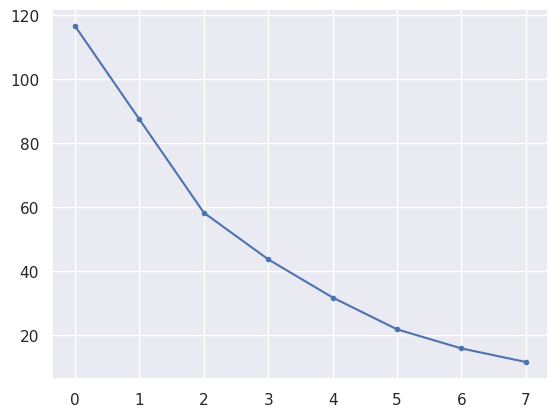

In [675]:
vals = sampled_params_df.grav_line_spacing.unique()
pd.Series(vals).plot(marker=".")
vals

array([2100, 2800, 4200, 5600, 7700, 11200, 15400, 21000], dtype=object)

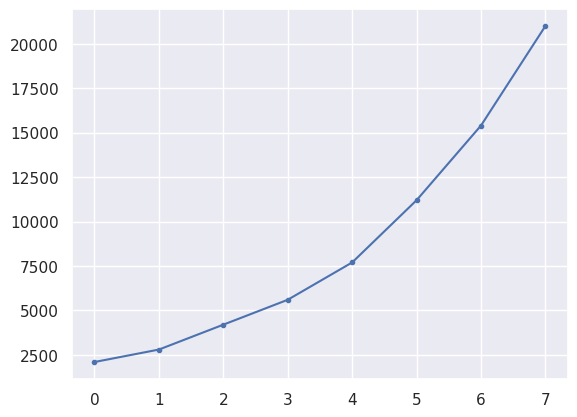

In [676]:
vals = sampled_params_df.flight_kms.unique()
pd.Series(vals).plot(marker=".")
vals

array([ 175.        ,  233.33333333,  350.        ,  466.66666667,
        641.66666667,  933.33333333, 1283.33333333, 1750.        ])

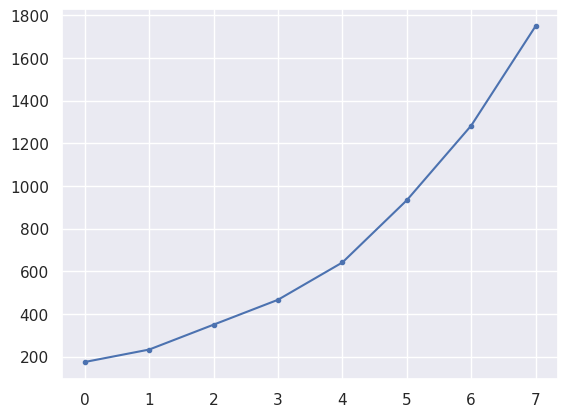

In [677]:
vals = sampled_params_df.flight_kms_per_10000sq_km.unique()
pd.Series(vals).plot(marker=".")
vals

In [314]:
# sampled_params_df[np.abs(sampled_params_df.topo_improvement_mae)<20].sort_values("topo_improvement_mae")

In [315]:
# sampled_params_df.iloc[20]

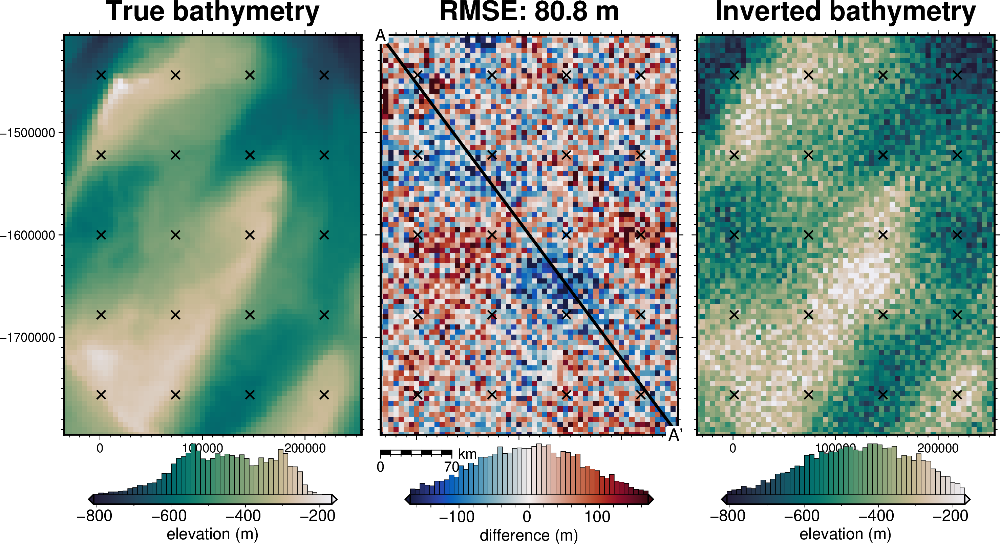

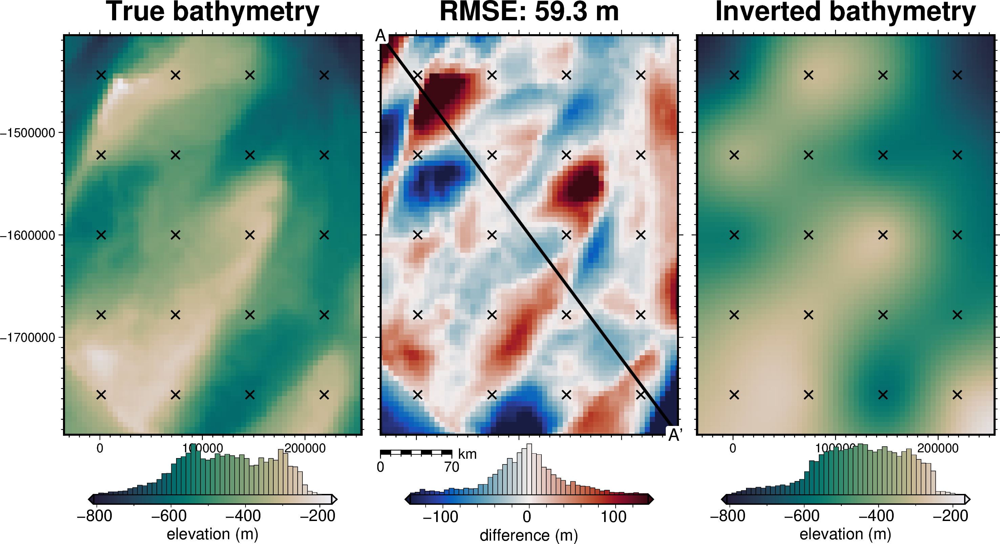

In [96]:
row = sampled_params_df.iloc[19]

inversion_results = best_results[0]
starting_bathymetry = (
    inversion_results[0].set_index(["northing", "easting"]).to_xarray().starting_topo
)
constraint_points = pd.read_csv("../../results/Ross_Sea_02_constraint_points.csv")

with pathlib.Path(f"{row.damping_cv_results_fname}_results.pickle").open("rb") as f:
    results = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results
final_bathymetry = topo_results.set_index(["northing", "easting"]).to_xarray().topo

final_bathymetry = final_bathymetry.sel(
    easting=slice(plot_region[0], plot_region[1]),
    northing=slice(plot_region[2], plot_region[3]),
)
starting_bathymetry = starting_bathymetry.sel(
    easting=slice(plot_region[0], plot_region[1]),
    northing=slice(plot_region[2], plot_region[3]),
)
inverted_bathymetry_plot(
    final_bathymetry,
    constraint_points=constraint_points,
)
inverted_bathymetry_plot(
    starting_bathymetry,
    constraint_points=constraint_points,
)

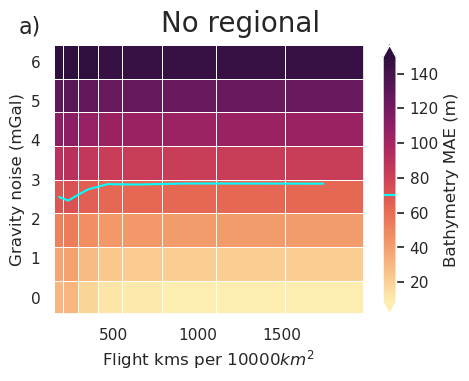

In [586]:
fig = RIS_plotting.plot_2var_ensemble(
    sampled_params_df,
    figsize=figsize,
    # x="grav_line_spacing",
    # x_title="Line spacing (km)",
    x="flight_kms_per_10000sq_km",
    x_title="Flight kms per $10000 km^2$",
    y="grav_noise_levels",
    y_title="Gravity noise (mGal)",
    background="inversion_mae",
    background_title="Bathymetry MAE (m)",
    background_robust=True,
    plot_contours=[70],
    contour_color="cyan",
    background_cpt_lims=cpt_lims,
    # flipx=True,
)
bbox = dict(facecolor="lightgray", boxstyle="round")
# plt.gcf().text(0.25, -.05, "many lines", fontsize=12, va="center", ha="right", bbox=bbox)
# plt.gcf().text(0.6, -.05, "few lines", fontsize=12, va="center", ha="left", bbox=bbox)
plt.gcf().text(0.1, 0.9, "a)", fontsize=16, va="bottom", ha="right")

plt.gcf().text(0.5, 0.9, "No regional", fontsize=20, va="bottom", ha="center")

plt.savefig("../../paper/figures/ensemble_2_2var.png", bbox_inches="tight")

In [198]:
# fig = RIS_plotting.plot_2var_ensemble(
#     sampled_params_df,
#     figsize = (6,4),
#     x="grav_line_spacing",
#     y="grav_noise_levels",
#     x_title="Line spacing (km)",
#     y_title="Gravity noise (mGal)",

#     background="topo_improvement_mae",
#     background_title="Topo improvement (m)",

#     background_robust=True,
#     background_cmap="cmo.matter_r",
#     plot_contours=[0],
#     contour_color="cyan",
# )
# bbox = dict(facecolor='lightgray', boxstyle="round")
# plt.gcf().text(0.3, -.05, "many lines", fontsize=12, va="center", ha="right", bbox=bbox)
# plt.gcf().text(0.6, -.05, "few lines", fontsize=12, va="center", ha="left", bbox=bbox)

# plt.savefig('../../paper/figures/ensemble_2_no_regional_2var.png')

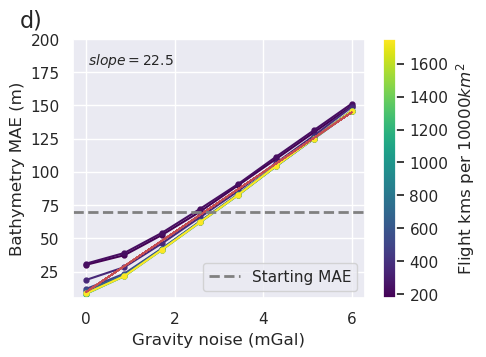

In [587]:
RIS_plotting.plot_ensemble_as_lines(
    sampled_params_df,
    figsize=figsize,
    x="grav_noise_levels",
    x_label="Gravity noise (mGal)",
    y="inversion_mae",
    y_label="Bathymetry MAE (m)",
    # groupby_col="grav_line_spacing",
    # cbar_label="Line spacing (km)",
    groupby_col="flight_kms_per_10000sq_km",
    cbar_label="Flight kms per $10000 km^2$",
    trend_line=True,
    horizontal_line=70,
    horizontal_line_label="Starting MAE",
    horizontal_line_label_loc="lower right",
    y_lims=line_plot_ylims,
)
plt.gcf().text(0.1, 0.95, "d)", fontsize=16, va="bottom", ha="right")
plt.savefig(
    "../../paper/figures/ensemble_2_bathy_error_vs_grav_noise.png", bbox_inches="tight"
)

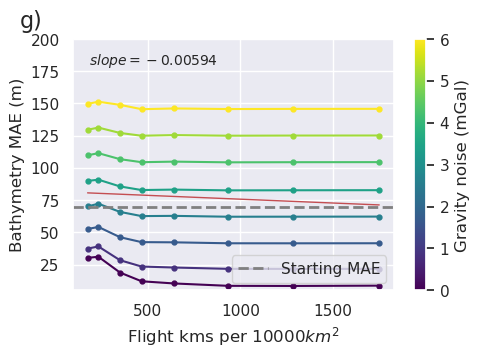

In [588]:
RIS_plotting.plot_ensemble_as_lines(
    sampled_params_df,
    figsize=figsize,
    # x="grav_line_spacing",
    # x_label="Line spacing (km)",
    x="flight_kms_per_10000sq_km",
    x_label="Flight kms per $10000 km^2$",
    y="inversion_mae",
    y_label="Bathymetry MAE (m)",
    groupby_col="grav_noise_levels",
    cbar_label="Gravity noise (mGal)",
    trend_line=True,
    horizontal_line=70,
    horizontal_line_label="Starting MAE",
    horizontal_line_label_loc="lower right",
    y_lims=line_plot_ylims,
)
plt.gcf().text(0.1, 0.95, "g)", fontsize=16, va="bottom", ha="right")
plt.savefig(
    "../../paper/figures/ensemble_2_bathy_error_vs_grav_spacing.png",
    bbox_inches="tight",
)

# Ensemble 3: Grav spacing vs. noise, strong regional

In [589]:
ensemble_path = "../../results/10_grav_spacing_vs_noise_ensemble_strong_regional"
ensemble_fname = f"{ensemble_path}.csv"

sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.columns

Index(['grav_line_numbers', 'grav_noise_levels', 'grav_df_fname',
       'grav_survey_df_fname', 'grav_line_spacing', 'grav_eqs_damping',
       'grav_eqs_depth', 'grav_eqs_score', 'reg_eqs_damping', 'reg_eqs_depth',
       'reg_eqs_score', 'damping_cv_results_fname', 'best_damping',
       'constraints_damping_cv_rmse', 'inversion_rmse',
       'inverted_bathymetry_fname', 'regional_error', 'regional_rms',
       'topo_improvement', 'inversion_mae', 'topo_improvement_rmse',
       'topo_improvement_mae'],
      dtype='object')

In [590]:
sampled_params_df["flight_kms"] = pd.Series()
for i, row in sampled_params_df.iterrows():
    survey_df = pd.read_csv(row.grav_survey_df_fname)
    sampled_params_df.loc[i, "flight_kms"] = len(survey_df)
sampled_params_df.flight_kms.unique()

array([2100, 2800, 4200, 5600, 7700, 11200, 15400, 21000], dtype=object)

In [591]:
inversion_area = (
    (inversion_region[1] - inversion_region[0])
    / 1e3
    * (inversion_region[3] - inversion_region[2])
    / 1e3
)
inversion_area

120000.0

In [592]:
sampled_params_df["flight_kms_per_10000sq_km"] = (
    (sampled_params_df.flight_kms / inversion_area) * 10e3
).astype(float)
sampled_params_df.flight_kms_per_10000sq_km.unique()

array([ 175.        ,  233.33333333,  350.        ,  466.66666667,
        641.66666667,  933.33333333, 1283.33333333, 1750.        ])

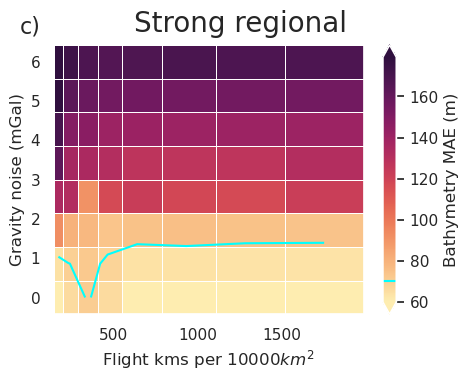

In [593]:
fig = RIS_plotting.plot_2var_ensemble(
    sampled_params_df,
    figsize=figsize,
    # x="grav_line_spacing",
    # x_title="Line spacing (km)",
    x="flight_kms_per_10000sq_km",
    x_title="Flight kms per $10000 km^2$",
    y="grav_noise_levels",
    y_title="Gravity noise (mGal)",
    background="inversion_mae",
    background_title="Bathymetry MAE (m)",
    background_robust=True,
    plot_contours=[70],
    contour_color="cyan",
    background_cpt_lims=cpt_lims,
    # flipx=True,
)
bbox = dict(facecolor="lightgray", boxstyle="round")
# plt.gcf().text(0.25, -.05, "many lines", fontsize=12, va="center", ha="right", bbox=bbox)
# plt.gcf().text(0.6, -.05, "few lines", fontsize=12, va="center", ha="left", bbox=bbox)
plt.gcf().text(0.1, 0.9, "c)", fontsize=16, va="bottom", ha="right")

plt.gcf().text(0.5, 0.9, "Strong regional", fontsize=20, va="bottom", ha="center")

plt.savefig("../../paper/figures/ensemble_3_2var.png", bbox_inches="tight")

In [203]:
# fig = RIS_plotting.plot_2var_ensemble(
#     sampled_params_df,
#     figsize = (6,4),
#     x="grav_line_spacing",
#     y="grav_noise_levels",
#     x_title="Line spacing (km)",
#     y_title="Gravity noise (mGal)",

#     background="topo_improvement_mae",
#     background_title="Topo improvement (m)",

#     background_robust=True,
#     background_cmap="cmo.matter_r",
#     plot_contours=[0],
#     contour_color="cyan",
# )
# bbox = dict(facecolor='lightgray', boxstyle="round")
# plt.gcf().text(0.3, -.05, "many lines", fontsize=12, va="center", ha="right", bbox=bbox)
# plt.gcf().text(0.6, -.05, "few lines", fontsize=12, va="center", ha="left", bbox=bbox)

# plt.savefig('../../paper/figures/ensemble_3_strong_regional_2var.png')

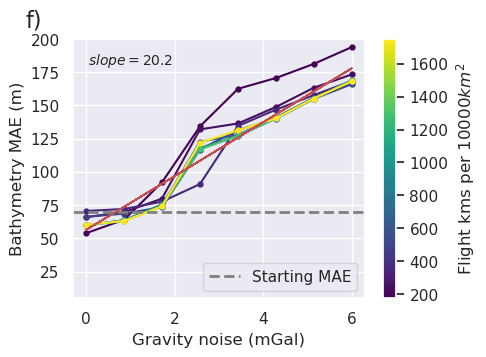

In [594]:
RIS_plotting.plot_ensemble_as_lines(
    sampled_params_df,
    figsize=figsize,
    x="grav_noise_levels",
    x_label="Gravity noise (mGal)",
    y="inversion_mae",
    y_label="Bathymetry MAE (m)",
    # groupby_col="grav_line_spacing",
    # cbar_label="Line spacing (km)",
    groupby_col="flight_kms_per_10000sq_km",
    cbar_label="Flight kms per $10000 km^2$",
    trend_line=True,
    horizontal_line=70,
    horizontal_line_label="Starting MAE",
    horizontal_line_label_loc="lower right",
    y_lims=line_plot_ylims,
)
plt.gcf().text(0.1, 0.95, "f)", fontsize=16, va="bottom", ha="right")
plt.savefig(
    "../../paper/figures/ensemble_3_bathy_error_vs_grav_noise.png", bbox_inches="tight"
)

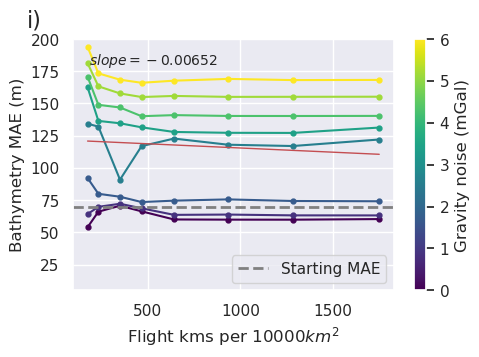

In [595]:
RIS_plotting.plot_ensemble_as_lines(
    sampled_params_df,
    figsize=figsize,
    # x="grav_line_spacing",
    # x_label="Line spacing (km)",
    x="flight_kms_per_10000sq_km",
    x_label="Flight kms per $10000 km^2$",
    y="inversion_mae",
    y_label="Bathymetry MAE (m)",
    groupby_col="grav_noise_levels",
    cbar_label="Gravity noise (mGal)",
    trend_line=True,
    horizontal_line=70,
    horizontal_line_label="Starting MAE",
    horizontal_line_label_loc="lower right",
    y_lims=line_plot_ylims,
)
plt.gcf().text(0.1, 0.95, "i)", fontsize=16, va="bottom", ha="right")
plt.savefig(
    "../../paper/figures/ensemble_3_bathy_error_vs_grav_spacing.png",
    bbox_inches="tight",
)

# Ensemble 4: Grav spacing vs. noise, medium regional

In [596]:
ensemble_path = "../../results/11_grav_spacing_vs_noise_ensemble_medium_regional"
ensemble_fname = f"{ensemble_path}.csv"

sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.columns

Index(['grav_line_numbers', 'grav_noise_levels', 'grav_df_fname',
       'grav_survey_df_fname', 'grav_line_spacing', 'grav_eqs_damping',
       'grav_eqs_depth', 'grav_eqs_score', 'reg_eqs_damping', 'reg_eqs_depth',
       'reg_eqs_score', 'damping_cv_results_fname', 'best_damping',
       'constraints_damping_cv_rmse', 'inversion_rmse',
       'inverted_bathymetry_fname', 'regional_error', 'regional_rms',
       'topo_improvement', 'inversion_mae', 'topo_improvement_rmse',
       'topo_improvement_mae'],
      dtype='object')

In [597]:
sampled_params_df["flight_kms"] = pd.Series()
for i, row in sampled_params_df.iterrows():
    survey_df = pd.read_csv(row.grav_survey_df_fname)
    sampled_params_df.loc[i, "flight_kms"] = len(survey_df)
sampled_params_df.flight_kms.unique()

array([2100, 2800, 4200, 5600, 7700, 11200, 15400, 21000], dtype=object)

In [598]:
inversion_area = (
    (inversion_region[1] - inversion_region[0])
    / 1e3
    * (inversion_region[3] - inversion_region[2])
    / 1e3
)
inversion_area

120000.0

In [599]:
sampled_params_df["flight_kms_per_10000sq_km"] = (
    (sampled_params_df.flight_kms / inversion_area) * 10e3
).astype(float)
sampled_params_df.flight_kms_per_10000sq_km.unique()

array([ 175.        ,  233.33333333,  350.        ,  466.66666667,
        641.66666667,  933.33333333, 1283.33333333, 1750.        ])

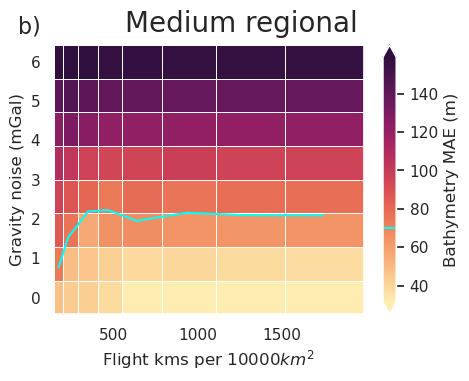

In [600]:
fig = RIS_plotting.plot_2var_ensemble(
    sampled_params_df,
    figsize=figsize,
    # x="grav_line_spacing",
    # x_title="Line spacing (km)",
    x="flight_kms_per_10000sq_km",
    x_title="Flight kms per $10000 km^2$",
    y="grav_noise_levels",
    y_title="Gravity noise (mGal)",
    background="inversion_mae",
    background_title="Bathymetry MAE (m)",
    background_robust=True,
    plot_contours=[70],
    contour_color="cyan",
    background_cpt_lims=cpt_lims,
    # flipx=True,
)
bbox = dict(facecolor="lightgray", boxstyle="round")
# plt.gcf().text(0.25, -.05, "many lines", fontsize=12, va="center", ha="right", bbox=bbox)
# plt.gcf().text(0.6, -.05, "few lines", fontsize=12, va="center", ha="left", bbox=bbox)
plt.gcf().text(0.1, 0.9, "b)", fontsize=16, va="bottom", ha="right")

plt.gcf().text(0.5, 0.9, "Medium regional", fontsize=20, va="bottom", ha="center")

plt.savefig("../../paper/figures/ensemble_4_2var.png", bbox_inches="tight")

In [208]:
# fig = RIS_plotting.plot_2var_ensemble(
#     sampled_params_df,
#     figsize = (6,4),
#     x="grav_line_spacing",
#     y="grav_noise_levels",
#     x_title="Line spacing (km)",
#     y_title="Gravity noise (mGal)",

#     background="topo_improvement_mae",
#     background_title="Topo improvement (m)",

#     background_robust=True,
#     background_cmap="cmo.matter_r",
#     plot_contours=[0],
#     contour_color="cyan",
# )
# bbox = dict(facecolor='lightgray', boxstyle="round")
# plt.gcf().text(0.3, -.05, "many lines", fontsize=12, va="center", ha="right", bbox=bbox)
# plt.gcf().text(0.6, -.05, "few lines", fontsize=12, va="center", ha="left", bbox=bbox)

# plt.savefig('../../paper/figures/ensemble_4_medium_regional_2var.png')

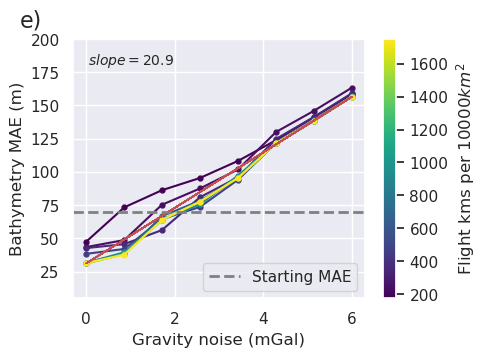

In [601]:
RIS_plotting.plot_ensemble_as_lines(
    sampled_params_df,
    figsize=figsize,
    x="grav_noise_levels",
    x_label="Gravity noise (mGal)",
    y="inversion_mae",
    y_label="Bathymetry MAE (m)",
    # groupby_col="grav_line_spacing",
    # cbar_label="Line spacing (km)",
    groupby_col="flight_kms_per_10000sq_km",
    cbar_label="Flight kms per $10000 km^2$",
    trend_line=True,
    horizontal_line=70,
    horizontal_line_label="Starting MAE",
    horizontal_line_label_loc="lower right",
    y_lims=line_plot_ylims,
)
plt.gcf().text(0.1, 0.95, "e)", fontsize=16, va="bottom", ha="right")
plt.savefig(
    "../../paper/figures/ensemble_4_bathy_error_vs_grav_noise.png", bbox_inches="tight"
)

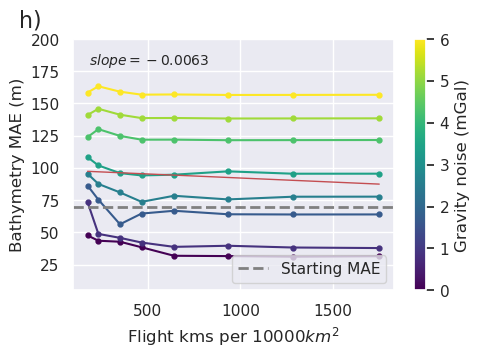

In [602]:
RIS_plotting.plot_ensemble_as_lines(
    sampled_params_df,
    # x="grav_line_spacing",
    # x_label="Line spacing (km)",
    x="flight_kms_per_10000sq_km",
    x_label="Flight kms per $10000 km^2$",
    y="inversion_mae",
    y_label="Bathymetry MAE (m)",
    groupby_col="grav_noise_levels",
    cbar_label="Gravity noise (mGal)",
    trend_line=True,
    horizontal_line=70,
    horizontal_line_label="Starting MAE",
    horizontal_line_label_loc="lower right",
    y_lims=line_plot_ylims,
)
plt.gcf().text(0.1, 0.95, "h)", fontsize=16, va="bottom", ha="right")
plt.savefig(
    "../../paper/figures/ensemble_4_bathy_error_vs_grav_spacing.png",
    bbox_inches="tight",
)

# 5 m of inversion improvement

In [122]:
width = (inversion_region[1] - inversion_region[0]) / 1e3
height = (inversion_region[3] - inversion_region[2]) / 1e3
width, height

(300.0, 400.0)

In [678]:
inversion_area

120000.0

In [124]:
line_spacing = 85
width / line_spacing, height / line_spacing

(3.5294117647058822, 4.705882352941177)

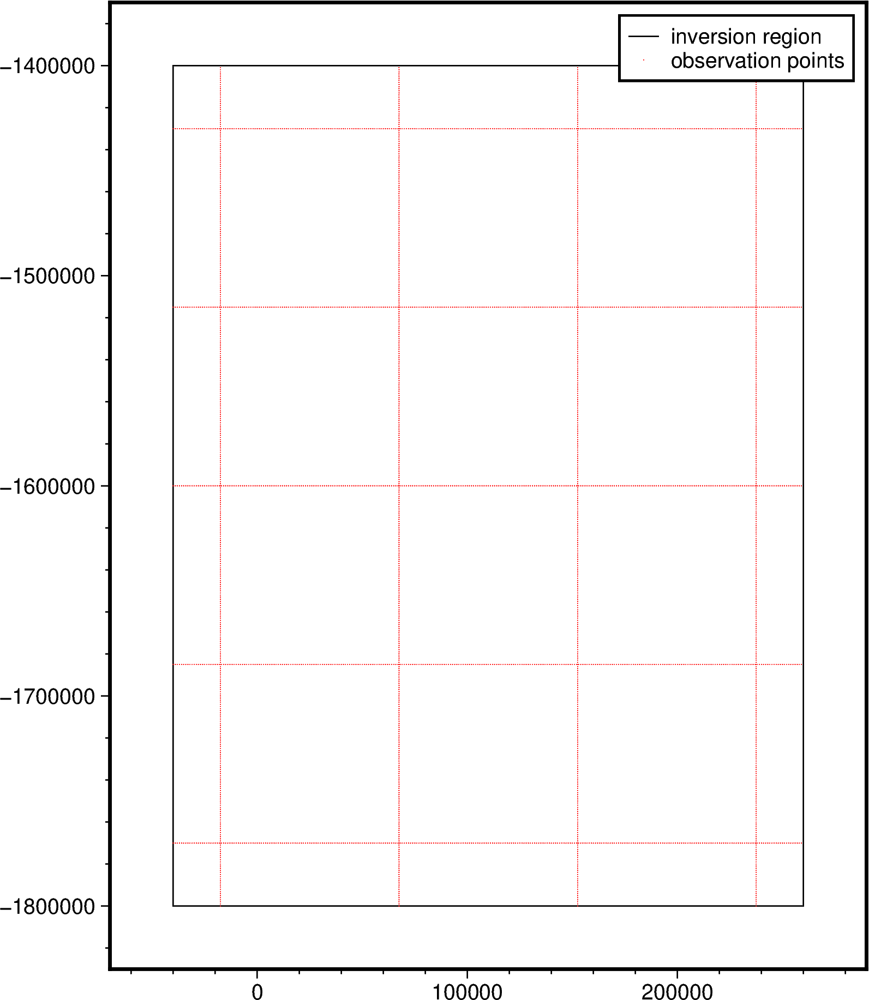

In [108]:
grav_survey_85k = RIS_synth.airborne_survey(
    along_line_spacing=1e3,
    grav_observation_height=1e3,
    NS_line_spacing=85e3,
    EW_line_spacing=85e3,
    region=inversion_region,
    plot=True,
)

In [109]:
85 - 35

50

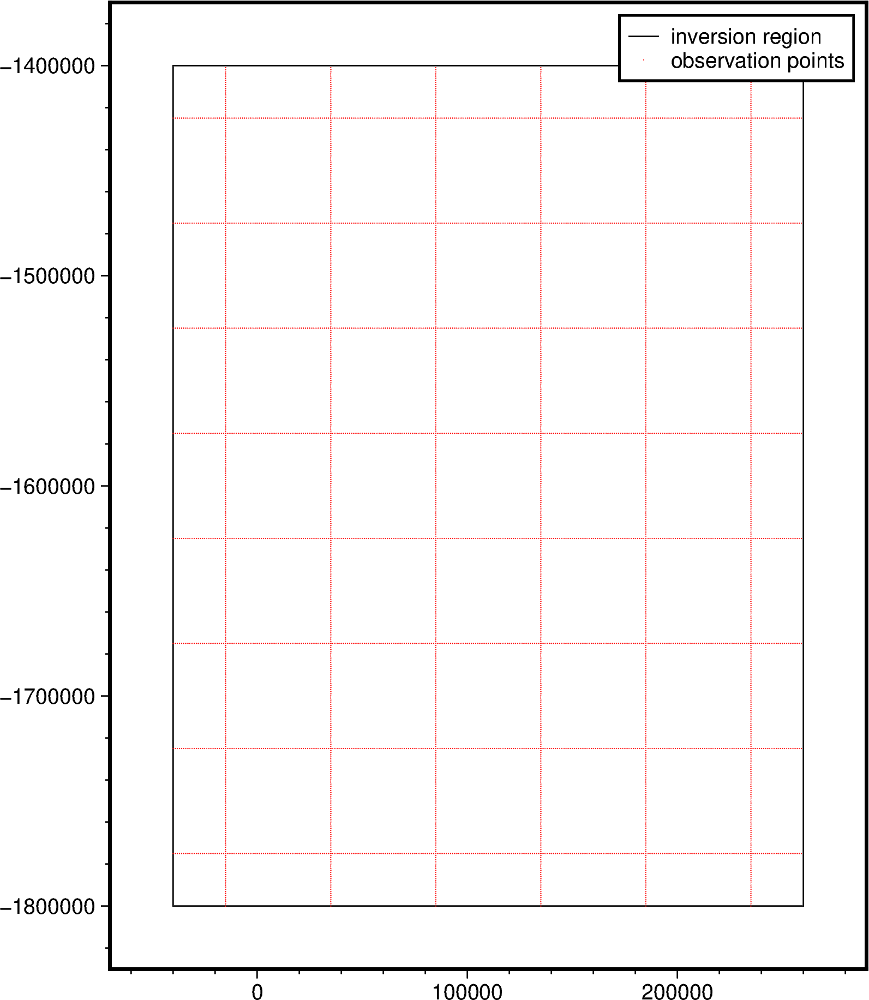

In [111]:
grav_survey_50k = RIS_synth.airborne_survey(
    along_line_spacing=1e3,
    grav_observation_height=1e3,
    NS_line_spacing=50e3,
    EW_line_spacing=50e3,
    region=inversion_region,
    plot=True,
)

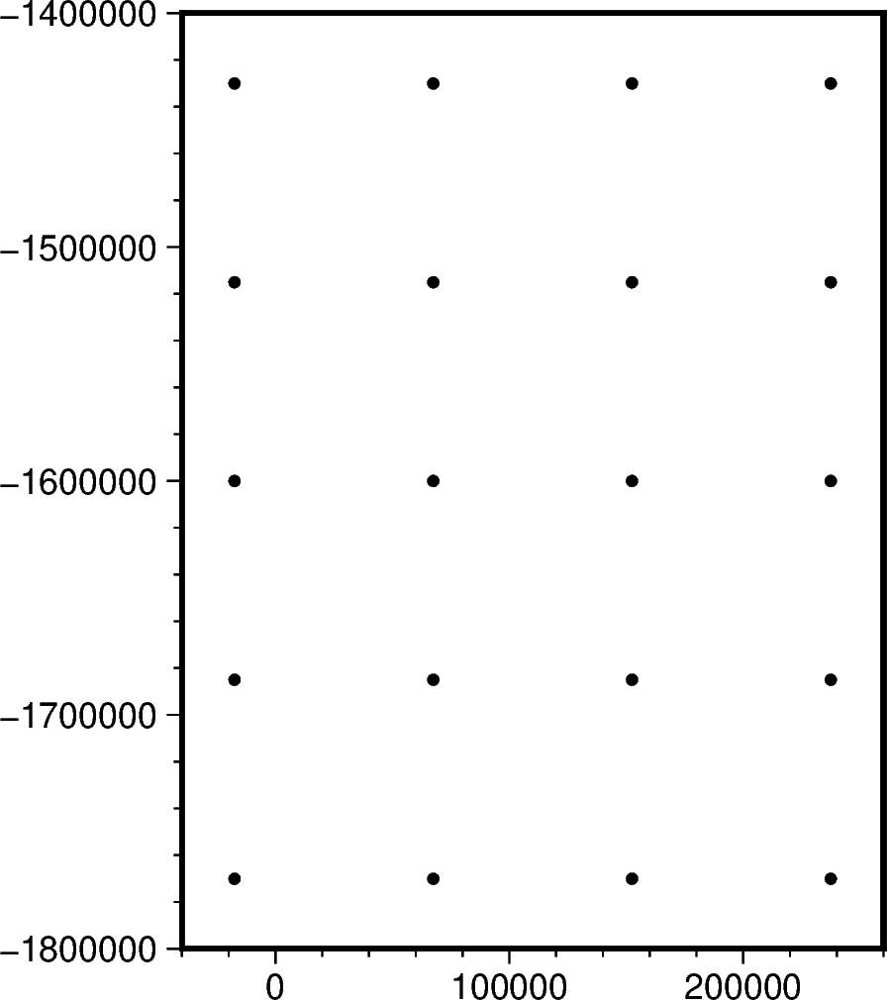

In [191]:
# semi-regularly spaced
constraints_80k = RIS_synth.constraint_layout_number(
    spacing=(80e3, 80e3), region=inversion_region, plot=True
)

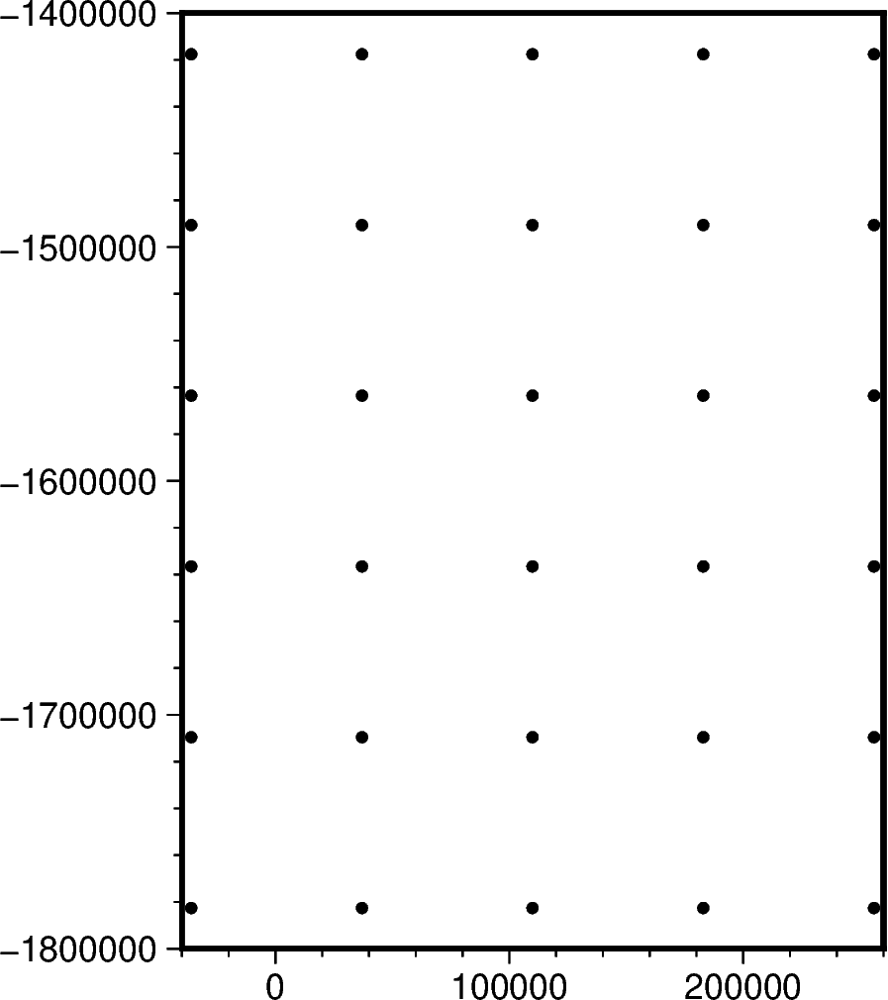

In [132]:
# semi-regularly spaced
constraints_73k = RIS_synth.constraint_layout_number(
    spacing=(73e3, 73e3), region=inversion_region, plot=True
)

In [171]:
len(grav_survey_85k)

3100

In [172]:
len(grav_survey_50k)

4800

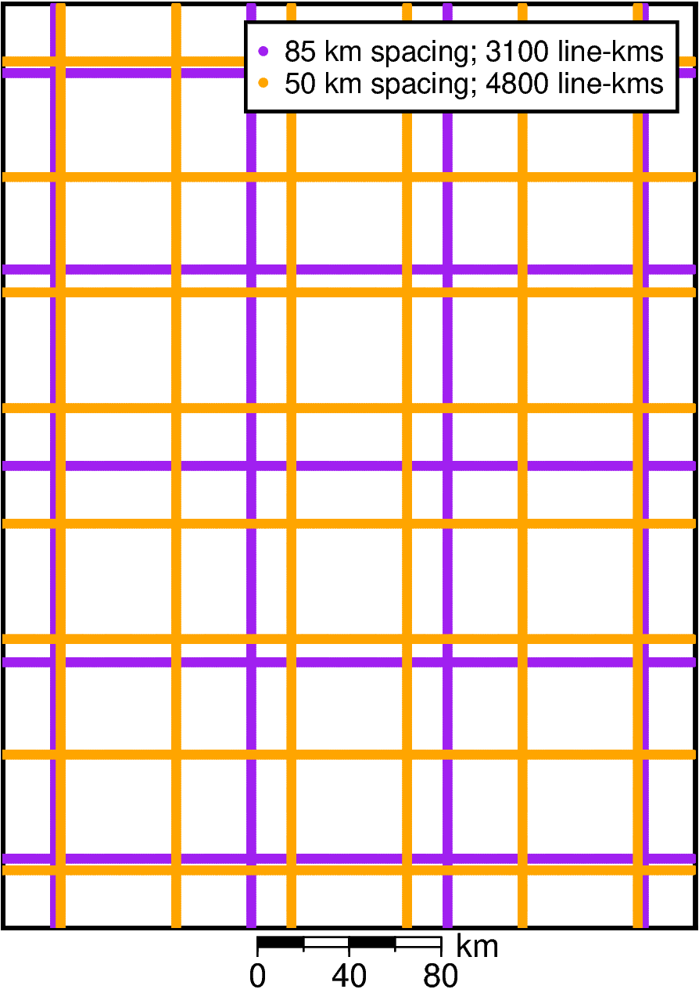

In [181]:
fig = maps.basemap(
    region=inversion_region,
    # frame=True,
    fig_height=10,
    scalebar=True,
    scale_position="JBC+o0c/.1c",
)

fig.plot(
    grav_survey_85k[["easting", "northing"]],
    style="p.1c",
    fill="purple",
    label=f"85 km spacing; {len(grav_survey_85k)} line-kms",
)
fig.plot(
    grav_survey_50k[["easting", "northing"]],
    style="p.1c",
    fill="orange",
    label=f"50 km spacing; {len(grav_survey_50k)} line-kms",
)

fig.legend()
fig.show()

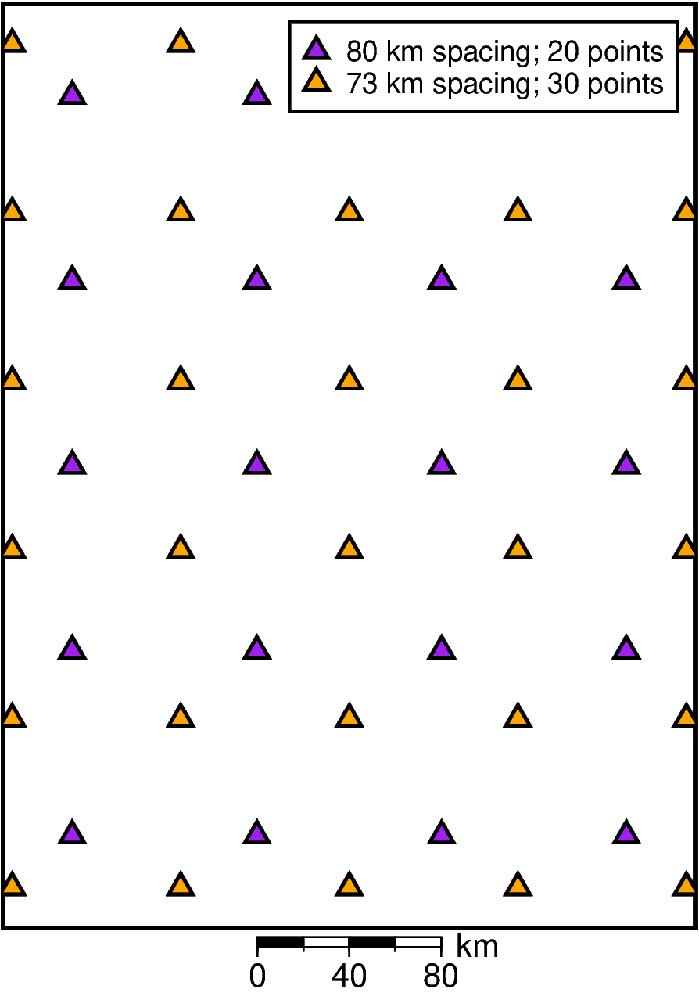

In [182]:
fig = maps.basemap(
    region=inversion_region,
    # frame=True,
    fig_height=10,
    scalebar=True,
    scale_position="JBC+o0c/.1c",
)

fig.plot(
    constraints_80k[["easting", "northing"]],
    style="t.3c",
    fill="purple",
    pen="1p,black",
    label=f"80 km spacing; {len(constraints_80k)} points",
)
fig.plot(
    constraints_73k[["easting", "northing"]],
    style="t.3c",
    fill="orange",
    pen="1p,black",
    label=f"73 km spacing; {len(constraints_73k)} points",
)

fig.legend()
fig.show()